### Algorithm overview

- Compute distance between each pair of in-nodes and out-nodes (geodesic distance on globe, later "distance" can be modified to include trade barriers, etc.)
- Probability/affinity of edge between (u,v) is proportional to in(u) * in(v) / dist(u,v)
- Connect nodes and assign weights according to iterative proportional fitting
- Validate data: pred_exp = sum(outflows from grid cells in i that are international edges) (same for imports)
- Note that the validation step doesn't actually test the network, it just looks at the net flow
- TODO: as of now, we just look at marginals (total imports and exports) rather than country flows. The model would be better if we train it on the marginals (force the network to match exisitng import and export values) and then compare it with actual data.

In [62]:
import matplotlib.pyplot as plt
import numpy as np

def _limplot(df, x_col, y_col, x_log=False, y_log=False, title="Recorded vs Modelled Trade", x_label="Recorded Trade", y_label="Modelled Trade", fontsize=12, xmax=None, ymax=None, show_delta=False, rm_outliers=False):
    df_copy = df.dropna(subset=[x_col, y_col, "ISO3"]).copy()

    if x_log:
        df_copy = df_copy[df_copy[x_col] > 0]
        df_copy["x_plot"] = np.log10(df_copy[x_col])
    else:
        df_copy["x_plot"] = df_copy[x_col]

    if y_log:
        df_copy = df_copy[df_copy[y_col] > 0]
        df_copy["y_plot"] = np.log10(df_copy[y_col])
    else:
        df_copy["y_plot"] = df_copy[y_col]

    if rm_outliers:
        Q1_x, Q3_x = df_copy["x_plot"].quantile([0.25, 0.75])
        Q1_y, Q3_y = df_copy["y_plot"].quantile([0.25, 0.75])
        IQR_x, IQR_y = Q3_x - Q1_x, Q3_y - Q1_y

        df_copy = df_copy[
            (df_copy["x_plot"] >= Q1_x - 1.5 * IQR_x) & (df_copy["x_plot"] <= Q3_x + 1.5 * IQR_x) &
            (df_copy["y_plot"] >= Q1_y - 1.5 * IQR_y) & (df_copy["y_plot"] <= Q3_y + 1.5 * IQR_y)
        ]

    x_vals = df_copy["x_plot"].values
    y_vals = df_copy["y_plot"].values

    if len(x_vals) > 1:
        slope, intercept = np.polyfit(x_vals, y_vals, 1)
        y_pred = slope * x_vals + intercept

        # Metrics
        r2 = 1 - np.sum((y_vals - y_pred)**2) / np.sum((y_vals - np.mean(y_vals))**2)
        rmse = np.sqrt(np.mean((y_vals - x_vals)**2))
        mae = np.mean(np.abs(y_vals - x_vals))
        nrmse = rmse / np.mean(x_vals)
        mape = np.mean(np.abs((y_vals - x_vals) / x_vals)) * 100
        smape = np.mean(2 * np.abs(y_vals - x_vals) / (np.abs(x_vals) + np.abs(y_vals))) * 100
    else:
        r2 = rmse = mae = nrmse = mape = smape = np.nan

    # Compute residuals and CI
    residuals = y_vals - x_vals
    std_residual = np.std(residuals)
    ci = 1.96 * std_residual

    # Define the 1:1 line
    min_val = min(x_vals.min(), y_vals.min())
    max_val = max(x_vals.max(), y_vals.max())
    x_line = np.array([min_val, max_val])
    y_line = x_line

    # Plot
    fig, ax = plt.subplots(figsize=(7, 6))
    ax.scatter(x_vals, y_vals, alpha=0.6, s=25)
    ax.plot(x_line, y_line, 'b--', label='1-to-1 line')
    ax.plot(x_line, y_line + ci, 'r--', label='95% Error Band')
    ax.plot(x_line, y_line - ci, 'r--')


    if show_delta and "delta" in df_copy.columns:
        delta = df_copy["delta"].values

        if x_log and y_log:
            # In log-log space, compute shifted log10 values
            pred = 10 ** y_vals  # Convert from log10 to linear scale
            shifted = pred - delta

            # Prevent log10 of non-positive values
            shifted = np.where(shifted <= 0, pred, shifted)

            shifted_log = np.log10(shifted)
            log_shift = shifted_log - y_vals  # Directional log space shift

            upper_errors = np.where(log_shift < 0, -log_shift, 0)
            lower_errors = np.where(log_shift > 0,  log_shift, 0)

        else:
            # Linear scale: use delta directionally
            lower_errors = np.where(delta < 0, -delta, 0)
            upper_errors = np.where(delta > 0,  delta, 0)

        # Draw asymmetric error bars
        ax.errorbar(
            x_vals,
            y_vals,
            yerr=[upper_errors, lower_errors],
            fmt='none',
            ecolor='gray',
            capsize=3,
            alpha=0.6,
            label='Bilateral delta shift'
        )



    # Annotate points outside the CI
    for i in range(len(df_copy)):
        # if abs(residuals[i]) > ci:
        ax.annotate(df_copy["ISO3"].iloc[i],
                    (x_vals[i], y_vals[i]),
                    fontsize=10,
                    alpha=0.8)

    # Annotate statistics
    ax.text(
        0.05, 0.95,
        f"$R^2$ = {r2:.2f}\n"
        f"RMSE = {rmse:.2f}\n"
        f"NRMSE = {nrmse:.2%}\n"
        f"MAE = {mae:.2f}\n"
        f"MAPE = {mape:.2f}%\n"
        f"sMAPE = {smape:.2f}%",
        transform=ax.transAxes,
        fontsize=fontsize,
        verticalalignment='top',
        bbox=dict(facecolor='white', alpha=0.8)
    )

    ax.legend()
    ax.set_title(title, fontsize=fontsize+2, pad=5)
    ax.set_xlabel(x_label, fontsize=fontsize)
    ax.set_ylabel(y_label, fontsize=fontsize)
    ax.tick_params(axis='x', labelsize=fontsize)
    ax.tick_params(axis='y', labelsize=fontsize)
    if xmax is not None:
        ax.set_xlim(right=xmax)
    if ymax is not None:
        ax.set_ylim(top=ymax)
    ax.set_aspect('equal', adjustable='box')
    plt.tight_layout()
    plt.show()


# Stage 1: 5 degree

In [286]:
import sesame as ssm
import os
import xarray as xr

grid_data_path = os.path.join('data', 'L.T.iron_flows.2008-2016_adj.a.nc')
ds_raw = xr.open_dataset(grid_data_path)
# ds_raw = ds_raw.isel(time=-1).drop_vars("time")

variables = ['source_1_adj',
 'sink_1_adj',
 'source_2_adj',
 'sink_2_adj']

dataset_list = []

for variable in variables:
    for time in list(ds_raw.time.values):
        print(time)
        print(variable)
        ds = ssm.grid_2_grid(raster_data=grid_data_path, agg_function="SUM", variable_name=variable, long_name=variable, time=time,
                            netcdf_variable=variable, resolution=5, verbose=True)
        dataset_list.append(ds)

merged_ds = xr.merge(dataset_list)
merged_ds.to_netcdf(os.path.join('data', 'L.T.iron_flows.2008-2016_adj.5deg.a.nc'))
merged_ds

2008-01-01T00:00:00.000000000
source_1_adj
Reading the nc file.
Raw global SUM: nan
Re-gridded global SUM: 1377899251.553
Re-gridding completed!
2009-01-01T00:00:00.000000000
source_1_adj
Reading the nc file.
Raw global SUM: nan
Re-gridded global SUM: 1284768878.527
Re-gridding completed!
2010-01-01T00:00:00.000000000
source_1_adj
Reading the nc file.
Raw global SUM: nan
Re-gridded global SUM: 1466241187.158
Re-gridding completed!
2011-01-01T00:00:00.000000000
source_1_adj
Reading the nc file.
Raw global SUM: nan
Re-gridded global SUM: 1566328939.372
Re-gridding completed!
2012-01-01T00:00:00.000000000
source_1_adj
Reading the nc file.
Raw global SUM: nan
Re-gridded global SUM: 1576145144.832
Re-gridding completed!
2013-01-01T00:00:00.000000000
source_1_adj
Reading the nc file.
Raw global SUM: nan
Re-gridded global SUM: 1636959617.811
Re-gridding completed!
2014-01-01T00:00:00.000000000
source_1_adj
Reading the nc file.
Raw global SUM: nan
Re-gridded global SUM: 1696200819.471
Re-gridd

<xarray.Dataset> Size: 768kB
Dimensions:       (lat: 36, lon: 72, time: 9)
Coordinates:
  * lat           (lat) float64 288B -87.5 -82.5 -77.5 -72.5 ... 77.5 82.5 87.5
  * lon           (lon) float64 576B -177.5 -172.5 -167.5 ... 167.5 172.5 177.5
  * time          (time) datetime64[ns] 72B 2008-01-01 2009-01-01 ... 2016-01-01
Data variables:
    source_1_adj  (time, lat, lon) float64 187kB nan nan nan nan ... nan nan nan
    grid_area     (lat, lon) float64 21kB 1.36e+10 1.36e+10 ... 1.36e+10
    sink_1_adj    (time, lat, lon) float64 187kB nan nan nan nan ... nan nan nan
    source_2_adj  (time, lat, lon) float64 187kB nan nan nan nan ... nan nan nan
    sink_2_adj    (time, lat, lon) float64 187kB nan nan nan nan ... nan nan nan
Attributes:
    Project:         Surface Earth System Analysis and Modeling Environment (...
    Research Group:  Integrated Earth System Dynamics
    Institution:     McGill University
    Contact:         eric.galbraith@mcgill.ca
    Data Version:    V1.0

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 16902.73
Edges after gravity calculation: 177883
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 177883
IPF complete. Flow matrix generated with 177883 edges.


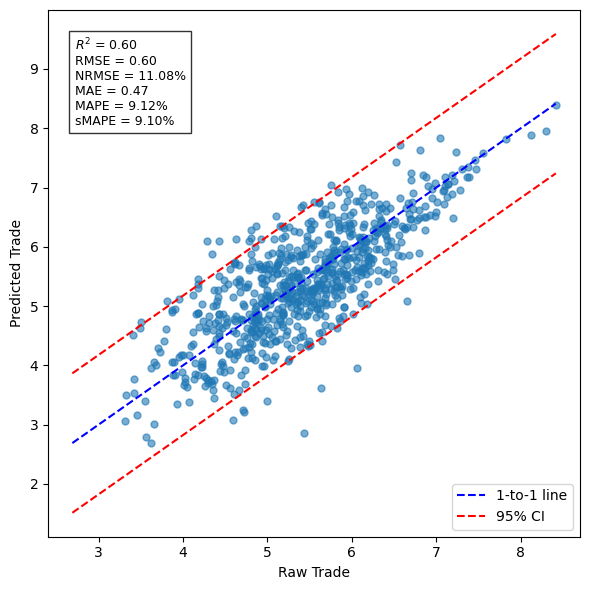

NetCDF file saved to: gravity_model_output_s1.5deg.nc


,exporter,importer,tonnes,year,exp_ISO3,imp_ISO3,raw_tonnes,pred_tonnes,ISO3
0,Australia,Australia,1.239632e+06,2016,AUS,AUS,1.231741e+06,1.103675e+06,AUS→AUS
1,Australia,Austria,2.059427e+06,2016,AUS,AUT,1.987912e+06,1.726405e+06,AUS→AUT
2,Australia,Brazil,9.812140e+06,2016,AUS,BRA,9.721533e+06,3.284710e+06,AUS→BRA
3,Australia,Canada,2.691466e+06,2016,AUS,CAN,2.572959e+06,2.374574e+06,AUS→CAN
4,Australia,China,2.515850e+08,2016,AUS,CHN,2.601855e+08,2.434975e+08,AUS→CHN
...,...,...,...,...,...,...,...,...,...
721,United States,South Korea,3.004583e+06,2016,USA,KOR,3.159846e+06,2.456787e+06,USA→KOR
722,United States,Spain,8.619005e+05,2016,USA,ESP,8.753216e+05,6.623879e+05,USA→ESP
723,United States,Sweden,2.155000e+05,2016,USA,SWE,2.213164e+05,3.078321e+05,USA→SWE
724,United States,United Kingdom,4.042098e+05,2016,USA,GBR,4.013644e+05,4.384373e+05,USA→GBR


In [289]:
%load_ext autoreload
%autoreload 2

from FlowNetwork import FlowNetwork
import os
import pandas as pd

verbose = True

# Initialize the flow network with NetCDF data and variable names
grid_data_path = os.path.join('data', 'L.T.iron_flows.2008-2016_adj.5deg.a.nc')
trade_csv_path = os.path.join('data', 'iron_raw_import_export.csv')
json_path = os.path.join('data', 'grouped_region.json')
bilateral_csv_path = os.path.join('data', 'iron_io_stage_1_adj.csv')
trade_tariff_path = os.path.join('data', 'tariffsPairs_88_21_vbeta1-2024-12.csv')

fn = FlowNetwork(grid_data_path, 'source_1_adj', 'sink_1_adj', time='2016')
fn.gravity_model(distance='tariff', threshold_percentile=100, trade_tariff_path=trade_tariff_path, year=2016, tariff_weight_factor=2, verbose=True)
fn.ipf_flows(max_iters=100, tol=1e-6, verbose=verbose)
fn.bilateral_flow(2016, json_path)
df_1, metrics = fn.validate_bilateral(bilateral_csv_path, year=2016, column='tonnes_adj_1', x_log=True, y_log=True, rm_outliers=False)
fn.save_to_netcdf(filename="gravity_model_output_s1.5deg.nc")
df_1

In [50]:
import xarray as xr
import numpy as np
def gridded_inflow_outflow(ds_flow):
    # Extract 1D coordinate arrays and flow variables
    origin_lat = ds_flow['origin_lat'].values
    origin_lon = ds_flow['origin_lon'].values
    destination_lat = ds_flow['destination_lat'].values
    destination_lon = ds_flow['destination_lon'].values

    outflow = ds_flow['outflow'].values
    inflow = ds_flow['inflow'].values

    # Round lat/lon to 1-degree grid centers
    origin_lat_rounded = np.round(origin_lat, 1)
    origin_lon_rounded = np.round(origin_lon, 1)
    destination_lat_rounded = np.round(destination_lat, 1)
    destination_lon_rounded = np.round(destination_lon, 1)

    # Create grid for lat/lon
    lat_vals = np.arange(-89.5, 89.5, 1)
    lon_vals = np.arange(-179.5, 179.5, 1)

    # Initialize empty 2D arrays
    outflow_grid = np.full((len(lat_vals), len(lon_vals)), np.nan)
    inflow_grid = np.full((len(lat_vals), len(lon_vals)), np.nan)

    # Map outflow to grid
    for lat, lon, val in zip(origin_lat_rounded, origin_lon_rounded, outflow):
        lat_idx = np.where(lat_vals == lat)[0]
        lon_idx = np.where(lon_vals == lon)[0]
        if lat_idx.size > 0 and lon_idx.size > 0:
            outflow_grid[lat_idx[0], lon_idx[0]] = val

    # Map inflow to grid
    for lat, lon, val in zip(destination_lat_rounded, destination_lon_rounded, inflow):
        lat_idx = np.where(lat_vals == lat)[0]
        lon_idx = np.where(lon_vals == lon)[0]
        if lat_idx.size > 0 and lon_idx.size > 0:
            inflow_grid[lat_idx[0], lon_idx[0]] = val

    # Create xarray Dataset
    ds_grid = xr.Dataset(
        {
            "outflow": (["lat", "lon"], outflow_grid),
            "inflow": (["lat", "lon"], inflow_grid),
        },
        coords={
            "lat": lat_vals,
            "lon": lon_vals,
        },
        attrs={
            "description": "Gridded 1° inflow and outflow dataset",
            "units": ds_flow.flow_units if "flow_units" in ds_flow.attrs else "tonnes per grid",
        }
    )

    return ds_grid

In [51]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.cm as cm
import cartopy.crs as ccrs
import sesame as ssm

def plot_flow_network(
    flow, origin_coords, destination_coords,
    ds_bg,
    num_edges=1000,
    vmin=None, vmax=None,
    extend_max=False, extend_min=False,
    title="Flow Network",
    label=None,
    color='coolwarm',
    levels=10,
    edge_thickness=1.5,
    edge_alpha=0.5,
    edge_cmap="plasma"
):
    # Clean flow
    flow_clean = np.where(np.isfinite(flow), flow, 0)

    # Plot SESAME background (e.g., netflow)
    ax = ssm.plot_map(
        variable="netflow",
        dataset=ds_bg,
        vmin=vmin, vmax=vmax,
        extend_max=extend_max, extend_min=extend_min,
        color=color,
        levels=levels,
        title=title,
        label=label,
        show=False,
        out_bound=False,
        remove_ata=True
    )

    # Compute top N edge indices
    flat_indices = np.argpartition(flow_clean.ravel(), -num_edges)[-num_edges:]
    top_indices = flat_indices[np.argsort(flow_clean.ravel()[flat_indices])][::-1]
    out_idxs, in_idxs = np.unravel_index(top_indices, flow.shape)

    # Extract flow values and normalize for edge styling
    flow_vals = flow_clean[out_idxs, in_idxs]
    norm = mcolors.Normalize(vmin=flow_vals.min(), vmax=flow_vals.max())
    cmap = plt.get_cmap(edge_cmap)

    min_width, max_width = 0.1, 5

    for out_i, in_j, val in zip(out_idxs, in_idxs, flow_vals):
        if val > 0:
            lat1, lon1 = origin_coords[out_i]
            lat2, lon2 = destination_coords[in_j]
            color = cmap(norm(val))
            width = min_width + (max_width - min_width) * norm(val)
            ax.plot(
                [lon1, lon2], [lat1, lat2],
                color=color,
                linewidth=width,
                alpha=edge_alpha,
                transform=ccrs.PlateCarree()
            )

    # Colorbar for edges
    sm = cm.ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])
    fig = plt.gcf()
    cbar = fig.colorbar(sm, ax=ax, orientation='vertical', shrink=0.6, pad=0.01, aspect=30)
    cbar.set_label("Flow Magnitude log10(tonnes Fe)", fontsize=9)
    cbar.ax.tick_params(labelsize=8)

    # Calculate share of flow visualized (using absolute values)
    flat_flow = np.abs(flow.ravel())
    sorted_flow = np.sort(flat_flow)[::-1]  # Descending
    top_1200_sum = sorted_flow[:1200].sum()
    total_sum = sorted_flow.sum()
    percent = (top_1200_sum / total_sum) * 100

    print(f"Top 1200 edges represent: {percent:.2f}% of total flow magnitude")


    plt.show()


In [70]:
import xarray as xr
# Load flow matrix dataset
ds_flow = xr.load_dataset("gravity_model_output_s1.5deg.nc")
# flow = xr.load_dataset("gravity_model_output_s1.5deg.nc")
flow = np.log10(ds_flow["flow"].values)
origin_coords = list(zip(ds_flow["origin_lat"].values, ds_flow["origin_lon"].values))
destination_coords = list(zip(ds_flow["destination_lat"].values, ds_flow["destination_lon"].values))

# Load background dataset with outflow/inflow data
ds_grid = gridded_inflow_outflow(ds_flow)
ds_grid["netflow"] = ds_grid["outflow"] - ds_grid["inflow"]
# grid_ds = xr.open_dataset("/Users/faisal/Documents/GitHub/SESAME/src/sesame/data/G.land_sea_mask.1deg.nc")
# ds_grid["netflow"] = (ds_grid["netflow"] * 1e6) / grid_ds["grid_area"]

Top 1200 edges represent: nan% of total flow magnitude


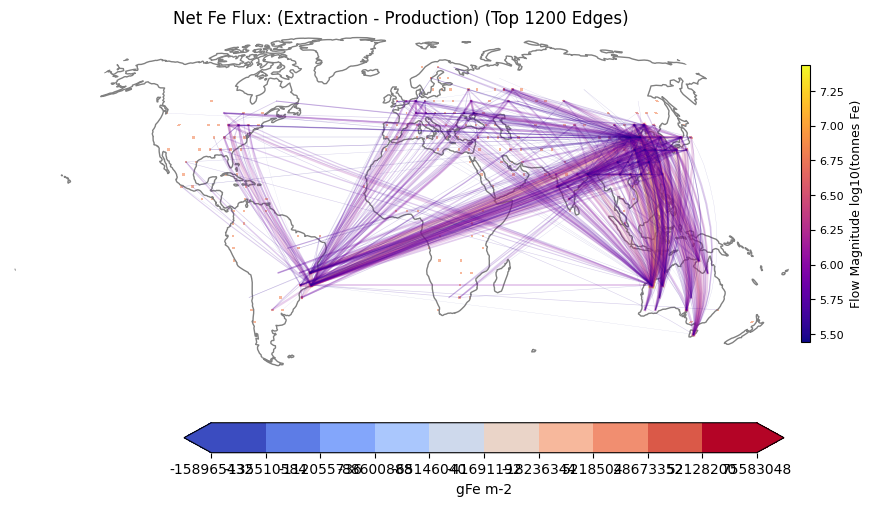

In [71]:
plot_flow_network(
    ds_bg=ds_grid,
    flow=flow,
    origin_coords=origin_coords,
    destination_coords=destination_coords,
    num_edges=1000,
    # vmin=-100, vmax=100,
    title="Net Fe Flux: (Extraction - Production) (Top 1200 Edges)",
    label="gFe m-2",
    extend_min=True,
    extend_max=True,
    edge_alpha=0.2, edge_thickness=1
)


# Stage 1

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 14940.56
Edges after gravity calculation: 7965052
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7965052
IPF complete. Flow matrix generated with 7965052 edges.


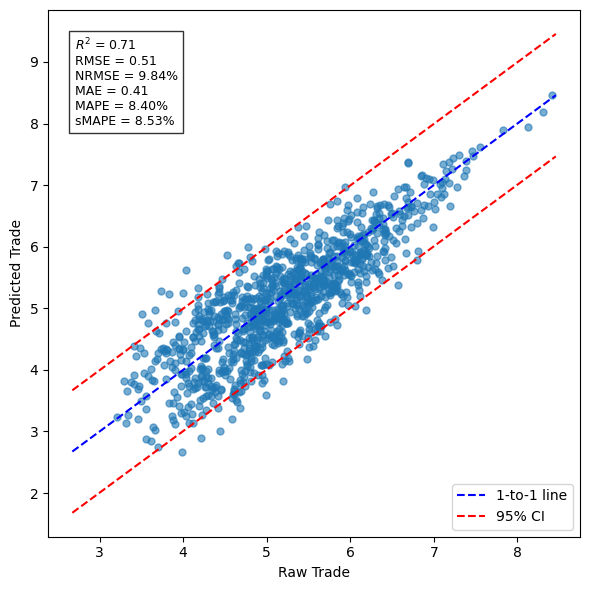

,exporter,importer,tonnes,year,exp_ISO3,imp_ISO3,raw_tonnes,pred_tonnes,ISO3
0,Australia,Australia,1.239632e+06,2016,AUS,AUS,1.231741e+06,1.488566e+06,AUS→AUS
1,Australia,Austria,2.059427e+06,2016,AUS,AUT,1.987912e+06,1.040802e+06,AUS→AUT
2,Australia,Belgium,1.573364e+06,2016,AUS,BEL,1.583892e+06,7.863694e+05,AUS→BEL
3,Australia,Brazil,9.812140e+06,2016,AUS,BRA,9.721533e+06,2.127873e+06,AUS→BRA
4,Australia,Canada,2.691466e+06,2016,AUS,CAN,2.572959e+06,9.603336e+05,AUS→CAN
...,...,...,...,...,...,...,...,...,...
1019,United States,Spain,8.619005e+05,2016,USA,ESP,8.753216e+05,8.895141e+05,USA→ESP
1020,United States,Sweden,2.155000e+05,2016,USA,SWE,2.213164e+05,2.803073e+05,USA→SWE
1021,United States,Taiwan,1.070165e+06,2016,USA,TWN,1.094679e+06,6.329389e+05,USA→TWN
1022,United States,United Kingdom,4.042098e+05,2016,USA,GBR,4.013644e+05,4.995169e+05,USA→GBR


In [76]:
%load_ext autoreload
%autoreload 2

from FlowNetwork import FlowNetwork
import os
import pandas as pd

verbose = True

# Initialize the flow network with NetCDF data and variable names
grid_data_path = os.path.join('data', 'L.T.iron_flows.2008-2016_adj.a.nc')
trade_csv_path = os.path.join('data', 'iron_raw_import_export.csv')
json_path = os.path.join('data', 'grouped_region.json')
bilateral_csv_path = os.path.join('data', 'iron_io_stage_1_adj.csv')
trade_tariff_path = os.path.join('data', 'tariffsPairs_88_21_vbeta1-2024-12.csv')

fn = FlowNetwork(grid_data_path, 'source_1_adj', 'sink_1_adj', time='2016')
fn.gravity_model(distance='tariff', threshold_percentile=100, trade_tariff_path=trade_tariff_path, year=2016, tariff_weight_factor=2, verbose=True)
fn.ipf_flows(max_iters=100, tol=1e-6, verbose=verbose)
fn.bilateral_flow(2016, json_path)
df_1, metrics = fn.validate_bilateral(bilateral_csv_path, year=2016, column='tonnes_adj_1', x_log=True, y_log=True, rm_outliers=False)
df_1
fn.save_to_netcdf(filename="gravity_model_output_s1.nc")

In [25]:
%load_ext autoreload
%autoreload 2

from FlowNetwork import FlowNetwork
import os
import pandas as pd

verbose = True

# Initialize the flow network with NetCDF data and variable names
grid_data_path = os.path.join('data', 'L.T.iron_flows.2008-2016_adj.a.nc')
trade_csv_path = os.path.join('data', 'iron_raw_import_export.csv')
json_path = os.path.join('data', 'grouped_region.json')
bilateral_csv_path = os.path.join('data', 'iron_io_stage_1_adj.csv')
trade_tariff_path = os.path.join('data', 'tariffsPairs_88_21_vbeta1-2024-12.csv')

fn = FlowNetwork(grid_data_path, 'source_1_adj', 'sink_1_adj', time='2016')
fn.gravity_model(distance='tariff', threshold_percentile=20, trade_tariff_path=trade_tariff_path, year=2016, tariff_weight_factor=2, verbose=True)
fn.ipf_flows(max_iters=100, tol=1e-6, verbose=verbose)
# df_1 = fn.bilateral_flow(2016, json_path)
# df_1, metrics = fn.validate_bilateral(bilateral_csv_path, year=2016, column='tonnes_adj_1', x_log=True, y_log=True, rm_outliers=False)
ds_centrality = fn.compute_cell_centrality(method='eigenvector', as_xarray=True)
ds_centrality


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Running Gravity Model with thresholding at 20% of possible edges...
[EXPONENTIAL] Mean adjusted distance: 14940.56
Edges after gravity calculation: 7965052
After thresholding there are 2823586 edges containing 99.7% of total flow mass
Number of nodes after thresholding: 14592
Percent of inflow contained in remaining nodes: 100.0%
Percent of outflow contained in remaining nodes: 100.0%
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 2823586
IPF complete. Flow matrix generated with 2823586 edges.


<xarray.Dataset> Size: 523kB
Dimensions:                      (lat: 180, lon: 360)
Coordinates:
  * lat                          (lat) float64 1kB -89.5 -88.5 ... 88.5 89.5
  * lon                          (lon) float64 3kB -179.5 -178.5 ... 178.5 179.5
Data variables:
    cell_centrality_eigenvector  (lat, lon) float64 518kB nan nan ... nan nan

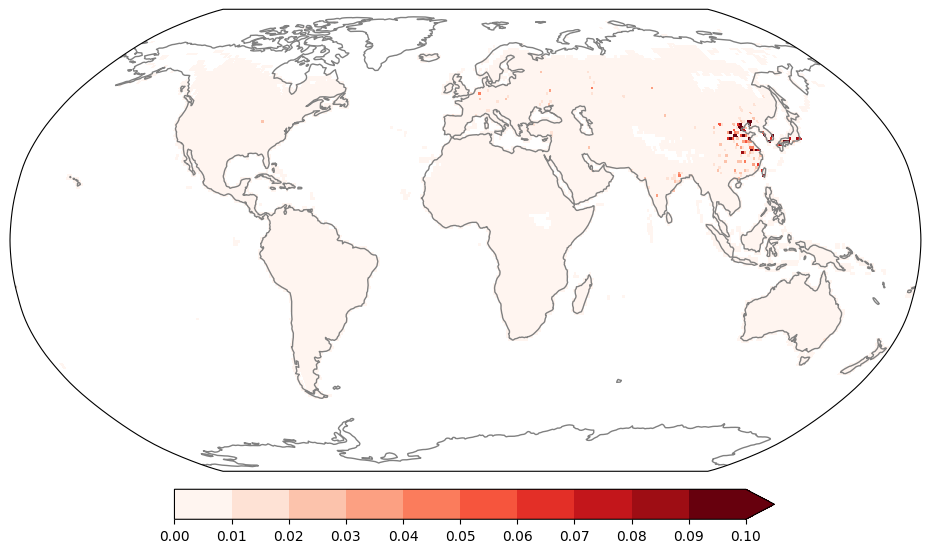

<GeoAxes: >

In [28]:
import sesame as ssm

ssm.plot_map(ds_centrality, "cell_centrality_eigenvector", color="Reds", vmin=0, vmax=0.1, extend_max=True)

In [29]:
df_centrality = ssm.grid_2_table(ds_centrality, "cell_centrality_eigenvector", agg_function="SUM")
df_centrality

,ISO3,cell_centrality_eigenvector
0,ABW,2.920392e-54
1,AFG,1.010111e-04
2,AGO,3.879069e-04
3,AIA,0.000000e+00
4,ALB,2.655695e-04
...,...,...
241,YEM,4.655545e-52
242,ZAF,1.158217e-02
243,ZMB,1.576173e-04
244,ZWE,4.650962e-06


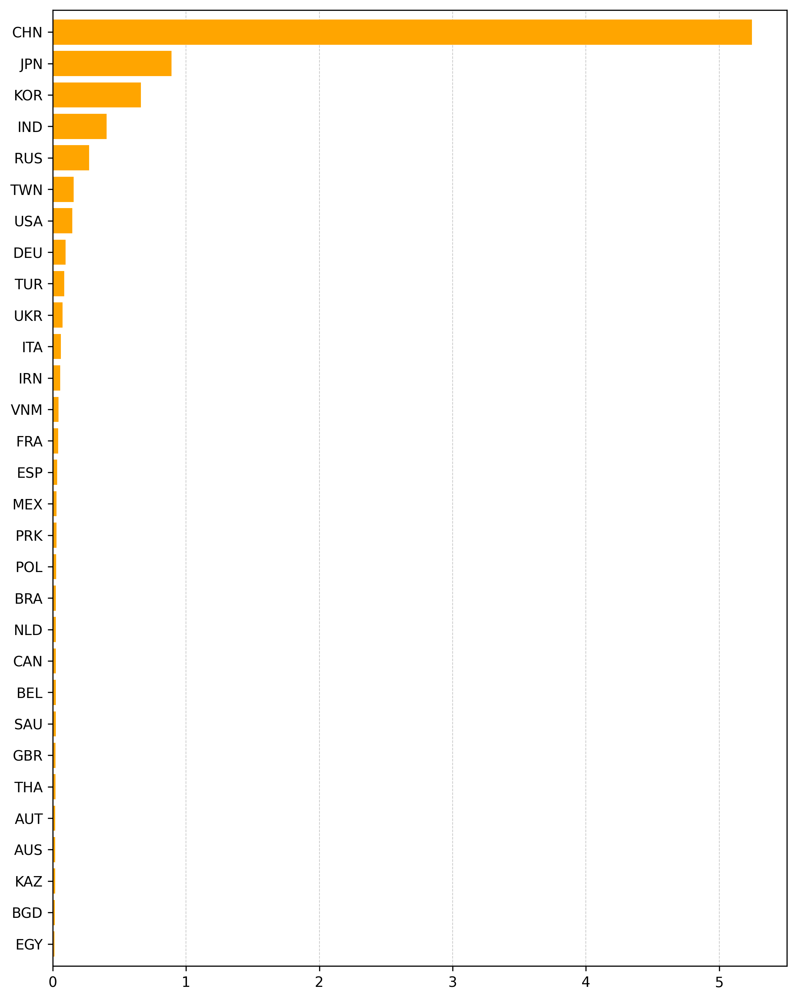

In [30]:
import matplotlib.pyplot as plt

df_sorted = df_centrality.sort_values('cell_centrality_eigenvector', ascending=False)
df_sorted = df_sorted.head(30)	
fig, ax = plt.subplots(figsize=(8, 10), dpi=300)
ax.barh(df_sorted["ISO3"], df_sorted["cell_centrality_eigenvector"], color="Orange", edgecolor='none')
ax.invert_yaxis()


# grid styling
ax.xaxis.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
ax.set_axisbelow(True)

# remove default margins
ax.margins(y=0.01)

fig.tight_layout()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 14940.56
Edges after gravity calculation: 7965052
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7965052
IPF complete. Flow matrix generated with 7965052 edges.


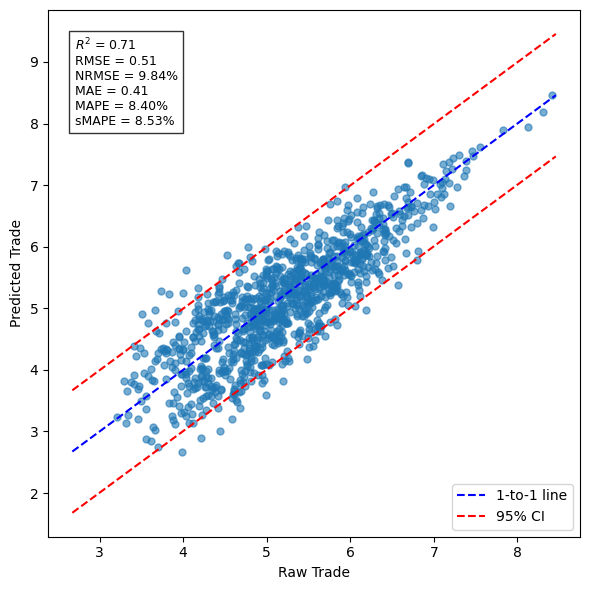

,ISO3,ISCI
5,CHN,0.962033
16,JPN,0.177587
17,KOR,0.128718
14,IND,0.111694
24,RoW Asia and Pacific,0.064471
21,RUS,0.064346
30,TWN,0.052938
31,USA,0.031406
27,RoW Middle East,0.026954
7,DEU,0.020645


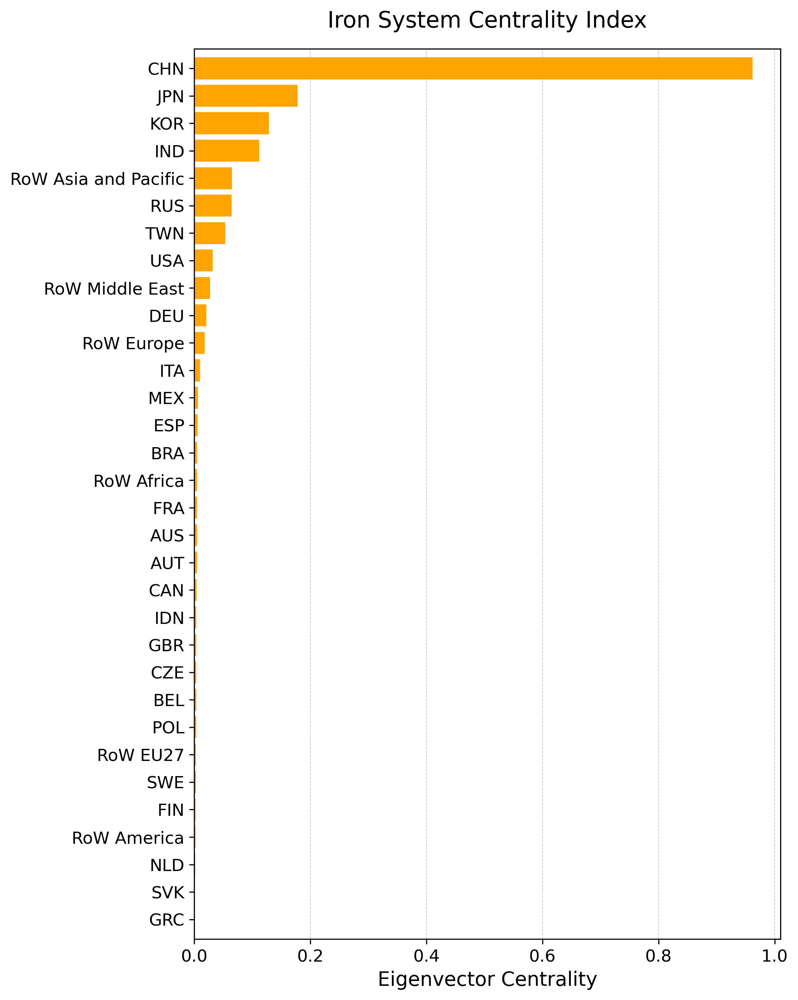

In [83]:
%load_ext autoreload
%autoreload 2

from FlowNetwork import FlowNetwork
import os
import pandas as pd

verbose = True

# Initialize the flow network with NetCDF data and variable names
grid_data_path = os.path.join('data', 'L.T.iron_flows.2008-2016_adj.a.nc')
trade_csv_path = os.path.join('data', 'iron_raw_import_export.csv')
json_path = os.path.join('data', 'grouped_region.json')
bilateral_csv_path = os.path.join('data', 'iron_io_stage_1_adj.csv')
trade_tariff_path = os.path.join('data', 'tariffsPairs_88_21_vbeta1-2024-12.csv')

fn = FlowNetwork(grid_data_path, 'source_1_adj', 'sink_1_adj', time='2016')
fn.gravity_model(distance='tariff', threshold_percentile=100, trade_tariff_path=trade_tariff_path, year=2016, tariff_weight_factor=2, verbose=True)
fn.ipf_flows(max_iters=100, tol=1e-6, verbose=verbose)
df_1 = fn.bilateral_flow(2016, json_path)
df_1, metrics = fn.validate_bilateral(bilateral_csv_path, year=2016, column='tonnes_adj_1', x_log=True, y_log=True, rm_outliers=False)
isci = fn.compute_ISCI(method='eigenvector', plot=True)
isci

In [47]:
metrics

{'R2': np.float64(0.7080188546975678),
 'RMSE': np.float64(0.514108133797454),
 'NRMSE': np.float64(0.09842157091891675),
 'MAE': np.float64(0.4138462961574908),
 'MAPE': np.float64(8.404054453282471),
 'sMAPE': np.float64(8.525361090022834),
 'n_points': 1024}

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 14940.56
Edges after gravity calculation: 7965052
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7965052
IPF complete. Flow matrix generated with 7965052 edges.


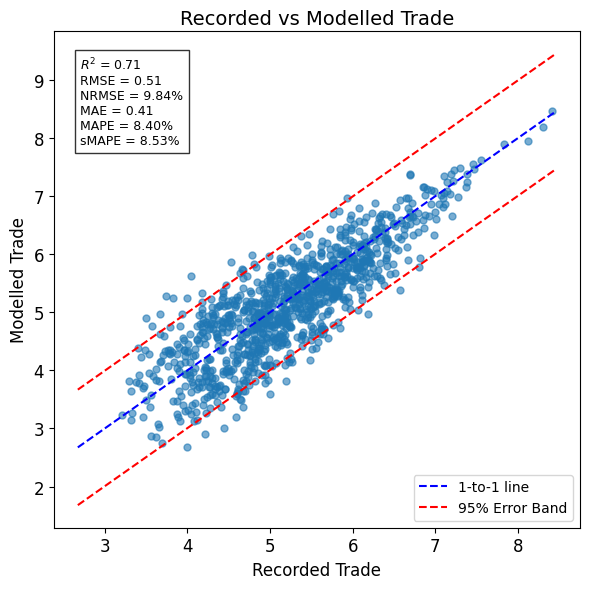

,exporter,importer,tonnes,year,exp_ISO3,imp_ISO3,raw_tonnes,pred_tonnes,ISO3
0,Australia,Australia,1.239632e+06,2016,AUS,AUS,1.231741e+06,1.488566e+06,AUS→AUS
1,Australia,Austria,2.059427e+06,2016,AUS,AUT,1.987912e+06,1.040802e+06,AUS→AUT
2,Australia,Belgium,1.573364e+06,2016,AUS,BEL,1.583892e+06,7.863694e+05,AUS→BEL
3,Australia,Brazil,9.812140e+06,2016,AUS,BRA,9.721533e+06,2.127873e+06,AUS→BRA
4,Australia,Canada,2.691466e+06,2016,AUS,CAN,2.572959e+06,9.603336e+05,AUS→CAN
...,...,...,...,...,...,...,...,...,...
1019,United States,Spain,8.619005e+05,2016,USA,ESP,8.753216e+05,8.895141e+05,USA→ESP
1020,United States,Sweden,2.155000e+05,2016,USA,SWE,2.213164e+05,2.803073e+05,USA→SWE
1021,United States,Taiwan,1.070165e+06,2016,USA,TWN,1.094679e+06,6.329389e+05,USA→TWN
1022,United States,United Kingdom,4.042098e+05,2016,USA,GBR,4.013644e+05,4.995169e+05,USA→GBR


In [32]:
%load_ext autoreload
%autoreload 2

from FlowNetwork import FlowNetwork
import os
import pandas as pd

verbose = True

# Initialize the flow network with NetCDF data and variable names
grid_data_path = os.path.join('data', 'L.T.iron_flows.2008-2016_adj.a.nc')
trade_csv_path = os.path.join('data', 'iron_raw_import_export.csv')
json_path = os.path.join('data', 'grouped_region.json')
bilateral_csv_path = os.path.join('data', 'iron_io_stage_1_adj.csv')
trade_tariff_path = os.path.join('data', 'tariffsPairs_88_21_vbeta1-2024-12.csv')

fn = FlowNetwork(grid_data_path, 'source_1_adj', 'sink_1_adj', time='2016')
fn.gravity_model(distance='tariff', threshold_percentile=100, trade_tariff_path=trade_tariff_path, year=2016, tariff_weight_factor=2, verbose=True)
fn.ipf_flows(max_iters=100, tol=1e-6, verbose=verbose)
df_1 = fn.bilateral_flow(2016, json_path)
df_1, metrics = fn.validate_bilateral(bilateral_csv_path, year=2016, column='tonnes_adj_1', x_log=True, y_log=True, title="Recorded vs Modelled Trade", x_label="Recorded Trade", y_label="Modelled Trade", fontsize=12)
df_1.to_csv("model_output_s1.csv", index=False)
df_1

In [55]:
df_1 = pd.read_csv("model_output_s1.csv")
# 1. Total exports per country-year (including domestic)
exports_raw = df_1.groupby(["exp_ISO3", "year"], as_index=False)["raw_tonnes"].sum().rename(columns={"tonnes": "raw_exports"})

# 2. Total imports per country-year (including domestic)
imports_raw = df_1.groupby(["imp_ISO3", "year"], as_index=False)["raw_tonnes"].sum().rename(columns={"tonnes": "raw_imports"})

exports_raw, imports_raw


(                exp_ISO3  year    raw_tonnes
 0                    AUS  2016  4.529976e+08
 1                    AUT  2016  2.342714e+06
 2                    BEL  2016  5.292910e+06
 3                    BRA  2016  2.341280e+08
 4                    CAN  2016  2.380809e+07
 5                    CHN  2016  3.649384e+08
 6                    CZE  2016  2.025598e+06
 7                    DEU  2016  1.754363e+07
 8                    ESP  2016  4.738948e+06
 9                    FIN  2016  1.057710e+06
 10                   FRA  2016  7.688114e+06
 11                   GBR  2016  8.323477e+06
 12                   GRC  2016  8.580326e+05
 13                   IDN  2016  3.814966e+06
 14                   IND  2016  1.223243e+08
 15                   ITA  2016  1.031782e+07
 16                   JPN  2016  4.208992e+07
 17                   KOR  2016  1.872583e+07
 18                   MEX  2016  2.428074e+07
 19                   NLD  2016  3.095861e+06
 20                   POL  2016  4

In [56]:
# 1. Total exports per country-year (including domestic)
exports_pred = df_1.groupby(["exp_ISO3", "year"], as_index=False)["pred_tonnes"].sum().rename(columns={"tonnes": "pred_exports"})

# 2. Total imports per country-year (including domestic)
imports_pred = df_1.groupby(["imp_ISO3", "year"], as_index=False)["pred_tonnes"].sum().rename(columns={"tonnes": "pred_imports"})

exports_pred, imports_pred

(                exp_ISO3  year   pred_tonnes
 0                    AUS  2016  4.436715e+08
 1                    AUT  2016  4.006564e+06
 2                    BEL  2016  2.480229e+06
 3                    BRA  2016  2.380906e+08
 4                    CAN  2016  2.770352e+07
 5                    CHN  2016  2.788644e+08
 6                    CZE  2016  2.710024e+06
 7                    DEU  2016  2.148868e+07
 8                    ESP  2016  7.258353e+06
 9                    FIN  2016  1.513087e+06
 10                   FRA  2016  8.949118e+06
 11                   GBR  2016  7.734773e+06
 12                   GRC  2016  1.132857e+06
 13                   IDN  2016  3.990107e+06
 14                   IND  2016  1.250829e+08
 15                   ITA  2016  1.427323e+07
 16                   JPN  2016  3.586416e+07
 17                   KOR  2016  1.828170e+07
 18                   MEX  2016  1.842433e+07
 19                   NLD  2016  2.282632e+06
 20                   POL  2016  5

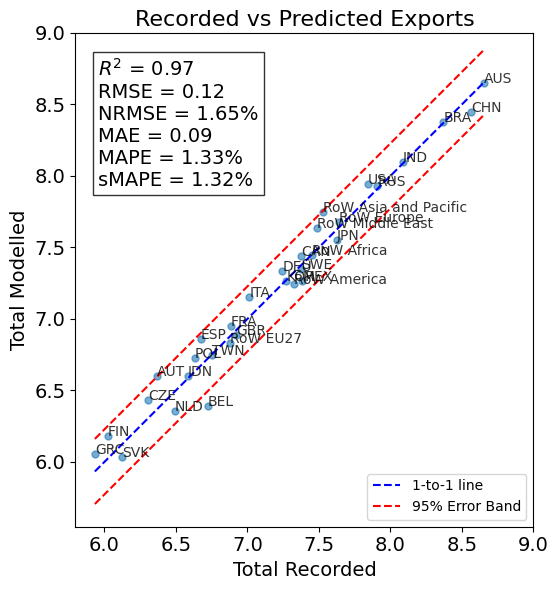

In [63]:
df_exports = exports_raw.merge(exports_pred, on=["exp_ISO3", "year"])
df_exports = df_exports.rename(columns={"exp_ISO3":"ISO3"})
_limplot(df=df_exports, x_col="raw_tonnes", 
         y_col="pred_tonnes", x_log=True, 
         y_log=True,
         title="Recorded vs Predicted Exports",
         x_label="Total Recorded",
         y_label="Total Modelled",
         fontsize=14, xmax=9, ymax=9)

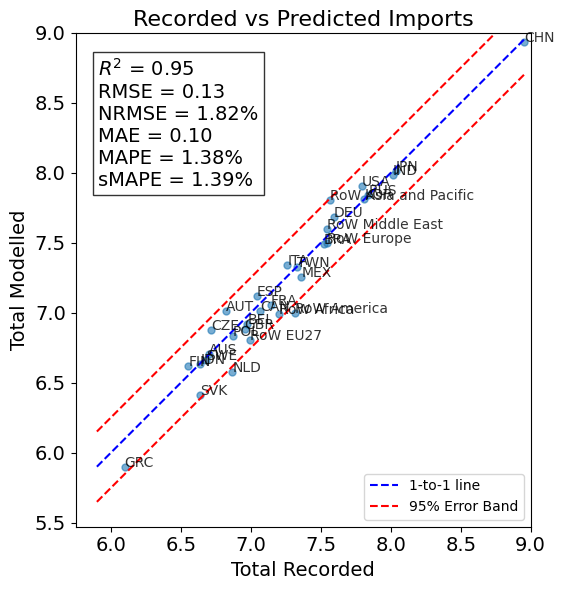

In [48]:
df_imports = imports_raw.merge(imports_pred, on=["imp_ISO3", "year"])
df_imports = df_imports.rename(columns={"imp_ISO3":"ISO3"})
_limplot(df=df_imports, x_col="raw_tonnes", 
         y_col="pred_tonnes", x_log=True, y_log=True,
         title="Recorded vs Predicted Imports",
         x_label="Total Recorded",
         y_label="Total Modelled",
         fontsize=14, xmax=9, ymax=9)

In [260]:
import xarray as xr
import numpy as np
def gridded_inflow_outflow(ds_flow):
    # Extract 1D coordinate arrays and flow variables
    origin_lat = ds_flow['origin_lat'].values
    origin_lon = ds_flow['origin_lon'].values
    destination_lat = ds_flow['destination_lat'].values
    destination_lon = ds_flow['destination_lon'].values

    outflow = ds_flow['outflow'].values
    inflow = ds_flow['inflow'].values

    # Round lat/lon to 1-degree grid centers
    origin_lat_rounded = np.round(origin_lat, 1)
    origin_lon_rounded = np.round(origin_lon, 1)
    destination_lat_rounded = np.round(destination_lat, 1)
    destination_lon_rounded = np.round(destination_lon, 1)

    # Create grid for lat/lon
    lat_vals = np.arange(-89.5, 89.5, 1)
    lon_vals = np.arange(-179.5, 179.5, 1)

    # Initialize empty 2D arrays
    outflow_grid = np.full((len(lat_vals), len(lon_vals)), np.nan)
    inflow_grid = np.full((len(lat_vals), len(lon_vals)), np.nan)

    # Map outflow to grid
    for lat, lon, val in zip(origin_lat_rounded, origin_lon_rounded, outflow):
        lat_idx = np.where(lat_vals == lat)[0]
        lon_idx = np.where(lon_vals == lon)[0]
        if lat_idx.size > 0 and lon_idx.size > 0:
            outflow_grid[lat_idx[0], lon_idx[0]] = val

    # Map inflow to grid
    for lat, lon, val in zip(destination_lat_rounded, destination_lon_rounded, inflow):
        lat_idx = np.where(lat_vals == lat)[0]
        lon_idx = np.where(lon_vals == lon)[0]
        if lat_idx.size > 0 and lon_idx.size > 0:
            inflow_grid[lat_idx[0], lon_idx[0]] = val

    # Create xarray Dataset
    ds_grid = xr.Dataset(
        {
            "outflow": (["lat", "lon"], outflow_grid),
            "inflow": (["lat", "lon"], inflow_grid),
        },
        coords={
            "lat": lat_vals,
            "lon": lon_vals,
        },
        attrs={
            "description": "Gridded 1° inflow and outflow dataset",
            "units": ds_flow.flow_units if "flow_units" in ds_flow.attrs else "tonnes per grid",
        }
    )

    return ds_grid

In [78]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.cm as cm
import cartopy.crs as ccrs
import sesame as ssm

def plot_flow_network(
    flow, origin_coords, destination_coords,
    ds_bg,
    num_edges=1000,
    vmin=None, vmax=None,
    extend_max=False, extend_min=False,
    title="Flow Network",
    label=None,
    color='coolwarm',
    levels=10,
    edge_thickness=1.5,
    edge_alpha=0.5,
    edge_cmap="plasma"
):
    # Clean flow
    flow_clean = np.where(np.isfinite(flow), flow, 0)

    # Plot SESAME background (e.g., netflow)
    ax = ssm.plot_map(
        variable="netflow",
        dataset=ds_bg,
        vmin=vmin, vmax=vmax,
        extend_max=extend_max, extend_min=extend_min,
        color=color,
        levels=levels,
        title=title,
        label=label,
        show=False,
        out_bound=False,
        remove_ata=True
    )

    # Compute top N edge indices
    flat_indices = np.argpartition(flow_clean.ravel(), -num_edges)[-num_edges:]
    top_indices = flat_indices[np.argsort(flow_clean.ravel()[flat_indices])][::-1]
    out_idxs, in_idxs = np.unravel_index(top_indices, flow.shape)

    # Extract flow values and normalize for edge styling
    flow_vals = flow_clean[out_idxs, in_idxs]
    norm = mcolors.Normalize(vmin=flow_vals.min(), vmax=flow_vals.max())
    cmap = plt.get_cmap(edge_cmap)

    min_width, max_width = 0.1, 5

    for out_i, in_j, val in zip(out_idxs, in_idxs, flow_vals):
        if val > 0:
            lat1, lon1 = origin_coords[out_i]
            lat2, lon2 = destination_coords[in_j]
            color = cmap(norm(val))
            width = min_width + (max_width - min_width) * norm(val)
            ax.plot(
                [lon1, lon2], [lat1, lat2],
                color=color,
                linewidth=width,
                alpha=edge_alpha,
                # transform=ccrs.Geodetic()
                transform=ccrs.PlateCarree()
            )

    # Colorbar for edges
    sm = cm.ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])
    fig = plt.gcf()
    cbar = fig.colorbar(sm, ax=ax, orientation='vertical', shrink=0.6, pad=0.01, aspect=30)
    cbar.set_label("Flow Magnitude log10(tonnes Fe)", fontsize=9)
    cbar.ax.tick_params(labelsize=8)

    # Calculate share of flow visualized (using absolute values)
    flat_flow = np.abs(flow.ravel())
    sorted_flow = np.sort(flat_flow)[::-1]  # Descending
    top_1200_sum = sorted_flow[:1200].sum()
    total_sum = sorted_flow.sum()
    percent = (top_1200_sum / total_sum) * 100

    print(f"Top 1200 edges represent: {percent:.2f}% of total flow magnitude")


    plt.show()


In [3]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.cm as cm
import cartopy.crs as ccrs
import numpy as np
import xarray as xr

def plot_flow_network_gradient(
    flow, origin_coords, destination_coords,
    num_edges=1000,
    edge_thickness=1.5,
    edge_alpha=0.6,
    edge_cmap="coolwarm",
    steps=20,
    title="Gradient Flow Map"
):
    # Clean flow
    flow_clean = np.where(np.isfinite(flow), flow, 0)

    # Set up Robinson projection map
    fig, ax = plt.subplots(figsize=(12, 6), subplot_kw={'projection': ccrs.Robinson()})
    ax.set_global()
    ax.coastlines(linewidth=0.3, alpha=0.5)

    # Top N flows
    flat_indices = np.argpartition(flow_clean.ravel(), -num_edges)[-num_edges:]
    top_indices = flat_indices[np.argsort(flow_clean.ravel()[flat_indices])][::-1]
    out_idxs, in_idxs = np.unravel_index(top_indices, flow.shape)

    flow_vals = flow_clean[out_idxs, in_idxs]
    norm = mcolors.Normalize(vmin=flow_vals.min(), vmax=flow_vals.max())
    cmap = plt.get_cmap(edge_cmap)

    min_width, max_width = 0.2, 3

    for out_i, in_j, val in zip(out_idxs, in_idxs, flow_vals):
        if val <= 0:
            continue
        lat1, lon1 = origin_coords[out_i]
        lat2, lon2 = destination_coords[in_j]
        width = min_width + (max_width - min_width) * norm(val)

        # Interpolate intermediate points for gradient curve
        lats = np.linspace(lat1, lat2, steps)
        lons = np.linspace(lon1, lon2, steps)

        for i in range(steps - 1):
            color = cmap(i / (steps - 1))
            ax.plot(
                [lons[i], lons[i+1]], [lats[i], lats[i+1]],
                color=color,
                linewidth=width,
                alpha=edge_alpha,
                transform=ccrs.Geodetic()
            )

    ax.set_title(title, fontsize=13, weight="bold")
    plt.tight_layout()
    plt.show()


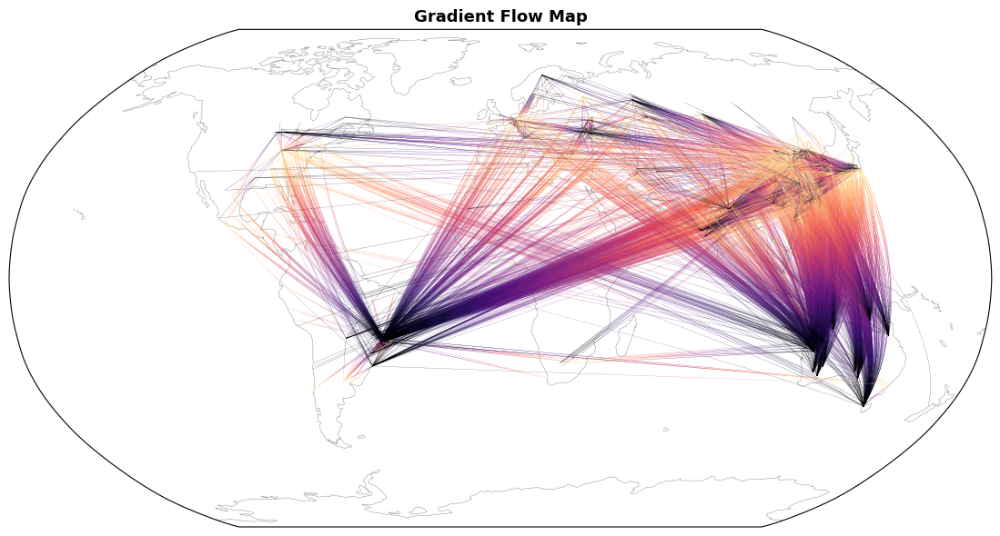

In [6]:
# Load flow matrix dataset
ds_flow = xr.open_dataset("gravity_model_output_s1.nc")
# ds_flow = xr.load_dataset("gravity_model_output_s1.5deg.nc")
# flow = np.log10(ds_flow["flow"].values)
flow = ds_flow["flow"].values
origin_coords = list(zip(ds_flow["origin_lat"].values, ds_flow["origin_lon"].values))
destination_coords = list(zip(ds_flow["destination_lat"].values, ds_flow["destination_lon"].values))

plot_flow_network_gradient(
    flow, origin_coords, destination_coords,
    num_edges=1000,
    edge_thickness=1.5,
    edge_alpha=0.6,
    edge_cmap="magma",
    steps=20,
    title="Gradient Flow Map"
)

In [104]:
import numpy as np
import xarray as xr
from haversine import haversine

# Load your flow dataset
ds_flow = xr.open_dataset("gravity_model_output_s1.nc")
flow = ds_flow["flow"].values
origin_lat = ds_flow["origin_lat"].values
origin_lon = ds_flow["origin_lon"].values
destination_lat = ds_flow["destination_lat"].values
destination_lon = ds_flow["destination_lon"].values

# Create 1D sorted unique lat/lon values assuming 1-degree regular grid
lats = np.arange(-89.5, 90, 1)   # 180 rows
lons = np.arange(-179.5, 180, 1) # 360 columns

# Build lat-lon to index mapping
lat_to_idx = {lat: i for i, lat in enumerate(lats)}
lon_to_idx = {lon: i for i, lon in enumerate(lons)}

# Initialize output array (lat x lon)
mass_disp_grid = np.full((len(lats), len(lons)), np.nan)

# Precompute distance matrix
n_origin = len(origin_lat)
n_dest = len(destination_lat)

distance_matrix = np.zeros((n_origin, n_dest))
for i in range(n_origin):
    coord_i = (origin_lat[i], origin_lon[i])
    for j in range(n_dest):
        coord_j = (destination_lat[j], destination_lon[j])
        distance_matrix[i, j] = haversine(coord_i, coord_j)  # in km

# Calculate mass displacement for each origin cell
mass_displacement = np.nansum(flow * distance_matrix, axis=1)

# Fill the 2D grid
for i in range(n_origin):
    lat = origin_lat[i]
    lon = origin_lon[i]
    row = lat_to_idx.get(lat)
    col = lon_to_idx.get(lon)
    if row is not None and col is not None:
        mass_disp_grid[row, col] = mass_displacement[i]

# Create xarray.Dataset with 2D lat-lon coordinates
ds_mass_disp = xr.Dataset(
    {
        "mass_displacement": (("lat", "lon"), mass_disp_grid)
    },
    coords={
        "lat": lats,
        "lon": lons
    },
    attrs={
        "units": "tonne-km",
        "description": "Mass displacement = sum(flow × distance) from each origin cell"
    }
)

ds_mass_disp_s1 = ds_mass_disp.copy()
ds_mass_disp_s1


<xarray.Dataset> Size: 523kB
Dimensions:            (lat: 180, lon: 360)
Coordinates:
  * lat                (lat) float64 1kB -89.5 -88.5 -87.5 ... 87.5 88.5 89.5
  * lon                (lon) float64 3kB -179.5 -178.5 -177.5 ... 178.5 179.5
Data variables:
    mass_displacement  (lat, lon) float64 518kB nan nan nan nan ... nan nan nan
Attributes:
    units:        tonne-km
    description:  Mass displacement = sum(flow × distance) from each origin cell

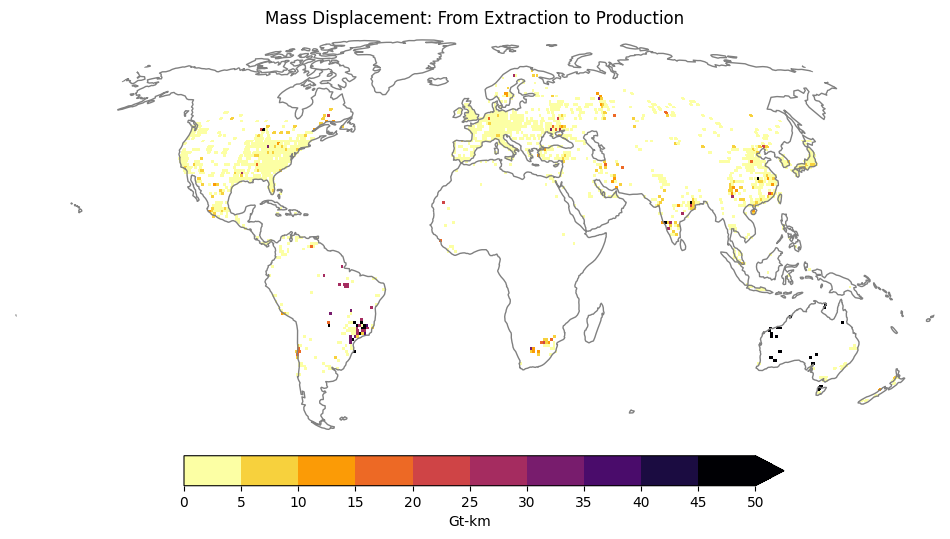

<GeoAxes: title={'center': 'Mass Displacement: From Extraction to Production'}>

In [105]:
import sesame as ssm

dd = ds_mass_disp_s1.copy() * 1e-9
dd["mass_displacement"] = xr.where(dd["mass_displacement"] < 0.2, np.nan, dd["mass_displacement"])
ssm.plot_map(dd, "mass_displacement", label="Gt-km", title="Mass Displacement: From Extraction to Production",
             color="inferno_r", vmax=50, extend_max=True, out_bound=False, remove_ata=True)

In [147]:
def mass_displacement_plot(ds, title="Mass Displacement", radius=3, color="red"):
    import matplotlib.pyplot as plt
    import cartopy.crs as ccrs
    import cartopy.feature as cfeature
    import numpy as np

    # Flatten values
    lat_flat = ds['lat'].values.repeat(len(ds['lon']))
    lon_flat = np.tile(ds['lon'].values, len(ds['lat']))
    mass_flat = ds['mass_displacement'].values.flatten() * 1e-9  # Gt-km

    # Filter valid values
    mask = np.isfinite(mass_flat)
    lat_flat = lat_flat[mask]
    lon_flat = lon_flat[mask]
    mass_flat = mass_flat[mask]

    # Define bins
    bins = [0.1, 15, 30, 60, 100, np.inf]
    labels = ['0–15', '15–30', '30–60', '60–100', '>100']

    # Hollow circle radii (exponential growth)
    base_radius = radius
    sizes = [base_radius**(2*i) for i in range(len(labels))]  # area (s), not radius
    colors = [color] * len(labels)  # same border color

    # Assign class index
    class_indices = np.digitize(mass_flat, bins) - 1

    # Plot
    fig = plt.figure(figsize=(12, 8))
    ax = plt.axes(projection=ccrs.Robinson())
    ax.set_global()
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
    # ax.add_feature(cfeature.BORDERS, linewidth=0.5)
    ax.spines['geo'].set_visible(False)
    # ax.stock_img()

    # Plot each class
    for i in range(len(labels)):
        idx = class_indices == i
        if np.any(idx):
            ax.scatter(
                lon_flat[idx], lat_flat[idx],
                s=sizes[i],  # area
                facecolors='none',
                edgecolors=colors[i],
                label=labels[i],
                alpha=0.2 if i == 0 else 1,
                transform=ccrs.PlateCarree()
            )

    # Legend and title
    plt.legend(title="Mass Displacement (Gt-km)", loc='center left', frameon=False, fontsize=14)
    plt.title(title, fontsize=14)
    plt.tight_layout()
    plt.show()
    

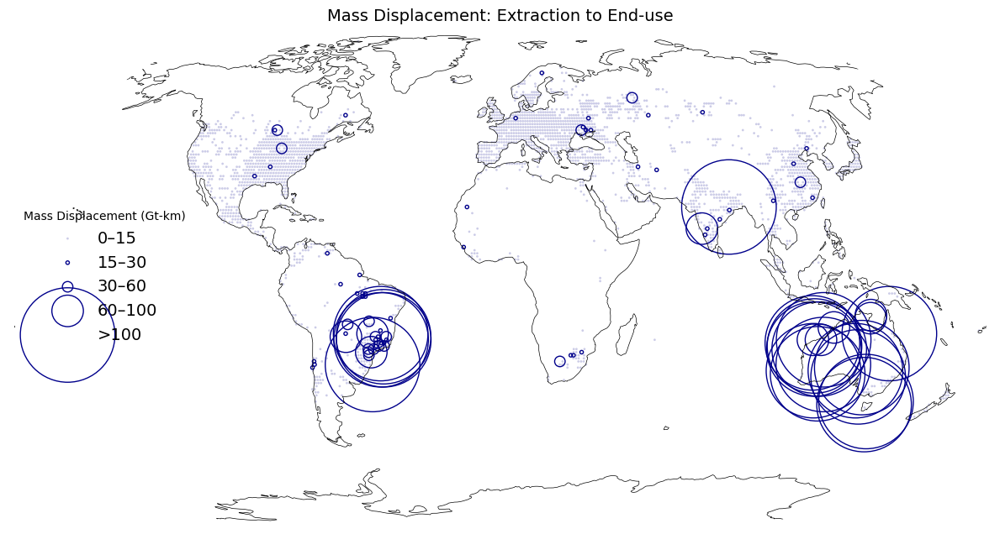

In [124]:
mass_displacement_plot(ds=ds_mass_disp_s1, title="Mass Displacement: Extraction to End-use", radius=3, color="darkblue")

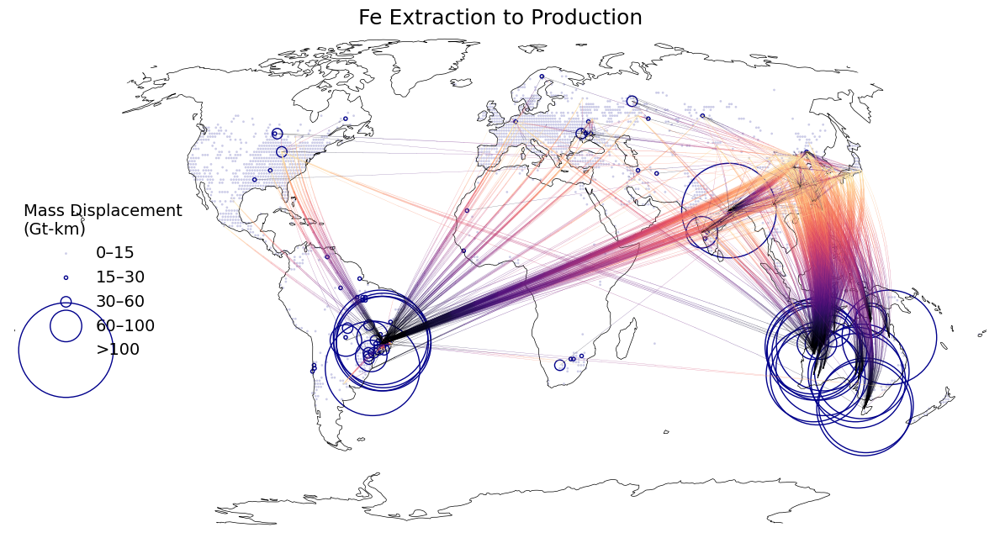

In [156]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from haversine import haversine

# --- 1. Mass Displacement Plot Function ---

def mass_displacement_plot(ds, title, radius=3, color="darkblue"):
    # Prepare data
    lat_vals = ds['lat'].values
    lon_vals = ds['lon'].values
    mass_vals = ds['mass_displacement'].values * 1e-9  # convert to Gt-km

    lat_flat = lat_vals.repeat(len(lon_vals))
    lon_flat = np.tile(lon_vals, len(lat_vals))
    mass_flat = mass_vals.flatten()

    mask = np.isfinite(mass_flat)
    lat_flat = lat_flat[mask]
    lon_flat = lon_flat[mask]
    mass_flat = mass_flat[mask]

    # Define bins and styles
    bins = [0.1, 15, 30, 60, 100, np.inf]
    labels = ['0–15', '15–30', '30–60', '60–100', '>100']
    sizes = [radius**(2*i) for i in range(len(labels))]
    colors = [color] * len(labels)  # same border color

    # Assign classes
    class_indices = np.digitize(mass_flat, bins) - 1

    # # Plot
    # fig = plt.figure(figsize=(12, 6))
    # ax = plt.axes(projection=ccrs.Robinson())
    # ax.set_global()
    # ax.coastlines(linewidth=0.5)
    # # ax.outline_patch.set_visible(False)
    # Plot
    fig = plt.figure(figsize=(12, 8))
    ax = plt.axes(projection=ccrs.Robinson())
    ax.set_global()
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
    # ax.add_feature(cfeature.BORDERS, linewidth=0.5)
    ax.spines['geo'].set_visible(False)

    # Plot each class
    for i in range(len(labels)):
        idx = class_indices == i
        if np.any(idx):
            ax.scatter(
                lon_flat[idx], lat_flat[idx],
                s=sizes[i],  # area
                facecolors='none',
                edgecolors=colors[i],
                label=labels[i],
                alpha=0.2 if i == 0 else 1,
                transform=ccrs.PlateCarree()
            )

    # Legend and title
    plt.legend(title="Mass Displacement\n(Gt-km)", title_fontsize=14, loc='center left', frameon=False, fontsize=14)
    plt.title(title, fontsize=18)
    
    return fig, ax


# --- 2. Flow Overlay Function ---

def plot_flow_network_gradient(
    flow, origin_coords, destination_coords,
    ax,
    num_edges=1000,
    edge_thickness=1.5,
    edge_alpha=0.6,
    edge_cmap="magma",
    steps=20
):
    flow_clean = np.where(np.isfinite(flow), flow, 0)

    flat_indices = np.argpartition(flow_clean.ravel(), -num_edges)[-num_edges:]
    top_indices = flat_indices[np.argsort(flow_clean.ravel()[flat_indices])][::-1]
    out_idxs, in_idxs = np.unravel_index(top_indices, flow.shape)

    flow_vals = flow_clean[out_idxs, in_idxs]
    norm = mcolors.Normalize(vmin=flow_vals.min(), vmax=flow_vals.max())
    cmap = plt.get_cmap(edge_cmap)

    min_width, max_width = 0.2, 3

    for out_i, in_j, val in zip(out_idxs, in_idxs, flow_vals):
        if val <= 0:
            continue
        lat1, lon1 = origin_coords[out_i]
        lat2, lon2 = destination_coords[in_j]
        width = min_width + (max_width - min_width) * norm(val)

        lats = np.linspace(lat1, lat2, steps)
        lons = np.linspace(lon1, lon2, steps)

        for i in range(steps - 1):
            color = cmap(i / (steps - 1))
            ax.plot(
                [lons[i], lons[i+1]], [lats[i], lats[i+1]],
                color=color,
                linewidth=width,
                alpha=edge_alpha,
                transform=ccrs.Geodetic()
            )

# --- 3. Load Data and Call Both ---

# Load flow dataset
ds_flow = xr.open_dataset("gravity_model_output_s1.nc")
flow = ds_flow["flow"].values
origin_coords = list(zip(ds_flow["origin_lat"].values, ds_flow["origin_lon"].values))
destination_coords = list(zip(ds_flow["destination_lat"].values, ds_flow["destination_lon"].values))

# Plot both on same figure
fig, ax = mass_displacement_plot(
    ds=ds_mass_disp_s1,
    title="Fe Extraction to Production",
    radius=3,
    color="darkblue"
)

plot_flow_network_gradient(
    flow=flow,
    origin_coords=origin_coords,
    destination_coords=destination_coords,
    ax=ax,
    num_edges=1500,
    edge_alpha=0.6,
    edge_cmap="magma",
    steps=20
)

# Save or show
plt.tight_layout()
plt.savefig("mass_disp_with_flows_combined_s1.png", dpi=600)
plt.show()

In [158]:
import numpy as np
import xarray as xr
from haversine import haversine

# Load your flow dataset
ds_flow = xr.open_dataset("gravity_model_output_s2.nc")
flow = ds_flow["flow"].values
origin_lat = ds_flow["origin_lat"].values
origin_lon = ds_flow["origin_lon"].values
destination_lat = ds_flow["destination_lat"].values
destination_lon = ds_flow["destination_lon"].values

# Create 1D sorted unique lat/lon values assuming 1-degree regular grid
lats = np.arange(-89.5, 90, 1)   # 180 rows
lons = np.arange(-179.5, 180, 1) # 360 columns

# Build lat-lon to index mapping
lat_to_idx = {lat: i for i, lat in enumerate(lats)}
lon_to_idx = {lon: i for i, lon in enumerate(lons)}

# Initialize output array (lat x lon)
mass_disp_grid = np.full((len(lats), len(lons)), np.nan)

# Precompute distance matrix
n_origin = len(origin_lat)
n_dest = len(destination_lat)

distance_matrix = np.zeros((n_origin, n_dest))
for i in range(n_origin):
    coord_i = (origin_lat[i], origin_lon[i])
    for j in range(n_dest):
        coord_j = (destination_lat[j], destination_lon[j])
        distance_matrix[i, j] = haversine(coord_i, coord_j)  # in km

# Calculate mass displacement for each origin cell
mass_displacement = np.nansum(flow * distance_matrix, axis=1)

# Fill the 2D grid
for i in range(n_origin):
    lat = origin_lat[i]
    lon = origin_lon[i]
    row = lat_to_idx.get(lat)
    col = lon_to_idx.get(lon)
    if row is not None and col is not None:
        mass_disp_grid[row, col] = mass_displacement[i]

# Create xarray.Dataset with 2D lat-lon coordinates
ds_mass_disp = xr.Dataset(
    {
        "mass_displacement": (("lat", "lon"), mass_disp_grid)
    },
    coords={
        "lat": lats,
        "lon": lons
    },
    attrs={
        "units": "tonne-km",
        "description": "Mass displacement = sum(flow × distance) from each origin cell"
    }
)

ds_mass_disp_s2 = ds_mass_disp.copy()
ds_mass_disp_s2


<xarray.Dataset> Size: 523kB
Dimensions:            (lat: 180, lon: 360)
Coordinates:
  * lat                (lat) float64 1kB -89.5 -88.5 -87.5 ... 87.5 88.5 89.5
  * lon                (lon) float64 3kB -179.5 -178.5 -177.5 ... 178.5 179.5
Data variables:
    mass_displacement  (lat, lon) float64 518kB nan nan nan nan ... nan nan nan
Attributes:
    units:        tonne-km
    description:  Mass displacement = sum(flow × distance) from each origin cell

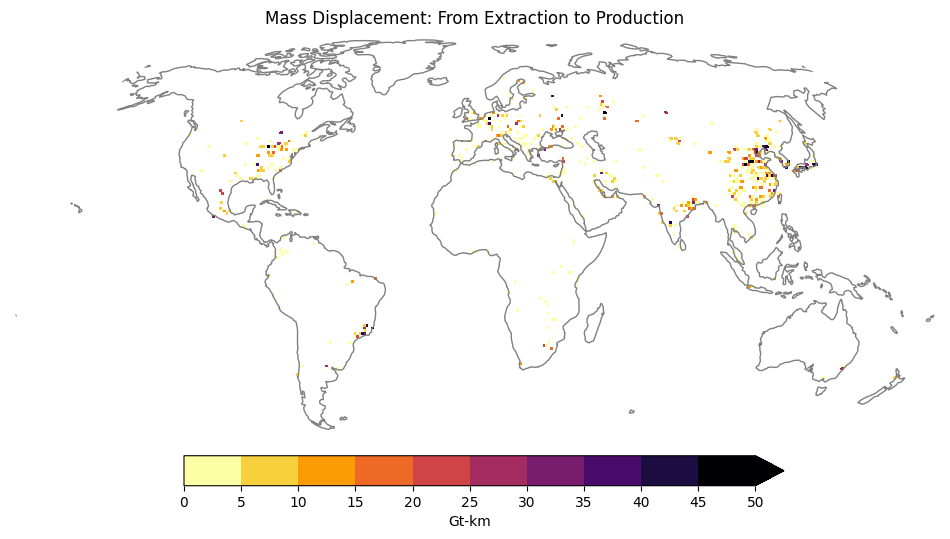

<GeoAxes: title={'center': 'Mass Displacement: From Extraction to Production'}>

In [101]:
import sesame as ssm

dd = ds_mass_disp_s2.copy() * 1e-9
dd["mass_displacement"] = xr.where(dd["mass_displacement"] < 0, np.nan, dd["mass_displacement"])
ssm.plot_map(dd, "mass_displacement", label="Gt-km", title="Mass Displacement: From Extraction to Production",
             color="inferno_r", vmax=50, extend_max=True, out_bound=False, remove_ata=True)

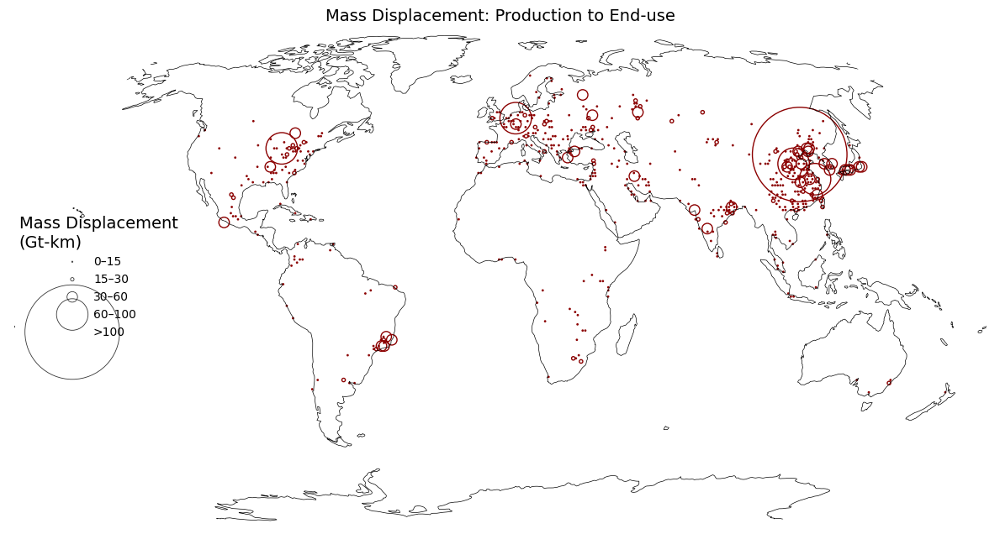

In [95]:
mass_displacement_plot(ds=ds_mass_disp, title="Mass Displacement: Production to End-use", radius=3, color="darkred")

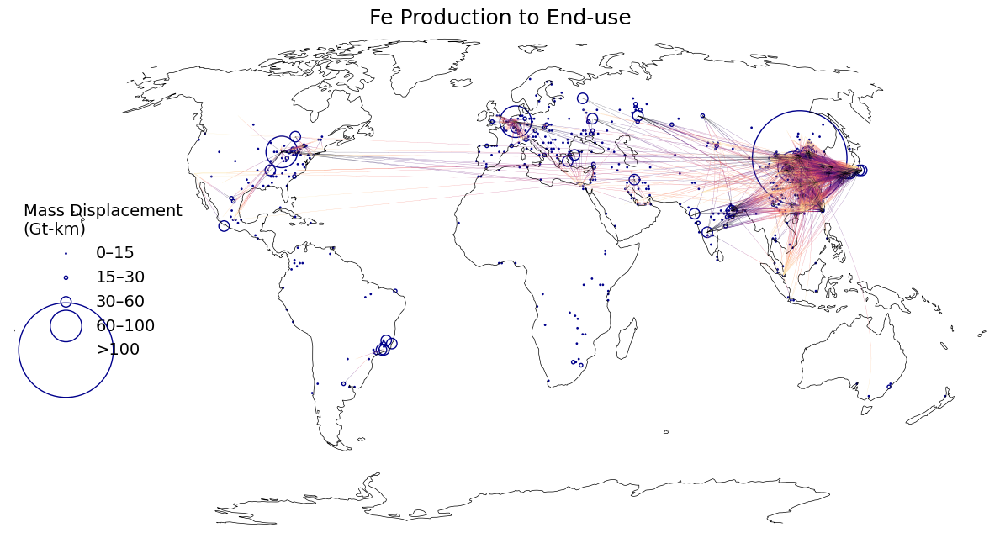

In [162]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from haversine import haversine

# --- 1. Mass Displacement Plot Function ---

def mass_displacement_plot(ds, title, radius=3, color="darkred"):
    # Prepare data
    lat_vals = ds['lat'].values
    lon_vals = ds['lon'].values
    mass_vals = ds['mass_displacement'].values * 1e-9  # convert to Gt-km

    lat_flat = lat_vals.repeat(len(lon_vals))
    lon_flat = np.tile(lon_vals, len(lat_vals))
    mass_flat = mass_vals.flatten()

    mask = np.isfinite(mass_flat)
    lat_flat = lat_flat[mask]
    lon_flat = lon_flat[mask]
    mass_flat = mass_flat[mask]

    # Define bins and styles
    bins = [0, 15, 30, 60, 100, np.inf]
    labels = ['0–15', '15–30', '30–60', '60–100', '>100']
    sizes = [radius**(2*i) for i in range(len(labels))]
    colors = [color] * len(labels)  # same border color

    # Assign classes
    class_indices = np.digitize(mass_flat, bins) - 1

    # Plot
    fig = plt.figure(figsize=(12, 8))
    ax = plt.axes(projection=ccrs.Robinson())
    ax.set_global()
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
    # ax.add_feature(cfeature.BORDERS, linewidth=0.5)
    ax.spines['geo'].set_visible(False)

    # Plot each class
    for i in range(len(labels)):
        idx = class_indices == i
        if np.any(idx):
            ax.scatter(
                lon_flat[idx], lat_flat[idx],
                s=sizes[i],  # area
                facecolors='none',
                edgecolors=colors[i],
                label=labels[i],
                alpha=1,
                transform=ccrs.PlateCarree()
            )

    # Legend and title
    plt.legend(title="Mass Displacement\n(Gt-km)", title_fontsize=14, loc='center left', frameon=False, fontsize=14)
    plt.title(title, fontsize=18)
    
    return fig, ax


# --- 2. Flow Overlay Function ---

def plot_flow_network_gradient(
    flow, origin_coords, destination_coords,
    ax,
    num_edges=1000,
    edge_thickness=1.5,
    edge_alpha=0.6,
    edge_cmap="magma",
    steps=20
):
    flow_clean = np.where(np.isfinite(flow), flow, 0)

    flat_indices = np.argpartition(flow_clean.ravel(), -num_edges)[-num_edges:]
    top_indices = flat_indices[np.argsort(flow_clean.ravel()[flat_indices])][::-1]
    out_idxs, in_idxs = np.unravel_index(top_indices, flow.shape)

    flow_vals = flow_clean[out_idxs, in_idxs]
    norm = mcolors.Normalize(vmin=flow_vals.min(), vmax=flow_vals.max())
    cmap = plt.get_cmap(edge_cmap)

    min_width, max_width = 0.2, 3

    for out_i, in_j, val in zip(out_idxs, in_idxs, flow_vals):
        if val <= 0:
            continue
        lat1, lon1 = origin_coords[out_i]
        lat2, lon2 = destination_coords[in_j]
        width = min_width + (max_width - min_width) * norm(val)

        lats = np.linspace(lat1, lat2, steps)
        lons = np.linspace(lon1, lon2, steps)

        for i in range(steps - 1):
            color = cmap(i / (steps - 1))
            ax.plot(
                [lons[i], lons[i+1]], [lats[i], lats[i+1]],
                color=color,
                linewidth=width,
                alpha=edge_alpha,
                transform=ccrs.Geodetic()
            )

# --- 3. Load Data and Call Both ---

# Load flow dataset
ds_flow = xr.open_dataset("gravity_model_output_s2.nc")
flow = ds_flow["flow"].values
origin_coords = list(zip(ds_flow["origin_lat"].values, ds_flow["origin_lon"].values))
destination_coords = list(zip(ds_flow["destination_lat"].values, ds_flow["destination_lon"].values))

# Plot both on same figure
fig, ax = mass_displacement_plot(
    ds=ds_mass_disp_s2,
    title="Fe Production to End-use",
    radius=3,
    color="darkblue"
)

plot_flow_network_gradient(
    flow=flow,
    origin_coords=origin_coords,
    destination_coords=destination_coords,
    ax=ax,
    num_edges=3000,
    edge_alpha=0.6,
    edge_cmap="magma",
    steps=20
)

# Save or show
plt.tight_layout()
plt.savefig("mass_disp_with_flows_combined_s2.png", dpi=600)
plt.show()

In [76]:
# Load flow matrix dataset
ds_flow = xr.load_dataset("gravity_model_output_s1.nc")
flow = np.log10(ds_flow["flow"].values)
origin_coords = list(zip(ds_flow["origin_lat"].values, ds_flow["origin_lon"].values))
destination_coords = list(zip(ds_flow["destination_lat"].values, ds_flow["destination_lon"].values))

# Load background dataset with outflow/inflow data
ds_grid = gridded_inflow_outflow(ds_flow)
ds_grid["netflow"] = ds_grid["outflow"] - ds_grid["inflow"]
grid_ds = xr.open_dataset("/Users/faisal/Documents/GitHub/SESAME/src/sesame/data/G.land_sea_mask.1deg.nc")
ds_grid["netflow"] = (ds_grid["netflow"] * 1e6) / grid_ds["grid_area"]

Top 1200 edges represent: nan% of total flow magnitude


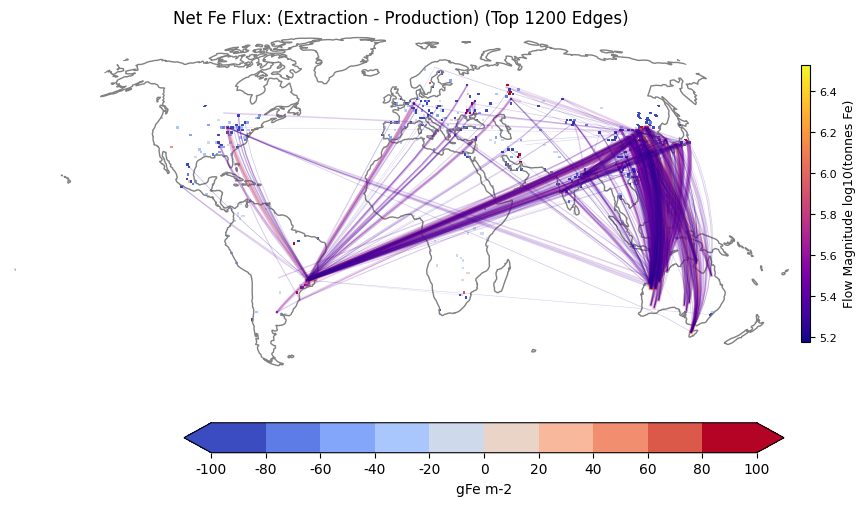

In [79]:
plot_flow_network(
    ds_bg=ds_grid,
    flow=flow,
    origin_coords=origin_coords,
    destination_coords=destination_coords,
    num_edges=1200,
    vmin=-100, vmax=100,
    title="Net Fe Flux: (Extraction - Production) (Top 1200 Edges)",
    label="gFe m-2",
    extend_min=True,
    extend_max=True,
    edge_alpha=0.2, edge_thickness=1
)


In [270]:
import numpy as np
import xarray as xr

def round_to_5deg(x):
    return np.floor(x / 5) * 5 + 2.5

def aggregate_flow_to_5deg(ds_flow):
    # Round coordinates to 5-degree bins
    olat5 = round_to_5deg(ds_flow["origin_lat"].values)
    olon5 = round_to_5deg(ds_flow["origin_lon"].values)
    dlat5 = round_to_5deg(ds_flow["destination_lat"].values)
    dlon5 = round_to_5deg(ds_flow["destination_lon"].values)

    flow = ds_flow["flow"].values

    # Get unique bins
    u_olat, u_olon = np.unique(olat5), np.unique(olon5)
    u_dlat, u_dlon = np.unique(dlat5), np.unique(dlon5)

    # Index dictionaries
    olat_idx = {v: i for i, v in enumerate(u_olat)}
    olon_idx = {v: i for i, v in enumerate(u_olon)}
    dlat_idx = {v: i for i, v in enumerate(u_dlat)}
    dlon_idx = {v: i for i, v in enumerate(u_dlon)}

    # Initialize 4D flow grid
    agg_flow = np.zeros((len(u_olat), len(u_olon), len(u_dlat), len(u_dlon)))

    # Aggregate flow into 5-degree bins
    for o in range(flow.shape[0]):
        for d in range(flow.shape[1]):
            i = olat_idx[olat5[o]]
            j = olon_idx[olon5[o]]
            k = dlat_idx[dlat5[d]]
            l = dlon_idx[dlon5[d]]
            agg_flow[i, j, k, l] += flow[o, d]

    # Create xarray Dataset
    ds_5deg = xr.Dataset(
        {
            "flow": (["olat", "olon", "dlat", "dlon"], agg_flow)
        },
        coords={
            "olat": u_olat,
            "olon": u_olon,
            "dlat": u_dlat,
            "dlon": u_dlon
        },
        attrs={"description": "Aggregated 5-degree flow dataset"}
    )

    return ds_5deg

ds_5deg = aggregate_flow_to_5deg(ds_flow)
ds_5deg

<xarray.Dataset> Size: 17MB
Dimensions:  (olat: 29, olon: 70, dlat: 22, dlon: 48)
Coordinates:
  * olat     (olat) float64 232B -57.5 -52.5 -47.5 -42.5 ... 67.5 72.5 77.5 82.5
  * olon     (olon) float64 560B -177.5 -162.5 -157.5 ... 167.5 172.5 177.5
  * dlat     (dlat) float64 176B -37.5 -32.5 -27.5 -22.5 ... 52.5 57.5 62.5 67.5
  * dlon     (dlon) float64 384B -122.5 -112.5 -102.5 ... 142.5 152.5 172.5
Data variables:
    flow     (olat, olon, dlat, dlon) float64 17MB 0.0 0.0 0.0 ... 0.0 0.0 0.0
Attributes:
    description:  Aggregated 5-degree flow dataset

In [263]:
def round5(x): return np.floor(x / 5.0) * 5 + 2.5  # center of 5° bin

orig_lat5 = round5(ds_flow["origin_lat"].values)
orig_lon5 = round5(ds_flow["origin_lon"].values)
dest_lat5 = round5(ds_flow["destination_lat"].values)
dest_lon5 = round5(ds_flow["destination_lon"].values)

origin_bins = pd.DataFrame({"lat": orig_lat5, "lon": orig_lon5})
origin_bins["grid_id"] = pd.factorize(list(zip(orig_lat5, orig_lon5)))[0]

dest_bins = pd.DataFrame({"lat": dest_lat5, "lon": dest_lon5})
dest_bins["grid_id"] = pd.factorize(list(zip(dest_lat5, dest_lon5)))[0]

O, D = ds_flow["flow"].shape
flow_flat = ds_flow["flow"].values.flatten()

df_flow = pd.DataFrame({
    "flow": flow_flat,
    "origin_id": np.repeat(origin_bins["grid_id"].values, D),
    "dest_id": np.tile(dest_bins["grid_id"].values, O),
})

# Merge with lat/lon of 5° bins
df_flow = df_flow.merge(
    origin_bins.drop_duplicates("grid_id").rename(columns={"lat": "olat", "lon": "olon"}),
    left_on="origin_id", right_on="grid_id"
).merge(
    dest_bins.drop_duplicates("grid_id").rename(columns={"lat": "dlat", "lon": "dlon"}),
    left_on="dest_id", right_on="grid_id",
    suffixes=("_origin", "_dest")
)

df_agg = (
    df_flow.groupby(["origin_id", "dest_id", "olat", "olon", "dlat", "dlon"])["flow"]
           .sum().reset_index()
)

flow_matrix_5deg = df_agg.pivot_table(
    index=["olat", "olon"],
    columns=["dlat", "dlon"],
    values="flow",
    fill_value=0
)

origin_coords_5deg = list(zip(df_agg["olat"], df_agg["olon"]))
destination_coords_5deg = list(zip(df_agg["dlat"], df_agg["dlon"]))


In [271]:
df_agg

,origin_id,dest_id,olat,olon,dlat,dlon,flow
0,0,0,-57.5,-72.5,-37.5,142.5,3.016552e-07
1,0,1,-57.5,-72.5,-37.5,172.5,3.512837e-07
2,0,2,-57.5,-72.5,-37.5,-72.5,2.345910e-07
3,0,3,-57.5,-72.5,-32.5,-57.5,1.082414e-06
4,0,4,-57.5,-72.5,-32.5,152.5,2.920760e-06
...,...,...,...,...,...,...,...
178101,816,213,82.5,92.5,62.5,17.5,1.255320e-15
178102,816,214,82.5,92.5,62.5,27.5,7.825328e-16
178103,816,215,82.5,92.5,62.5,22.5,6.106553e-15
178104,816,216,82.5,92.5,67.5,22.5,7.273710e-15


In [180]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import numpy as np
import xarray as xr

# Load corrected NetCDF file
ds = xr.load_dataset("gravity_model_output_s1.nc")

flow = ds['flow'].values  # shape (origin, destination)
origin_lat = ds['origin_lat'].values
origin_lon = ds['origin_lon'].values
destination_lat = ds['destination_lat'].values
destination_lon = ds['destination_lon'].values

# Get non-zero flows
origin_ids, dest_ids = np.nonzero(flow)
flow_vals = flow[origin_ids, dest_ids]

# Filter by flow threshold
flow_threshold = 100
valid_mask = flow_vals >= flow_threshold
origin_ids = origin_ids[valid_mask]
dest_ids = dest_ids[valid_mask]
flow_vals = flow_vals[valid_mask]

# Get coordinates of valid flows
lat1 = origin_lat[origin_ids]
lon1 = origin_lon[origin_ids]
lat2 = destination_lat[dest_ids]
lon2 = destination_lon[dest_ids]

# Vectorized Haversine
def haversine_vectorized(lat1, lon1, lat2, lon2):
    R = 6371.0
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat / 2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2.0)**2
    a = np.clip(a, 0, 1)
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
    return R * c

# Compute edge-level distances and mass displacement
distances = haversine_vectorized(lat1, lon1, lat2, lon2)
mass_disp = flow_vals * distances

# Aggregate to origin node
flow_df = pd.DataFrame({
    'origin_id': origin_ids,
    'mass_disp': mass_disp
})
node_disp = flow_df.groupby('origin_id')['mass_disp'].sum().reset_index()

# Build GeoDataFrame of origin nodes
geometry = [Point(origin_lon[i], origin_lat[i]) for i in node_disp['origin_id']]
gdf = gpd.GeoDataFrame(node_disp, geometry=geometry, crs="EPSG:4326")

# Select top 20% of nodes by mass displacement
threshold = gdf['mass_disp'].quantile(0.80)
gdf_top20 = gdf[gdf['mass_disp'] >= threshold]
gdf_top20["km_mt"] = gdf_top20["mass_disp"] * 1e-6
gdf_top20["log_km_mt"] = np.log10(gdf_top20["km_mt"])
gdf_top20

/Users/faisal/miniconda3/envs/sesame/lib/python3.13/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/Users/faisal/miniconda3/envs/sesame/lib/python3.13/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,origin_id,mass_disp,geometry,km_mt,log_km_mt
19,175,2.630670e+11,POINT (145.5 -41.5),263066.958712,5.420066
22,179,1.287252e+10,POINT (171.5 -41.5),12872.523191,4.109664
30,199,1.301263e+11,POINT (145.5 -40.5),130126.339523,5.114365
47,256,4.176773e+09,POINT (174.5 -38.5),4176.772796,3.620841
58,283,2.030495e+09,POINT (143.5 -37.5),2030.495045,3.307602
...,...,...,...,...,...
5249,13886,4.147300e+09,POINT (21.5 67.5),4147.299743,3.617765
5250,13895,9.279297e+09,POINT (30.5 67.5),9279.296747,3.967515
5252,13897,9.598602e+09,POINT (32.5 67.5),9598.602261,3.982208
5254,13990,6.220341e+09,POINT (30.5 69.5),6220.341424,3.793814


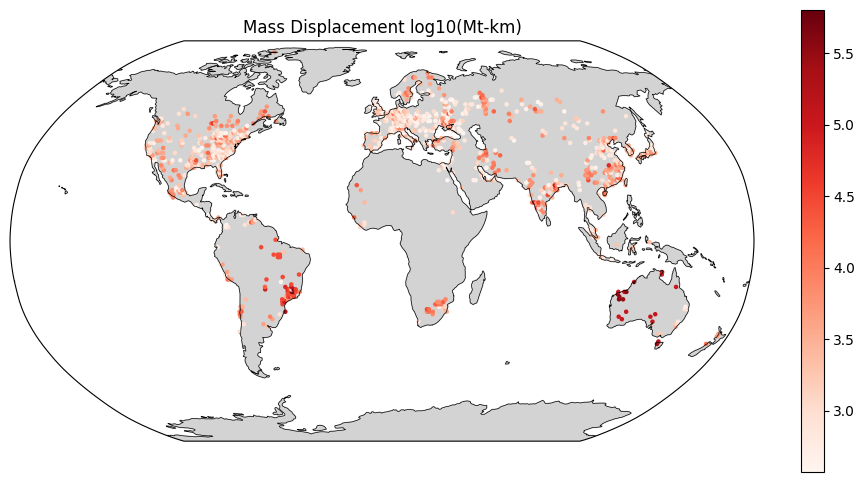

In [182]:
import matplotlib.pyplot as plt

import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Load your shapefile
gdf_top20 = gdf_top20.to_crs(epsg=4326)  # Ensure data is in latitude and longitude

# Define the Robinson projection
projection = ccrs.Robinson()

# Create a subplot with the Robinson projection
fig, ax = plt.subplots(subplot_kw={'projection': projection}, figsize=(12, 6))

# Plotting the points
# Converting GeoDataFrame to use the `.plot` method from matplotlib for GeoDataFrames
gdf_top20.plot(column="log_km_mt", cmap="Reds", legend=True, markersize=5, ax=ax, transform=ccrs.Geodetic())

# Adding geographical features
ax.coastlines(resolution='110m', color='black', linewidth=0.5)
ax.add_feature(cfeature.LAND, color='lightgray',linewidth=1)
ax.set_global()  # Optionally set a global extent

# Set the title
ax.set_title('Mass Displacement log10(Mt-km)')

# Display the plot
plt.show()


In [183]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import numpy as np
import xarray as xr

# Load the flow dataset
ds = xr.load_dataset("gravity_model_output_s1.nc")
flow = ds['flow'].values  # shape (origin, destination)

origin_lat = ds['origin_lat'].values
origin_lon = ds['origin_lon'].values
destination_lat = ds['destination_lat'].values
destination_lon = ds['destination_lon'].values

# Get all non-zero flows
origin_ids, dest_ids = np.nonzero(flow)
flow_vals = flow[origin_ids, dest_ids]

# Get coordinates of all valid flows
lat1 = origin_lat[origin_ids]
lon1 = origin_lon[origin_ids]
lat2 = destination_lat[dest_ids]
lon2 = destination_lon[dest_ids]

# Haversine distance function
def haversine_vectorized(lat1, lon1, lat2, lon2):
    R = 6371.0  # km
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat / 2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2.0)**2
    a = np.clip(a, 0, 1)
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
    return R * c

# Compute distances and mass displacement
distances = haversine_vectorized(lat1, lon1, lat2, lon2)
mass_displacement = flow_vals * distances

# Build flow-level DataFrame
flow_df = pd.DataFrame({
    "dest_id": dest_ids,
    "flow_mass": flow_vals,
    "distance_km": distances,
    "mass_displacement": mass_displacement
})

# Aggregate per destination node
agg_dest = (
    flow_df
    .groupby("dest_id")
    .agg(
        mass=("flow_mass", "sum"),
        mass_displacement=("mass_displacement", "sum")
    )
    .reset_index()
)

# Compute mean distance
agg_dest["mean_distance_km"] = agg_dest["mass_displacement"] / agg_dest["mass"]

# Build GeoDataFrame
geometry_dest = [Point(destination_lon[i], destination_lat[i]) for i in agg_dest["dest_id"]]
gdf_dest = gpd.GeoDataFrame(agg_dest, geometry=geometry_dest, crs="EPSG:4326")

# Optional: add log-scale
gdf_dest["km_mt"] = gdf_dest["mass_displacement"] * 1e-6
gdf_dest["log_km_mt"] = np.log10(gdf_dest["km_mt"])

# Final output
gdf_dest


,dest_id,mass,mass_displacement,mean_distance_km,geometry,km_mt,log_km_mt
0,0,3.837325e+05,3.309775e+09,8625.214519,POINT (144.5 -37.5),3309.775234,3.519799
1,1,5.566934e+05,4.412946e+09,7927.067169,POINT (174.5 -37.5),4412.946203,3.644729
2,2,8.790245e+05,5.734020e+09,6523.163686,POINT (-73.5 -36.5),5734.020374,3.758459
3,3,7.647822e+05,2.618003e+09,3423.200440,POINT (-58.5 -34.5),2618.002686,3.417970
4,4,5.427663e+04,1.911062e+08,3520.966484,POINT (-56.5 -34.5),191.106211,2.281275
...,...,...,...,...,...,...,...
563,563,4.073692e+05,2.256851e+09,5540.062940,POINT (28.5 61.5),2256.850786,3.353503
564,564,2.882045e+06,1.612254e+10,5594.130976,POINT (24.5 64.5),16122.535843,4.207433
565,565,2.222704e+06,1.380461e+10,6210.724655,POINT (22.5 65.5),13804.605278,4.140024
566,566,8.495136e+05,4.702653e+09,5535.700197,POINT (24.5 65.5),4702.652567,3.672343


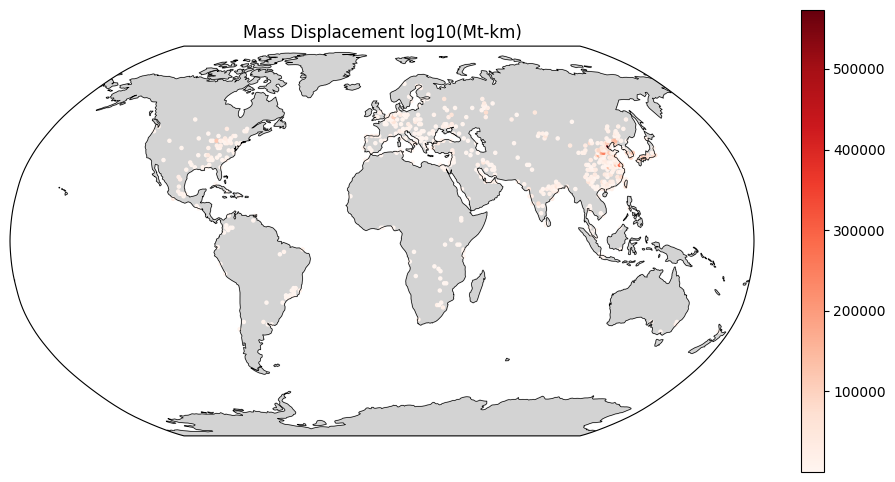

In [184]:
import matplotlib.pyplot as plt

import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Load your shapefile
gdf_dest = gdf_dest.to_crs(epsg=4326)  # Ensure data is in latitude and longitude

# Define the Robinson projection
projection = ccrs.Robinson()

# Create a subplot with the Robinson projection
fig, ax = plt.subplots(subplot_kw={'projection': projection}, figsize=(12, 6))

# Plotting the points
# Converting GeoDataFrame to use the `.plot` method from matplotlib for GeoDataFrames
gdf_dest.plot(column="km_mt", cmap="Reds", legend=True, markersize=5, ax=ax, transform=ccrs.Geodetic())

# Adding geographical features
ax.coastlines(resolution='110m', color='black', linewidth=0.5)
ax.add_feature(cfeature.LAND, color='lightgray',linewidth=1)
ax.set_global()  # Optionally set a global extent

# Set the title
ax.set_title('Mass Displacement log10(Mt-km)')

# Display the plot
plt.show()


In [61]:
country_gdf = gpd.read_file("/Users/faisal/Documents/GitHub/SESAME/src/sesame/data/CShapes_v2_converted_2023.shp")
country_gdf

,cntry_name,area,capname,caplong,caplat,gwcode,gwsdate,gwsyear,gwsmonth,gwsday,...,gwemonth,gweday,Shape_Leng,Shape_Area,ISO_A3,NAME_EN,ISO3,start_d,end_d,geometry
0,Afghanistan,641908.3,Kabul,69.18333,34.51667,700,1919-05-01,1919,5,1,...,12,31,50.7724438402,62.5672779274,nan,nan,AFG,1919-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((72.73387 37.13538, 72.75888 37.18068..."
1,Albania,28656.479,Tirane,19.81889,41.3275,339,1920-02-11,1920,2,11,...,12,31,9.60344542465,3.07370455193,nan,nan,ALB,1920-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((19.75433 42.64111, 19.76479 42.58787..."
2,Algeria,2317487.5,Algiers,3.050556,36.76305,615,1962-07-05,1962,7,5,...,12,31,70.5242220342,213.513311992,nan,nan,DZA,1962-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((8.63222 36.88195, 8.63805 36.83111, ..."
3,American Samoa,0.0,nan,0.0,0.0,0,2019-01-01,1950,1,1,...,1,1,1.07370505154,0.0151014394369,ASM,American Samoa,ASM,1950-01-01 00:00:00,2024-01-01 00:00:00,"MULTIPOLYGON (((-168.16157 -14.53289, -168.173..."
4,Andorra,0.0,nan,0.0,0.0,0,2019-01-01,1950,1,1,...,1,1,1.05795317667,0.0495607344854,AND,Andorra,AND,1950-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((1.47862 42.641, 1.48653 42.65042, 1...."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
241,Western Sahara,269071.7,El Aaiun,-13.200006,27.14998,609,1958-10-10,1958,10,10,...,11,13,28.7360378465,24.0016076004,nan,nan,ESH,1958-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((-17.07028 20.92083, -17.07555 20.899..."
242,Yemen (Arab Republic of Yemen),453630.66,Sana'a,44.18333,15.28333,678,2000-06-12,2000,6,12,...,12,31,34.0166451987,38.2880671975,nan,nan,YEM,2000-01-01 00:00:00,2024-01-01 00:00:00,"MULTIPOLYGON (((52.38853 12.15097, 52.34138 12..."
243,Zambia,751926.8,Lusaka,28.28333,-15.41667,551,1964-01-22,1964,1,22,...,12,31,49.1213092363,62.8145883465,nan,nan,ZMB,1964-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((32.94055 -9.40933, 32.9436 -9.45584,..."
244,Zimbabwe (Rhodesia),389856.06,Harare,31.04472,-17.81778,552,1965-11-11,1965,11,11,...,12,31,26.2389597272,33.4624061942,nan,nan,ZWE,1965-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((30.41634 -15.63579, 30.42236 -16.005..."


In [62]:
region_mapping = {
    'Australia and New Zealand': 'Oceania',
    'Caribbean': 'Latin America and Caribbean',
    'Central America': 'Latin America and Caribbean',
    'Central Asia': 'Rest of Asia',
    'Eastern Africa': 'Africa',
    'Eastern Asia': 'Eastern Asia',
    'Eastern Europe': 'Europe',
    'Melanesia': 'Oceania',
    'Micronesia': 'Oceania',
    'Middle Africa': 'Africa',
    'Northern Africa': 'Africa',
    'Northern America': 'Northern America',
    'Northern Europe': 'Europe',
    'Polynesia': 'Oceania',
    'South America': 'Latin America and Caribbean',
    'South-eastern Asia': 'Rest of Asia',
    'Southern Africa': 'Africa',
    'Southern Asia': 'Rest of Asia',
    'Southern Europe': 'Europe',
    'Western Africa': 'Africa',
    'Western Asia': 'Rest of Asia',
    'Western Europe': 'Europe'
}

df_region = pd.read_csv("/Users/faisal/Documents/GitHub/SESAME/src/sesame/data/un_geoscheme.csv")
# Assuming df_ex_prod is your DataFrame
df_region['Aggregate_Region'] = df_region['region_2'].map(region_mapping)
df_region = df_region.rename(columns={"ISO-alpha3 code":"ISO3"})
df_region

,region_0,region_1,region_2,region_3,M49 code,ISO3,Aggregate_Region
0,Africa,Northern Africa,Northern Africa,Algeria,12.0,DZA,Africa
1,Africa,Northern Africa,Northern Africa,Egypt,818.0,EGY,Africa
2,Africa,Northern Africa,Northern Africa,Libya,434.0,LBY,Africa
3,Africa,Northern Africa,Northern Africa,Morocco,504.0,MAR,Africa
4,Africa,Northern Africa,Northern Africa,Sudan,729.0,SDN,Africa
...,...,...,...,...,...,...,...
245,Oceania,Oceania,Polynesia,Samoa,882.0,WSM,Oceania
246,Oceania,Oceania,Polynesia,Tokelau,772.0,TKL,Oceania
247,Oceania,Oceania,Polynesia,Tonga,776.0,TON,Oceania
248,Oceania,Oceania,Polynesia,Tuvalu,798.0,TUV,Oceania


In [63]:
df_country = country_gdf.merge(df_region[["ISO3", "Aggregate_Region"]], on=["ISO3"])
df_country

,cntry_name,area,capname,caplong,caplat,gwcode,gwsdate,gwsyear,gwsmonth,gwsday,...,gweday,Shape_Leng,Shape_Area,ISO_A3,NAME_EN,ISO3,start_d,end_d,geometry,Aggregate_Region
0,Afghanistan,641908.3,Kabul,69.18333,34.51667,700,1919-05-01,1919,5,1,...,31,50.7724438402,62.5672779274,nan,nan,AFG,1919-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((72.73387 37.13538, 72.75888 37.18068...",Rest of Asia
1,Albania,28656.479,Tirane,19.81889,41.3275,339,1920-02-11,1920,2,11,...,31,9.60344542465,3.07370455193,nan,nan,ALB,1920-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((19.75433 42.64111, 19.76479 42.58787...",Europe
2,Algeria,2317487.5,Algiers,3.050556,36.76305,615,1962-07-05,1962,7,5,...,31,70.5242220342,213.513311992,nan,nan,DZA,1962-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((8.63222 36.88195, 8.63805 36.83111, ...",Africa
3,American Samoa,0.0,nan,0.0,0.0,0,2019-01-01,1950,1,1,...,1,1.07370505154,0.0151014394369,ASM,American Samoa,ASM,1950-01-01 00:00:00,2024-01-01 00:00:00,"MULTIPOLYGON (((-168.16157 -14.53289, -168.173...",Oceania
4,Andorra,0.0,nan,0.0,0.0,0,2019-01-01,1950,1,1,...,1,1.05795317667,0.0495607344854,AND,Andorra,AND,1950-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((1.47862 42.641, 1.48653 42.65042, 1....",Europe
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
241,Western Sahara,269071.7,El Aaiun,-13.200006,27.14998,609,1958-10-10,1958,10,10,...,13,28.7360378465,24.0016076004,nan,nan,ESH,1958-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((-17.07028 20.92083, -17.07555 20.899...",Africa
242,Yemen (Arab Republic of Yemen),453630.66,Sana'a,44.18333,15.28333,678,2000-06-12,2000,6,12,...,31,34.0166451987,38.2880671975,nan,nan,YEM,2000-01-01 00:00:00,2024-01-01 00:00:00,"MULTIPOLYGON (((52.38853 12.15097, 52.34138 12...",Rest of Asia
243,Zambia,751926.8,Lusaka,28.28333,-15.41667,551,1964-01-22,1964,1,22,...,31,49.1213092363,62.8145883465,nan,nan,ZMB,1964-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((32.94055 -9.40933, 32.9436 -9.45584,...",Africa
244,Zimbabwe (Rhodesia),389856.06,Harare,31.04472,-17.81778,552,1965-11-11,1965,11,11,...,31,26.2389597272,33.4624061942,nan,nan,ZWE,1965-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((30.41634 -15.63579, 30.42236 -16.005...",Africa


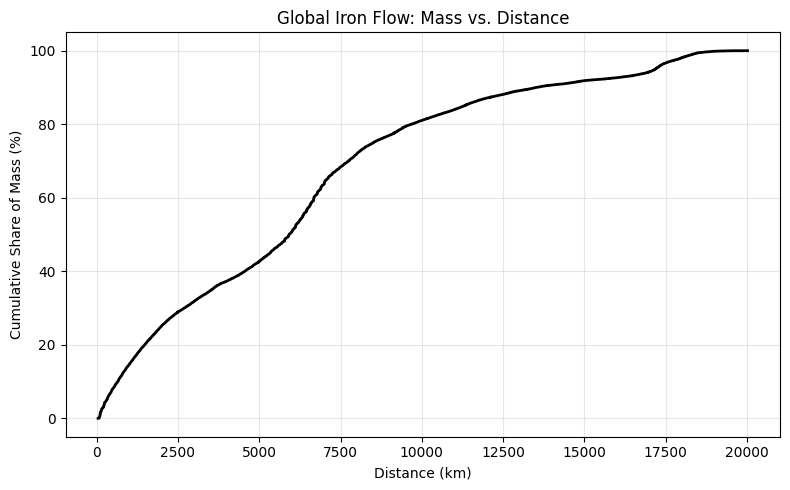

In [64]:
# Create the full flow-level DataFrame again
cdf_df = pd.DataFrame({
    "distance_km": distances,
    "flow_mass": flow_vals
})

# Sort by distance
cdf_df = cdf_df.sort_values("distance_km").reset_index(drop=True)

# Calculate cumulative sum of mass
cdf_df["cum_mass"] = cdf_df["flow_mass"].cumsum()

# Normalize to percent of total mass
total_mass = cdf_df["flow_mass"].sum()
cdf_df["mass_percent"] = 100 * cdf_df["cum_mass"] / total_mass

# Plot
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
plt.plot(cdf_df["distance_km"], cdf_df["mass_percent"], color='black', linewidth=2)
plt.xlabel("Distance (km)")
plt.ylabel("Cumulative Share of Mass (%)")
plt.title("Global Iron Flow: Mass vs. Distance")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [65]:
# 1. Create unique origin cell points
unique_origin_ids, inverse_idx = np.unique(origin_ids, return_inverse=True)
unique_origin_points = gpd.GeoDataFrame(
    geometry=[Point(origin_lon[i], origin_lat[i]) for i in unique_origin_ids],
    crs="EPSG:4326"
)

# 2. Buffer countries to avoid missing edge cases
df_country_buffered = df_country.copy()
df_country_buffered["geometry"] = df_country_buffered["geometry"].buffer(0.7)

# 3. Spatial join origin points to region polygons
unique_with_region = gpd.sjoin(
    unique_origin_points,
    df_country_buffered[["Aggregate_Region", "geometry"]],
    how="left",
    predicate="within"
)

# 4. Map region back to original flow_df based on origin_id
region_array = unique_with_region["Aggregate_Region"].values
flow_df["region"] = region_array[inverse_idx]  # Now region = region of origin
flow_df

,dest_id,flow_mass,distance_km,mass_displacement,region
0,0,5.998764e-10,9124.526290,5.473588e-06,Latin America and Caribbean
1,1,7.005316e-10,7939.548765,5.561905e-06,Latin America and Caribbean
2,2,4.665022e-10,2118.124574,9.881099e-07,Latin America and Caribbean
3,3,1.992944e-09,2539.294341,5.060672e-06,Latin America and Caribbean
4,4,1.279928e-10,2603.239365,3.331960e-07,Latin America and Caribbean
...,...,...,...,...,...
7965047,563,7.825328e-16,2818.372911,2.205469e-12,Northern America
7965048,564,6.106553e-15,2580.172951,1.575596e-11,Northern America
7965049,565,5.418980e-15,2514.478694,1.362591e-11,Northern America
7965050,566,1.854730e-15,2477.787310,4.595625e-12,Northern America


In [66]:
flow_df["region"].unique()

array(['Latin America and Caribbean', 'Oceania', 'Africa', 'Rest of Asia',
       'Northern America', 'Eastern Asia', 'Europe'], dtype=object)

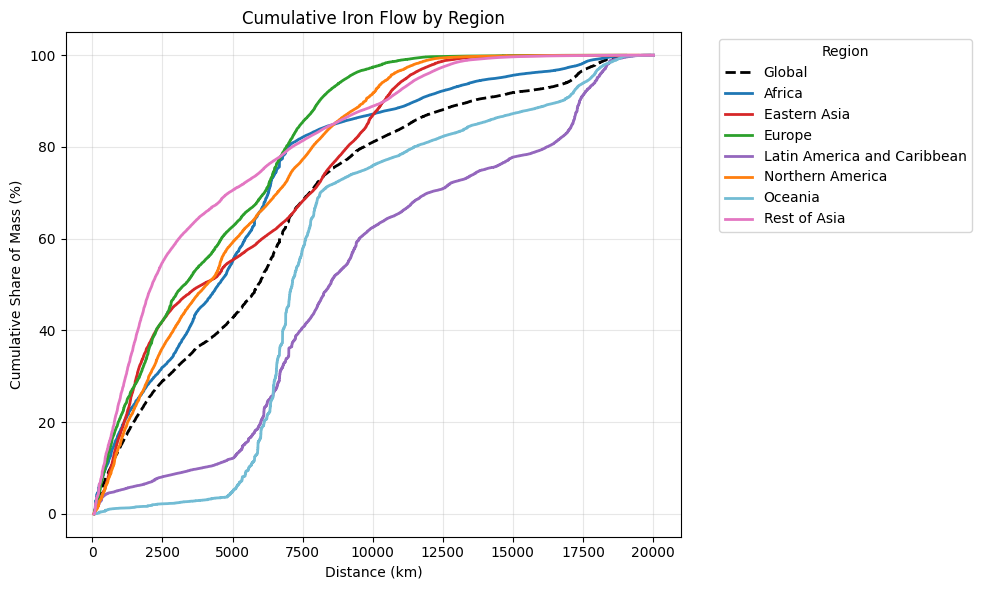

In [67]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))

# Optional: custom color palette
region_colors = {
    "Africa": "#1f77b4",                      # blue
    "Eastern Asia": "#d62728",                # red
    "Europe": "#2ca02c",                      # green
    "Latin America and Caribbean": "#9467bd", # purple
    "Northern America": "#ff7f0e",            # orange
    "Oceania": "#72bcd4",                     # lightblue
    "Rest of Asia": "#e377c2",                # pink
}

# 3. Group and plot
# Global curve (no filtering)
global_sorted = flow_df.sort_values("distance_km")
cum_mass = global_sorted["flow_mass"].cumsum()
mass_percent = 100 * cum_mass / global_sorted["flow_mass"].sum()

plt.plot(
    global_sorted["distance_km"],
    mass_percent,
    label="Global",
    color="black",
    linewidth=2,
    linestyle='--'
)

for region, group in flow_df.groupby("region"):
    if group.empty or pd.isnull(region):
        continue
    group_sorted = group.sort_values("distance_km")
    cum_mass = group_sorted["flow_mass"].cumsum()
    mass_percent = 100 * cum_mass / group_sorted["flow_mass"].sum()
    plt.plot(
        group_sorted["distance_km"], mass_percent,
        label=region,
        color=region_colors.get(region, None), linewidth=2
    )

plt.xlabel("Distance (km)")
plt.ylabel("Cumulative Share of Mass (%)")
plt.title("Cumulative Iron Flow by Region")
plt.legend(title="Region", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


In [129]:
import xarray as xr
import numpy as np
import pandas as pd
import importlib.resources as pkg_resources

# 1) Load your gravity‐model output
ds = xr.load_dataset("gravity_model_output_s1.nc")
flow   = ds["flow"].values           # shape (O, I)
olat, olon = ds["origin_lat"], ds["origin_lon"]
dlat, dlon = ds["destination_lat"], ds["destination_lon"]

# 2) build pairwise haversine distances (O × I)
def haversine(lat1, lon1, lat2, lon2):
    R = 6371.0
    φ1, φ2 = np.radians(lat1), np.radians(lat2)
    Δφ = np.radians(lat2 - lat1)
    Δλ = np.radians(lon2 - lon1)
    a = np.sin(Δφ/2)**2 + np.cos(φ1)*np.cos(φ2)*np.sin(Δλ/2)**2
    return 2*R*np.arctan2(np.sqrt(a), np.sqrt(1-a))

# vectorize: expand origin and dest into 2D grids
O, I = flow.shape
lat1 = np.repeat(olat.values[:,None], I, axis=1)
lon1 = np.repeat(olon.values[:,None], I, axis=1)
lat2 = np.repeat(dlat.values[None,:], O, axis=0)
lon2 = np.repeat(dlon.values[None,:], O, axis=0)

D = haversine(lat1, lon1, lat2, lon2)  # (O, I)

# 3) choose your “local” radius
R_km = 500.0
local_mask = (D <= R_km)

# 4) compute per‐destination‐cell self‐sufficiency
total_inflow = flow.sum(axis=0)             # (I,)
local_inflow = (flow * local_mask).sum(axis=0)
# avoid div0
ratio = np.zeros_like(total_inflow)
nz = total_inflow > 0
ratio[nz] = local_inflow[nz] / total_inflow[nz]

# 5) assign each destination‐cell to a country via ds_country fractions
ds_ct = xr.open_dataset(pkg_resources.files(ssm).joinpath("data/country_fraction.1deg.2000-2023.a.nc"))
ts = np.datetime64("2016-01-01")
da_iso3 = ds_ct.sel(time=ts).to_array(dim="ISO3")

def pick_country(lat, lon):
    return da_iso3.sel(lat=lat, lon=lon, method="nearest")\
                  .idxmax(dim="ISO3").item()

cell_countries = [
    pick_country(dlat.values[j], dlon.values[j])
    for j in range(I)
]

# 6) build DataFrame and aggregate to country
df = pd.DataFrame({
    "ISO3": cell_countries,
    "ratio": ratio,
    "inflow": total_inflow
})
# inflow‐weighted average self‐sufficiency per country
df_country = (
    df[df["inflow"]>0]
      .groupby("ISO3")
      .apply(lambda g: np.average(g["ratio"], weights=g["inflow"]))
      .reset_index(name="self_sufficiency")
)

# 7) look at top countries
df_country.sort_values("self_sufficiency", ascending=False).head(20)


/var/folders/9q/h2qmn7kd1c74_3nmyzcf2mdc0000gn/T/ipykernel_1825/3196843636.py:66: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: np.average(g["ratio"], weights=g["inflow"]))


,ISO3,self_sufficiency
13,BRA,0.610234
8,BEL,0.219411
62,NLD,0.216371
16,CHE,0.191785
32,FRA,0.145492
6,AUT,0.135096
15,CAN,0.133469
89,UKR,0.129106
86,TWN,0.121646
22,CZE,0.118195


In [130]:
df_country[df_country["ISO3"] == "CHN"]

,ISO3,self_sufficiency
18,CHN,0.072854


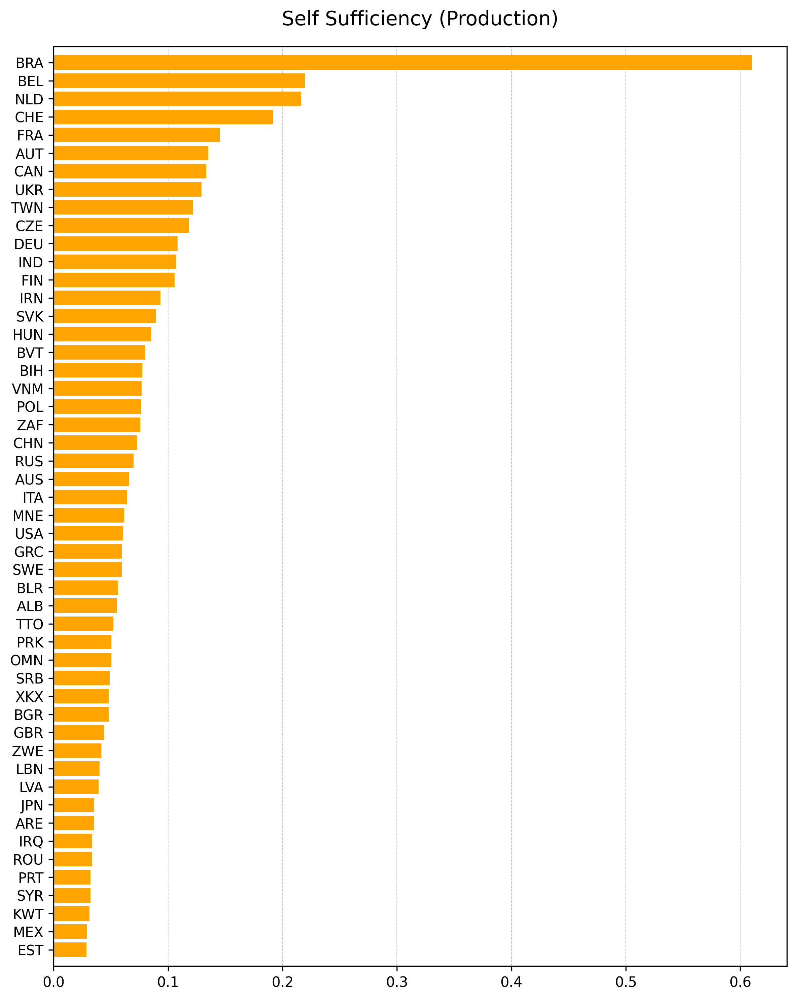

In [74]:
import matplotlib.pyplot as plt

df_sorted = df_country.sort_values('self_sufficiency', ascending=False)
df_sorted = df_sorted.head(50)	
fig, ax = plt.subplots(figsize=(8, 10), dpi=300)
ax.barh(df_sorted["ISO3"], df_sorted["self_sufficiency"], color="Orange", edgecolor='none')
ax.invert_yaxis()
ax.set_title("Self Sufficiency (Production)", fontsize=14, pad=15)

# grid styling
ax.xaxis.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
ax.set_axisbelow(True)

# remove default margins
ax.margins(y=0.01)

fig.tight_layout()

In [131]:
import numpy as np
import xarray as xr
import pandas as pd
import importlib.resources as pkg_resources

# 1. Load your grid-cell self-sufficiency data
# (destination-level: ISO3, ratio, inflow)
df = pd.DataFrame({
    "ISO3": cell_countries,
    "ratio": ratio,
    "inflow": total_inflow,
    "dlat": dlat.values,
    "dlon": dlon.values
})
df = df[df["inflow"] > 0]

# 2. Compute per-country maximum pairwise distance between own grid cells
def haversine_1d(lat1, lon1, lat2, lon2):
    return haversine(np.array(lat1), np.array(lon1), np.array(lat2), np.array(lon2))

max_dist = {}
for iso, group in df.groupby("ISO3"):
    coords = group[["dlat","dlon"]].values
    # sample if too many
    if len(coords) > 500:
        coords = coords[np.random.choice(len(coords), 500, replace=False)]
    lats, lons = coords[:,0], coords[:,1]
    # compute pairwise haversine
    dist = haversine_1d(lats[:,None], lons[:,None], lats[None,:], lons[None,:])
    max_dist[iso] = np.nanmax(dist)

# 3. Define local radius per country (e.g., half the max internal distance)
radius_factor = 0.5
country_radius = {iso: max_dist[iso] * radius_factor for iso in max_dist}

# 4. Compute adaptive self-sufficiency per destination cell
# (reuse haversine D computed earlier)
cell_country = np.array(cell_countries)
adaptive_ratio = np.zeros_like(ratio)
for j in range(len(ratio)):
    iso = cell_country[j]
    R = country_radius.get(iso, 500.0)
    mask = D[:, j] <= R  # origins within adaptive radius
    local = flow[mask, j].sum()
    adaptive_ratio[j] = local / total_inflow[j] if total_inflow[j] > 0 else 0

# 5. Aggregate to country-level (inflow-weighted)
df["adaptive_ratio"] = adaptive_ratio
df_country = (
    df.groupby("ISO3")
      .apply(lambda g: np.average(g["adaptive_ratio"], weights=g["inflow"]))
      .reset_index(name="self_sufficiency_adaptive")
)

# 6. Compare to fixed-radius method
df_fix = (
    df.assign(fixed_ratio=df["ratio"])
      .groupby("ISO3")
      .apply(lambda g: np.average(g["fixed_ratio"], weights=g["inflow"]))
      .reset_index(name="self_sufficiency_fixed")
)

df_inflow = (
    df.groupby("ISO3")
      .agg(total_inflow=("inflow", "sum"))
      .reset_index()
)

df_compare = pd.merge(df_fix, df_country, on="ISO3")
print(df_compare.sort_values("self_sufficiency_adaptive", ascending=False).head(20))
df_fix

   ISO3  self_sufficiency_fixed  self_sufficiency_adaptive
13  BRA                0.610234                   0.695013
73  RUS                0.069758                   0.352572
15  CAN                0.133469                   0.336411
91  USA                0.060700                   0.215577
18  CHN                0.072854                   0.213192
40  IND                0.107222                   0.135646
41  IRN                0.093440                   0.130074
93  VNM                0.077034                   0.125457
32  FRA                0.145492                   0.123926
95  ZAF                0.075669                   0.086092
89  UKR                0.129106                   0.079585
44  ITA                0.064273                   0.068670
23  DEU                0.108501                   0.068010
5   AUS                0.066030                   0.066277
45  JPN                0.035232                   0.045500
79  SWE                0.059567                   0.0412

/var/folders/9q/h2qmn7kd1c74_3nmyzcf2mdc0000gn/T/ipykernel_1825/950054880.py:51: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: np.average(g["adaptive_ratio"], weights=g["inflow"]))
/var/folders/9q/h2qmn7kd1c74_3nmyzcf2mdc0000gn/T/ipykernel_1825/950054880.py:59: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: np.average(g["fixed_ratio"], weights=g["inflow"]))


,ISO3,self_sufficiency_fixed
0,AFG,0.003197
1,AGO,0.000213
2,ALB,0.055400
3,ARE,0.035151
4,ARG,0.005869
...,...,...
93,VNM,0.077034
94,XKX,0.048054
95,ZAF,0.075669
96,ZMB,0.001641


In [132]:
df_prod = df_country.copy()
df_prod = df_prod.merge(df_inflow, on=["ISO3"], how="inner")
df_prod = df_prod.rename(columns={"self_sufficiency_adaptive": "self_sufficiency"})
df_prod

,ISO3,self_sufficiency,total_inflow
0,AFG,0.000000,2.694541e+04
1,AGO,0.000109,2.020379e+05
2,ALB,0.000000,1.666304e+05
3,ARE,0.000000,2.868927e+06
4,ARG,0.000335,4.170354e+06
...,...,...,...
93,VNM,0.125457,8.205440e+06
94,XKX,0.000000,1.325851e+05
95,ZAF,0.086092,6.203574e+06
96,ZMB,0.000000,7.947991e+04


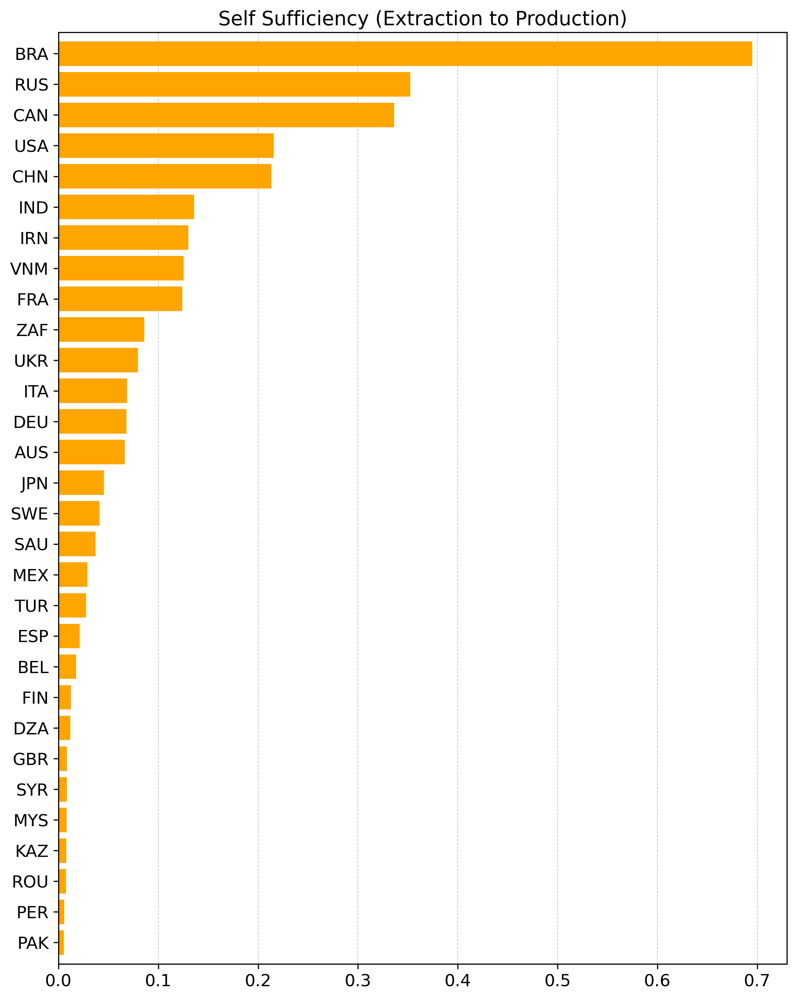

In [149]:
import matplotlib.pyplot as plt

df_sorted = df_prod.sort_values('self_sufficiency', ascending=False)
df_sorted = df_sorted.head(30)	
fig, ax = plt.subplots(figsize=(8, 10), dpi=300)
ax.barh(df_sorted["ISO3"], df_sorted["self_sufficiency"], color="Orange", edgecolor='none')
ax.invert_yaxis()
ax.set_title("Self Sufficiency (Extraction to Production)", fontsize=14, pad=5)

# grid styling
ax.xaxis.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
ax.set_axisbelow(True)
ax.tick_params(axis='x', labelsize=12)
ax.tick_params(axis='y', labelsize=12)

# remove default margins
ax.margins(y=0.01)

fig.tight_layout()

In [55]:
# Extract only origin-related variables
ds_origin = ds[['outflow', 'origin_lat', 'origin_lon']]
# Rename coordinates to standard names
ds_origin = ds_origin.rename_vars({'origin_lat': 'lat', 'origin_lon': 'lon'})
# Set 'lat' and 'lon' as a multi-index dimension
ds_origin = ds_origin.set_index(origin=['lat', 'lon'])
# Unstack the multi-index into explicit dimensions
ds_origin = ds_origin.unstack('origin')
# The resulting dataset clearly has lat/lon dimensions
ds_origin


<xarray.Dataset> Size: 362kB
Dimensions:  (lat: 135, lon: 332)
Coordinates:
  * lat      (lat) float64 1kB -55.5 -54.5 -53.5 -52.5 ... 77.5 78.5 79.5 80.5
  * lon      (lon) float64 3kB -179.5 -176.5 -175.5 -162.5 ... 177.5 178.5 179.5
Data variables:
    outflow  (lat, lon) float64 359kB nan nan nan nan nan ... nan nan nan nan
Attributes:
    description:  Gravity model flow matrix with inflow/outflow totals
    flow_units:   tonne per grid

In [62]:
# Extract only destination-related variables
ds_destination = ds[['inflow', 'destination_lat', 'destination_lon']]
# Rename coordinates to standard names
ds_destination = ds_destination.rename_vars({'destination_lat': 'lat', 'destination_lon': 'lon'})
# Set 'lat' and 'lon' as a multi-index dimension
ds_destination = ds_destination.set_index(destination=['lat', 'lon'])
# Unstack the multi-index into explicit dimensions
ds_destination = ds_destination.unstack('destination')
# The resulting dataset clearly has lat/lon dimensions
ds_destination


<xarray.Dataset> Size: 141kB
Dimensions:  (lat: 92, lon: 189)
Coordinates:
  * lat      (lat) float64 736B -37.5 -36.5 -34.5 -33.5 ... 61.5 64.5 65.5 66.5
  * lon      (lon) float64 2kB -123.5 -122.5 -112.5 -111.5 ... 144.5 150.5 174.5
Data variables:
    inflow   (lat, lon) float64 139kB nan nan nan nan nan ... nan nan nan nan
Attributes:
    description:  Gravity model flow matrix with inflow/outflow totals
    flow_units:   tonne per grid

# Stage 2

In [1]:
%load_ext autoreload
%autoreload 2

from FlowNetwork import FlowNetwork
import os
import pandas as pd

verbose = True

# Initialize the flow network with NetCDF data and variable names
grid_data_path = os.path.join('data', 'L.T.iron_flows.2008-2016_adj.a.nc')
trade_csv_path = os.path.join('data', 'iron_raw_import_export.csv')
json_path = os.path.join('data', 'grouped_region.json')
bilateral_csv_path = os.path.join('data', 'iron_io_stage_2_adj.csv')
trade_tariff_path = os.path.join('data', 'tariffsPairs_88_21_vbeta1-2024-12.csv')

fn = FlowNetwork(grid_data_path, 'source_2_adj', 'sink_2_adj', time='2016')
fn.gravity_model(distance='tariff', threshold_percentile=100, trade_tariff_path=trade_tariff_path, year=2016, tariff_weight_factor=2, verbose=True)
fn.ipf_flows(max_iters=100, tol=1e-6, verbose=verbose)
ds_centrality = fn.compute_cell_centrality(method='eigenvector', as_xarray=True)
ds_centrality


Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 15161.50
Edges after gravity calculation: 7956533
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7956533
IPF complete. Flow matrix generated with 7956533 edges.


<xarray.Dataset> Size: 523kB
Dimensions:                      (lat: 180, lon: 360)
Coordinates:
  * lat                          (lat) float64 1kB -89.5 -88.5 ... 88.5 89.5
  * lon                          (lon) float64 3kB -179.5 -178.5 ... 178.5 179.5
Data variables:
    cell_centrality_eigenvector  (lat, lon) float64 518kB nan nan ... nan nan

In [5]:
import sesame as ssm
df_centrality = ssm.grid_2_table(ds_centrality, "cell_centrality_eigenvector", agg_function="mean")
df_centrality

,ISO3,cell_centrality_eigenvector
0,ABW,4.856170e-11
1,AFG,4.238878e-07
2,AGO,2.046223e-07
3,AIA,0.000000e+00
4,ALB,1.149893e-07
...,...,...
241,YEM,4.689920e-07
242,ZAF,1.723787e-06
243,ZMB,1.585576e-07
244,ZWE,1.166967e-07


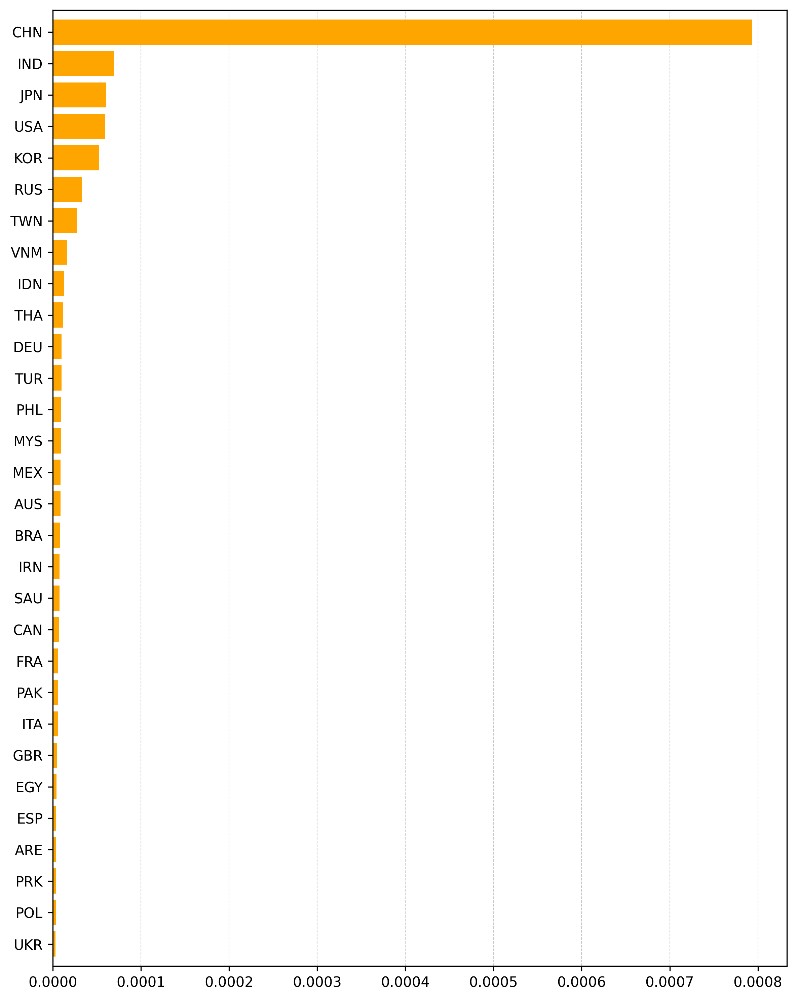

In [6]:
import matplotlib.pyplot as plt

df_sorted = df_centrality.sort_values('cell_centrality_eigenvector', ascending=False)
df_sorted = df_sorted.head(30)	
fig, ax = plt.subplots(figsize=(8, 10), dpi=300)
ax.barh(df_sorted["ISO3"], df_sorted["cell_centrality_eigenvector"], color="Orange", edgecolor='none')
ax.invert_yaxis()


# grid styling
ax.xaxis.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
ax.set_axisbelow(True)

# remove default margins
ax.margins(y=0.01)

fig.tight_layout()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 15161.50
Edges after gravity calculation: 7956533
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7956533
IPF complete. Flow matrix generated with 7956533 edges.


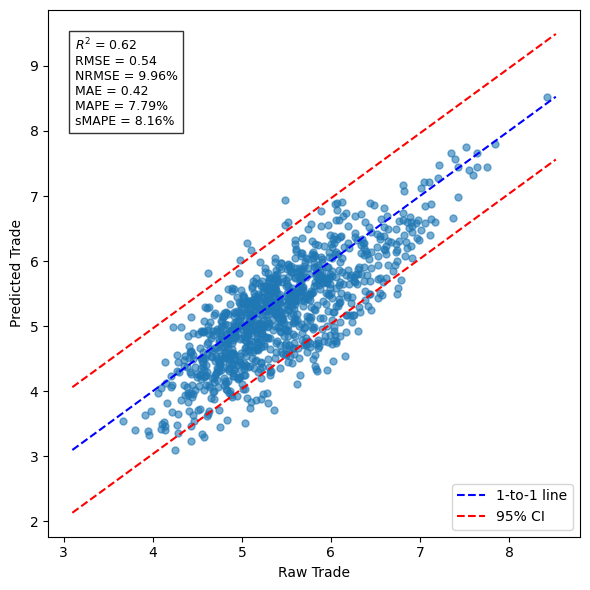

,exporter,importer,tonnes,year,exp_ISO3,imp_ISO3,raw_tonnes,pred_tonnes,ISO3
0,Australia,Australia,3.959848e+04,2016,AUS,AUS,3.817833e+04,2.001434e+05,AUS→AUS
1,Austria,Australia,6.540256e+04,2016,AUT,AUS,7.186949e+04,2.746125e+04,AUT→AUS
2,Belgium,Australia,5.962830e+04,2016,BEL,AUS,7.193004e+04,2.073047e+04,BEL→AUS
3,Brazil,Australia,1.375563e+05,2016,BRA,AUS,1.527451e+05,2.929301e+05,BRA→AUS
4,Canada,Australia,9.715082e+04,2016,CAN,AUS,9.528726e+04,3.424425e+04,CAN→AUS
...,...,...,...,...,...,...,...,...,...
1019,Spain,United States,1.157551e+06,2016,ESP,USA,1.327392e+06,1.106317e+06,ESP→USA
1020,Sweden,United States,3.841868e+05,2016,SWE,USA,4.124551e+05,3.630066e+05,SWE→USA
1021,Taiwan,United States,1.720284e+06,2016,TWN,USA,1.830743e+06,4.901380e+05,TWN→USA
1022,United Kingdom,United States,7.595541e+05,2016,GBR,USA,6.840537e+05,6.467647e+05,GBR→USA


In [75]:
%load_ext autoreload
%autoreload 2

from FlowNetwork import FlowNetwork
import os
import pandas as pd

verbose = True

# Initialize the flow network with NetCDF data and variable names
grid_data_path = os.path.join('data', 'L.T.iron_flows.2008-2016_adj.a.nc')
trade_csv_path = os.path.join('data', 'iron_raw_import_export.csv')
json_path = os.path.join('data', 'grouped_region.json')
bilateral_csv_path = os.path.join('data', 'iron_io_stage_2_adj.csv')
trade_tariff_path = os.path.join('data', 'tariffsPairs_88_21_vbeta1-2024-12.csv')

fn = FlowNetwork(grid_data_path, 'source_2_adj', 'sink_2_adj', time='2016')
fn.gravity_model(distance='tariff', threshold_percentile=100, trade_tariff_path=trade_tariff_path, year=2016, tariff_weight_factor=2, verbose=True)
fn.ipf_flows(max_iters=100, tol=1e-6, verbose=verbose)
fn.bilateral_flow(2016, json_path)
df_2, metrics = fn.validate_bilateral(bilateral_csv_path, year=2016, column='tonnes_adj_2', x_log=True, y_log=True, rm_outliers=False)
df_2
fn.save_to_netcdf(filename="gravity_model_output_s2.nc")

In [52]:
metrics

{'R2': np.float64(0.6214851551549251),
 'RMSE': np.float64(0.5413567503246448),
 'NRMSE': np.float64(0.09963095678587668),
 'MAE': np.float64(0.4214954495080755),
 'MAPE': np.float64(7.786935040993424),
 'sMAPE': np.float64(8.157075498547664),
 'n_points': 1024}

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Running Gravity Model...
[EXPONENTIAL] Mean adjusted distance: 15161.50
Edges after gravity calculation: 7956533
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 7956533
IPF complete. Flow matrix generated with 7956533 edges.


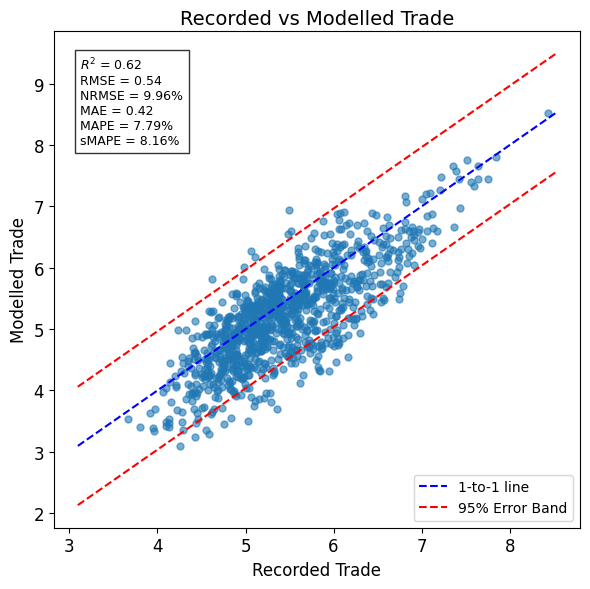

In [33]:
%load_ext autoreload
%autoreload 2

from FlowNetwork import FlowNetwork
import os
import pandas as pd

verbose = True

# Initialize the flow network with NetCDF data and variable names
grid_data_path = os.path.join('data', 'L.T.iron_flows.2008-2016_adj.a.nc')
trade_csv_path = os.path.join('data', 'iron_raw_import_export.csv')
json_path = os.path.join('data', 'grouped_region.json')
bilateral_csv_path = os.path.join('data', 'iron_io_stage_2_adj.csv')
trade_tariff_path = os.path.join('data', 'tariffsPairs_88_21_vbeta1-2024-12.csv')

fn = FlowNetwork(grid_data_path, 'source_2_adj', 'sink_2_adj', time='2016')
fn.gravity_model(distance='tariff', threshold_percentile=100, trade_tariff_path=trade_tariff_path, year=2016, tariff_weight_factor=2, verbose=True)
fn.ipf_flows(max_iters=100, tol=1e-6, verbose=verbose)
fn.bilateral_flow(2016, json_path)
df_2, metrics = fn.validate_bilateral(bilateral_csv_path, year=2016, column='tonnes_adj_2', x_log=True, y_log=True, title="Recorded vs Modelled Trade", x_label="Recorded Trade", y_label="Modelled Trade", fontsize=12)
df_2.to_csv("model_output_s2.csv", index=False)

In [34]:
df_2 = pd.read_csv("model_output_s2.csv")
# 1. Total exports per country-year (including domestic)
exports_raw = df_2.groupby(["exp_ISO3", "year"], as_index=False)["raw_tonnes"].sum().rename(columns={"tonnes": "raw_exports"})

# 2. Total imports per country-year (including domestic)
imports_raw = df_2.groupby(["imp_ISO3", "year"], as_index=False)["raw_tonnes"].sum().rename(columns={"tonnes": "raw_imports"})

exports_raw, imports_raw


(                exp_ISO3  year    raw_tonnes
 0                    AUS  2016  6.726216e+06
 1                    AUT  2016  1.274478e+07
 2                    BEL  2016  1.280838e+07
 3                    BRA  2016  2.709973e+07
 4                    CAN  2016  1.680285e+07
 5                    CHN  2016  6.403460e+08
 6                    CZE  2016  6.642374e+06
 7                    DEU  2016  6.397928e+07
 8                    ESP  2016  1.935322e+07
 9                    FIN  2016  5.629464e+06
 10                   FRA  2016  2.282114e+07
 11                   GBR  2016  9.919978e+06
 12                   GRC  2016  2.207582e+06
 13                   IDN  2016  4.464179e+06
 14                   IND  2016  7.841346e+07
 15                   ITA  2016  3.198519e+07
 16                   JPN  2016  1.671289e+08
 17                   KOR  2016  1.028381e+08
 18                   MEX  2016  1.915881e+07
 19                   NLD  2016  1.190801e+07
 20                   POL  2016  9

In [35]:
# 1. Total exports per country-year (including domestic)
exports_pred = df_2.groupby(["exp_ISO3", "year"], as_index=False)["pred_tonnes"].sum().rename(columns={"tonnes": "pred_exports"})

# 2. Total imports per country-year (including domestic)
imports_pred = df_2.groupby(["imp_ISO3", "year"], as_index=False)["pred_tonnes"].sum().rename(columns={"tonnes": "pred_imports"})

exports_pred, imports_pred

(                exp_ISO3  year   pred_tonnes
 0                    AUS  2016  5.242988e+06
 1                    AUT  2016  9.788882e+06
 2                    BEL  2016  8.030924e+06
 3                    BRA  2016  2.925937e+07
 4                    CAN  2016  1.010436e+07
 5                    CHN  2016  6.060667e+08
 6                    CZE  2016  7.095597e+06
 7                    DEU  2016  4.654480e+07
 8                    ESP  2016  1.227891e+07
 9                    FIN  2016  3.962365e+06
 10                   FRA  2016  1.101544e+07
 11                   GBR  2016  7.669768e+06
 12                   GRC  2016  7.305905e+05
 13                   IDN  2016  4.370497e+06
 14                   IND  2016  9.142783e+07
 15                   ITA  2016  2.064661e+07
 16                   JPN  2016  9.473071e+07
 17                   KOR  2016  6.335555e+07
 18                   MEX  2016  1.820691e+07
 19                   NLD  2016  3.968397e+06
 20                   POL  2016  6

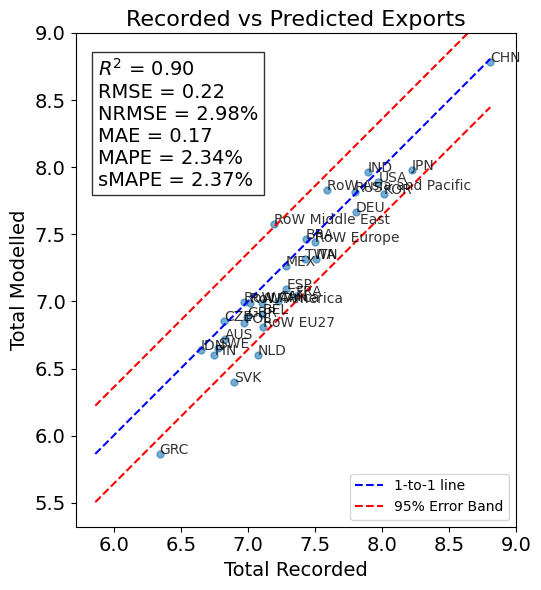

In [43]:
df_exports = exports_raw.merge(exports_pred, on=["exp_ISO3", "year"])
df_exports = df_exports.rename(columns={"exp_ISO3":"ISO3"})
_limplot(df=df_exports, x_col="raw_tonnes", 
         y_col="pred_tonnes", x_log=True, y_log=True,
        title="Recorded vs Predicted Exports",
         x_label="Total Recorded",
         y_label="Total Modelled",
         fontsize=14, xmax=9, ymax=9)

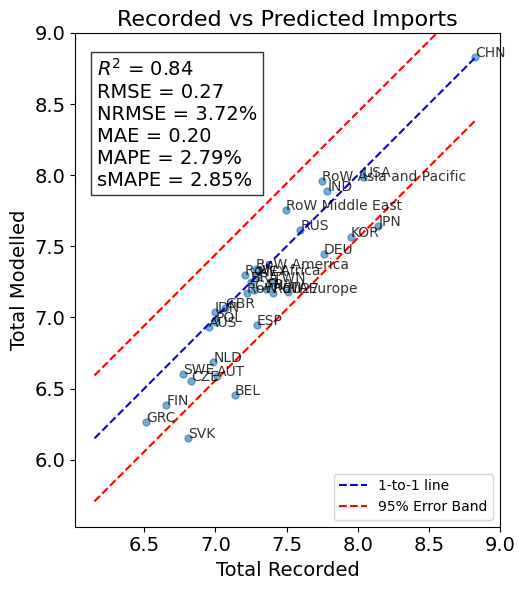

In [44]:
df_imports = imports_raw.merge(imports_pred, on=["imp_ISO3", "year"])
df_imports = df_imports.rename(columns={"imp_ISO3":"ISO3"})
_limplot(df=df_imports, x_col="raw_tonnes", 
         y_col="pred_tonnes", x_log=True, y_log=True,
                  title="Recorded vs Predicted Imports",
         x_label="Total Recorded",
         y_label="Total Modelled",
         fontsize=14, xmax=9, ymax=9)

In [57]:
import xarray as xr
import numpy as np
def gridded_inflow_outflow(ds_flow):
    # Extract 1D coordinate arrays and flow variables
    origin_lat = ds_flow['origin_lat'].values
    origin_lon = ds_flow['origin_lon'].values
    destination_lat = ds_flow['destination_lat'].values
    destination_lon = ds_flow['destination_lon'].values

    outflow = ds_flow['outflow'].values
    inflow = ds_flow['inflow'].values

    # Round lat/lon to 1-degree grid centers
    origin_lat_rounded = np.round(origin_lat, 1)
    origin_lon_rounded = np.round(origin_lon, 1)
    destination_lat_rounded = np.round(destination_lat, 1)
    destination_lon_rounded = np.round(destination_lon, 1)

    # Create grid for lat/lon
    lat_vals = np.arange(-89.5, 89.5, 1)
    lon_vals = np.arange(-179.5, 179.5, 1)

    # Initialize empty 2D arrays
    outflow_grid = np.full((len(lat_vals), len(lon_vals)), np.nan)
    inflow_grid = np.full((len(lat_vals), len(lon_vals)), np.nan)

    # Map outflow to grid
    for lat, lon, val in zip(origin_lat_rounded, origin_lon_rounded, outflow):
        lat_idx = np.where(lat_vals == lat)[0]
        lon_idx = np.where(lon_vals == lon)[0]
        if lat_idx.size > 0 and lon_idx.size > 0:
            outflow_grid[lat_idx[0], lon_idx[0]] = val

    # Map inflow to grid
    for lat, lon, val in zip(destination_lat_rounded, destination_lon_rounded, inflow):
        lat_idx = np.where(lat_vals == lat)[0]
        lon_idx = np.where(lon_vals == lon)[0]
        if lat_idx.size > 0 and lon_idx.size > 0:
            inflow_grid[lat_idx[0], lon_idx[0]] = val

    # Create xarray Dataset
    ds_grid = xr.Dataset(
        {
            "outflow": (["lat", "lon"], outflow_grid),
            "inflow": (["lat", "lon"], inflow_grid),
        },
        coords={
            "lat": lat_vals,
            "lon": lon_vals,
        },
        attrs={
            "description": "Gridded 1° inflow and outflow dataset",
            "units": ds_flow.flow_units if "flow_units" in ds_flow.attrs else "tonnes per grid",
        }
    )

    return ds_grid

In [313]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.cm as cm
import cartopy.crs as ccrs
import sesame as ssm

def plot_flow_network(
    flow, origin_coords, destination_coords,
    ds_bg,
    num_edges=1000,
    vmin=None, vmax=None,
    extend_max=False, extend_min=False,
    title="Flow Network",
    label=None,
    color='coolwarm',
    levels=10,
    edge_thickness=1.5,
    edge_alpha=0.5,
    edge_cmap="plasma"
):
    # Clean flow
    flow_clean = np.where(np.isfinite(flow), flow, 0)

    # Plot SESAME background (e.g., netflow)
    ax = ssm.plot_map(
        variable="netflow",
        dataset=ds_bg,
        vmin=vmin, vmax=vmax,
        extend_max=extend_max, extend_min=extend_min,
        color=color,
        levels=levels,
        title=title,
        label=label,
        show=False,
        out_bound=False,
        remove_ata=True
    )

    # Compute top N edge indices
    flat_indices = np.argpartition(flow_clean.ravel(), -num_edges)[-num_edges:]
    top_indices = flat_indices[np.argsort(flow_clean.ravel()[flat_indices])][::-1]
    out_idxs, in_idxs = np.unravel_index(top_indices, flow.shape)

    # Extract flow values and normalize for edge styling
    flow_vals = flow_clean[out_idxs, in_idxs]
    norm = mcolors.Normalize(vmin=flow_vals.min(), vmax=flow_vals.max())
    cmap = plt.get_cmap(edge_cmap)

    min_width, max_width = 0.1, 5

    for out_i, in_j, val in zip(out_idxs, in_idxs, flow_vals):
        if val > 0:
            lat1, lon1 = origin_coords[out_i]
            lat2, lon2 = destination_coords[in_j]
            color = cmap(norm(val))
            width = min_width + (max_width - min_width) * norm(val)
            ax.plot(
                [lon1, lon2], [lat1, lat2],
                color=color,
                linewidth=width,
                alpha=edge_alpha,
                # transform=ccrs.Geodetic()
                transform=ccrs.PlateCarree()
            )

    # Colorbar for edges
    sm = cm.ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])
    fig = plt.gcf()
    cbar = fig.colorbar(sm, ax=ax, orientation='vertical', shrink=0.6, pad=0.01, aspect=30)
    cbar.set_label("Flow Magnitude log10(tonnes Fe)", fontsize=9)
    cbar.ax.tick_params(labelsize=8)

    # Calculate share of flow visualized (using absolute values)
    flat_flow = np.abs(flow.ravel())
    sorted_flow = np.sort(flat_flow)[::-1]  # Descending
    top_1200_sum = sorted_flow[:1200].sum()
    total_sum = sorted_flow.sum()
    percent = (top_1200_sum / total_sum) * 100

    print(f"Top 1200 edges represent: {percent:.2f}% of total flow magnitude")


    plt.show()


In [310]:
# Load flow matrix dataset
ds_flow = xr.load_dataset("gravity_model_output_s2.nc")
flow = np.log10(ds_flow["flow"].values)
origin_coords = list(zip(ds_flow["origin_lat"].values, ds_flow["origin_lon"].values))
destination_coords = list(zip(ds_flow["destination_lat"].values, ds_flow["destination_lon"].values))

# Load background dataset with outflow/inflow data
ds_grid = gridded_inflow_outflow(ds_flow)
ds_grid["netflow"] = ds_grid["outflow"] - ds_grid["inflow"]
grid_ds = xr.open_dataset("/Users/faisal/Documents/GitHub/SESAME/src/sesame/data/G.land_sea_mask.1deg.nc")
ds_grid["netflow"] = (ds_grid["netflow"] * 1e6) / grid_ds["grid_area"]

Top 1200 edges represent: nan% of total flow magnitude


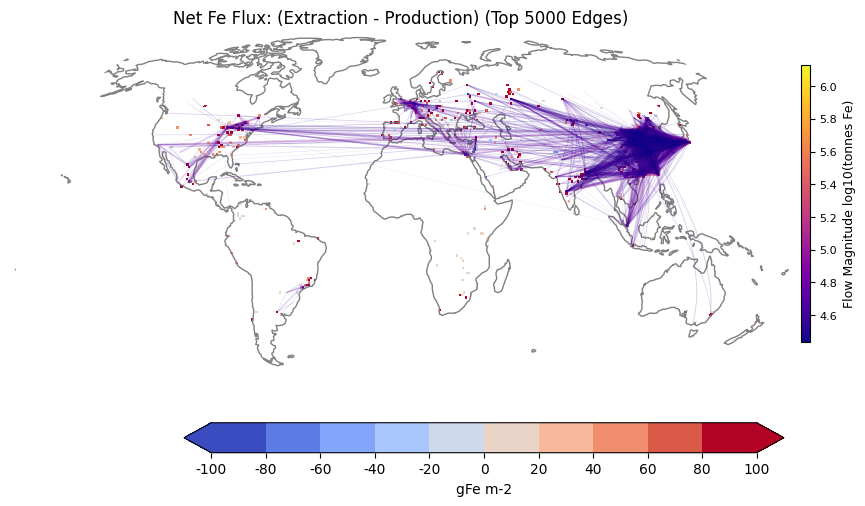

In [316]:
plot_flow_network(
    ds_bg=ds_grid,
    flow=flow,
    origin_coords=origin_coords,
    destination_coords=destination_coords,
    num_edges=5000,
    vmin=-100, vmax=100,
    title="Net Fe Flux: (Extraction - Production) (Top 5000 Edges)",
    label="gFe m-2",
    extend_min=True,
    extend_max=True,
    edge_alpha=0.2, edge_thickness=1
)


In [64]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import numpy as np
import xarray as xr

# Load corrected NetCDF file
ds = xr.load_dataset("gravity_model_output_s2.nc")

flow = ds['flow'].values  # shape (origin, destination)
origin_lat = ds['origin_lat'].values
origin_lon = ds['origin_lon'].values
destination_lat = ds['destination_lat'].values
destination_lon = ds['destination_lon'].values

# Get non-zero flows
origin_ids, dest_ids = np.nonzero(flow)
flow_vals = flow[origin_ids, dest_ids]

# Filter by flow threshold
flow_threshold = 100
valid_mask = flow_vals >= flow_threshold
origin_ids = origin_ids[valid_mask]
dest_ids = dest_ids[valid_mask]
flow_vals = flow_vals[valid_mask]

# Get coordinates of valid flows
lat1 = origin_lat[origin_ids]
lon1 = origin_lon[origin_ids]
lat2 = destination_lat[dest_ids]
lon2 = destination_lon[dest_ids]

# Vectorized Haversine
def haversine_vectorized(lat1, lon1, lat2, lon2):
    R = 6371.0
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat / 2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2.0)**2
    a = np.clip(a, 0, 1)
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
    return R * c

# Compute edge-level distances and mass displacement
distances = haversine_vectorized(lat1, lon1, lat2, lon2)
mass_disp = flow_vals * distances

# Aggregate to origin node
flow_df = pd.DataFrame({
    'origin_id': origin_ids,
    'mass_disp': mass_disp
})
node_disp = flow_df.groupby('origin_id')['mass_disp'].sum().reset_index()

# Build GeoDataFrame of origin nodes
geometry = [Point(origin_lon[i], origin_lat[i]) for i in node_disp['origin_id']]
gdf = gpd.GeoDataFrame(node_disp, geometry=geometry, crs="EPSG:4326")

# Select top 20% of nodes by mass displacement
threshold = gdf['mass_disp'].quantile(0.80)
gdf_top20 = gdf[gdf['mass_disp'] >= threshold]
gdf_top20["km_mt"] = gdf_top20["mass_disp"] * 1e-6
gdf_top20["log_km_mt"] = np.log10(gdf_top20["km_mt"])
gdf_top20

/Users/faisal/miniconda3/envs/sesame/lib/python3.13/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/Users/faisal/miniconda3/envs/sesame/lib/python3.13/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,origin_id,mass_disp,geometry,km_mt,log_km_mt
5,5,2.781266e+10,POINT (150.5 -34.5),27812.656846,4.444242
7,7,2.695265e+10,POINT (-60.5 -33.5),26952.649943,4.430601
11,11,1.823006e+10,POINT (30.5 -27.5),18230.056393,4.260788
12,12,2.097821e+10,POINT (27.5 -26.5),20978.208245,4.321768
18,18,2.166788e+10,POINT (-46.5 -23.5),21667.875051,4.335816
...,...,...,...,...,...
532,542,5.322758e+10,POINT (59.5 53.5),53227.583478,4.726137
533,543,2.412222e+10,POINT (87.5 53.5),24122.223243,4.382417
540,550,1.628575e+10,POINT (61.5 55.5),16285.752241,4.211808
543,554,2.228018e+10,POINT (60.5 57.5),22280.182187,4.347919


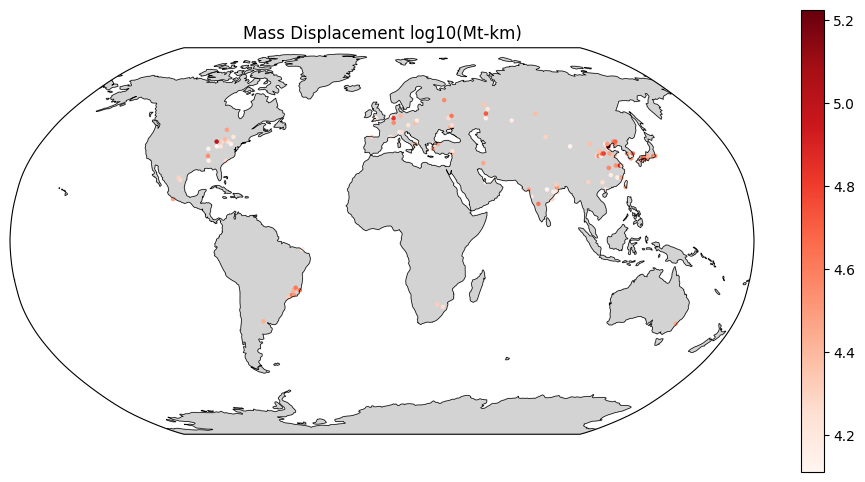

In [65]:
import matplotlib.pyplot as plt

import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Load your shapefile
gdf_top20 = gdf_top20.to_crs(epsg=4326)  # Ensure data is in latitude and longitude

# Define the Robinson projection
projection = ccrs.Robinson()

# Create a subplot with the Robinson projection
fig, ax = plt.subplots(subplot_kw={'projection': projection}, figsize=(12, 6))

# Plotting the points
# Converting GeoDataFrame to use the `.plot` method from matplotlib for GeoDataFrames
gdf_top20.plot(column="log_km_mt", cmap="Reds", legend=True, markersize=5, ax=ax, transform=ccrs.Geodetic())

# Adding geographical features
ax.coastlines(resolution='110m', color='black', linewidth=0.5)
ax.add_feature(cfeature.LAND, color='lightgray',linewidth=1)
ax.set_global()  # Optionally set a global extent

# Set the title
ax.set_title('Mass Displacement log10(Mt-km)')

# Display the plot
plt.show()


In [239]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import numpy as np
import xarray as xr

# Load the flow dataset
ds = xr.load_dataset("gravity_model_output_s2.nc")
flow = ds['flow'].values  # shape (origin, destination)

origin_lat = ds['origin_lat'].values
origin_lon = ds['origin_lon'].values
destination_lat = ds['destination_lat'].values
destination_lon = ds['destination_lon'].values

# Get all non-zero flows
origin_ids, dest_ids = np.nonzero(flow)
flow_vals = flow[origin_ids, dest_ids]

# Get coordinates of all valid flows
lat1 = origin_lat[origin_ids]
lon1 = origin_lon[origin_ids]
lat2 = destination_lat[dest_ids]
lon2 = destination_lon[dest_ids]

# Haversine distance function
def haversine_vectorized(lat1, lon1, lat2, lon2):
    R = 6371.0  # km
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat / 2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2.0)**2
    a = np.clip(a, 0, 1)
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
    return R * c

# Compute distances and mass displacement
distances = haversine_vectorized(lat1, lon1, lat2, lon2)
mass_displacement = flow_vals * distances

# Build flow-level DataFrame
flow_df = pd.DataFrame({
    "dest_id": dest_ids,
    "flow_mass": flow_vals,
    "distance_km": distances,
    "mass_displacement": mass_displacement
})

# Aggregate per destination node
agg_dest = (
    flow_df
    .groupby("dest_id")
    .agg(
        mass=("flow_mass", "sum"),
        mass_displacement=("mass_displacement", "sum")
    )
    .reset_index()
)

# Compute mean distance
agg_dest["mean_distance_km"] = agg_dest["mass_displacement"] / agg_dest["mass"]

# Build GeoDataFrame
geometry_dest = [Point(destination_lon[i], destination_lat[i]) for i in agg_dest["dest_id"]]
gdf_dest = gpd.GeoDataFrame(agg_dest, geometry=geometry_dest, crs="EPSG:4326")

# Optional: add log-scale
gdf_dest["km_mt"] = gdf_dest["mass_displacement"] * 1e-6
gdf_dest["log_km_mt"] = np.log10(gdf_dest["km_mt"])

# Final output
gdf_dest


,dest_id,mass,mass_displacement,mean_distance_km,geometry,km_mt,log_km_mt
0,0,1.042021e-05,1.350549e-01,12960.863160,POINT (-71.5 -55.5),1.350549e-07,-6.869490
1,1,5.248548e-03,6.790559e+01,12937.977601,POINT (-70.5 -55.5),6.790559e-05,-4.168094
2,2,5.985807e-01,7.730704e+03,12915.057655,POINT (-69.5 -55.5),7.730704e-03,-2.111781
3,3,1.283987e+03,1.655335e+07,12892.149971,POINT (-68.5 -55.5),1.655335e+01,1.218886
4,4,1.783725e+00,2.295530e+04,12869.301745,POINT (-67.5 -55.5),2.295530e-02,-1.639117
...,...,...,...,...,...,...,...
14004,14004,3.192660e-07,1.716150e-03,5375.298114,POINT (91.5 77.5),1.716150e-09,-8.765445
14005,14005,5.621020e-08,3.020196e-04,5373.039279,POINT (92.5 77.5),3.020196e-10,-9.519965
14006,14006,1.807966e-07,9.837091e-04,5440.970165,POINT (93.5 78.5),9.837091e-10,-9.007133
14007,14007,1.776827e-07,9.798185e-04,5514.427645,POINT (90.5 79.5),9.798185e-10,-9.008854


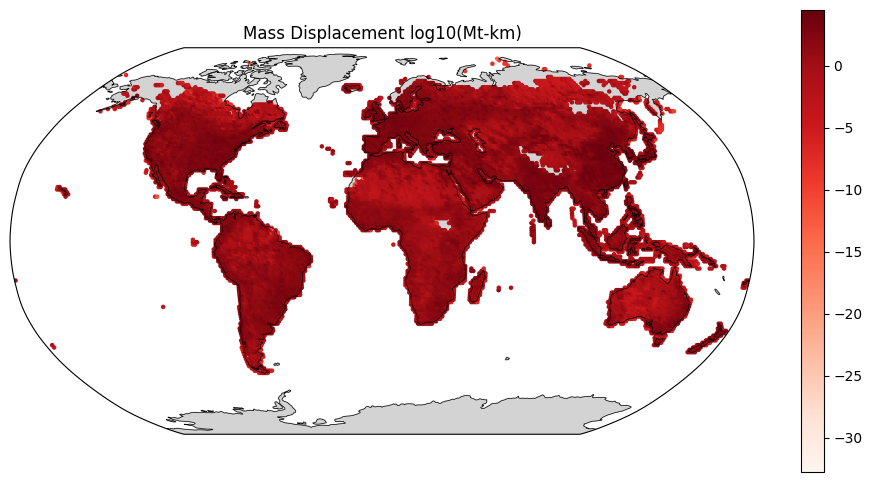

In [67]:
import matplotlib.pyplot as plt

import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Load your shapefile
gdf_dest = gdf_dest.to_crs(epsg=4326)  # Ensure data is in latitude and longitude

# Define the Robinson projection
projection = ccrs.Robinson()

# Create a subplot with the Robinson projection
fig, ax = plt.subplots(subplot_kw={'projection': projection}, figsize=(12, 6))

# Plotting the points
# Converting GeoDataFrame to use the `.plot` method from matplotlib for GeoDataFrames
gdf_dest.plot(column="log_km_mt", cmap="Reds", legend=True, markersize=5, ax=ax, transform=ccrs.Geodetic())

# Adding geographical features
ax.coastlines(resolution='110m', color='black', linewidth=0.5)
ax.add_feature(cfeature.LAND, color='lightgray',linewidth=1)
ax.set_global()  # Optionally set a global extent

# Set the title
ax.set_title('Mass Displacement log10(Mt-km)')

# Display the plot
plt.show()


In [240]:
country_gdf = gpd.read_file("/Users/faisal/Documents/GitHub/SESAME/src/sesame/data/CShapes_v2_converted_2023.shp")
country_gdf

,cntry_name,area,capname,caplong,caplat,gwcode,gwsdate,gwsyear,gwsmonth,gwsday,...,gwemonth,gweday,Shape_Leng,Shape_Area,ISO_A3,NAME_EN,ISO3,start_d,end_d,geometry
0,Afghanistan,641908.3,Kabul,69.18333,34.51667,700,1919-05-01,1919,5,1,...,12,31,50.7724438402,62.5672779274,nan,nan,AFG,1919-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((72.73387 37.13538, 72.75888 37.18068..."
1,Albania,28656.479,Tirane,19.81889,41.3275,339,1920-02-11,1920,2,11,...,12,31,9.60344542465,3.07370455193,nan,nan,ALB,1920-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((19.75433 42.64111, 19.76479 42.58787..."
2,Algeria,2317487.5,Algiers,3.050556,36.76305,615,1962-07-05,1962,7,5,...,12,31,70.5242220342,213.513311992,nan,nan,DZA,1962-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((8.63222 36.88195, 8.63805 36.83111, ..."
3,American Samoa,0.0,nan,0.0,0.0,0,2019-01-01,1950,1,1,...,1,1,1.07370505154,0.0151014394369,ASM,American Samoa,ASM,1950-01-01 00:00:00,2024-01-01 00:00:00,"MULTIPOLYGON (((-168.16157 -14.53289, -168.173..."
4,Andorra,0.0,nan,0.0,0.0,0,2019-01-01,1950,1,1,...,1,1,1.05795317667,0.0495607344854,AND,Andorra,AND,1950-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((1.47862 42.641, 1.48653 42.65042, 1...."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
241,Western Sahara,269071.7,El Aaiun,-13.200006,27.14998,609,1958-10-10,1958,10,10,...,11,13,28.7360378465,24.0016076004,nan,nan,ESH,1958-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((-17.07028 20.92083, -17.07555 20.899..."
242,Yemen (Arab Republic of Yemen),453630.66,Sana'a,44.18333,15.28333,678,2000-06-12,2000,6,12,...,12,31,34.0166451987,38.2880671975,nan,nan,YEM,2000-01-01 00:00:00,2024-01-01 00:00:00,"MULTIPOLYGON (((52.38853 12.15097, 52.34138 12..."
243,Zambia,751926.8,Lusaka,28.28333,-15.41667,551,1964-01-22,1964,1,22,...,12,31,49.1213092363,62.8145883465,nan,nan,ZMB,1964-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((32.94055 -9.40933, 32.9436 -9.45584,..."
244,Zimbabwe (Rhodesia),389856.06,Harare,31.04472,-17.81778,552,1965-11-11,1965,11,11,...,12,31,26.2389597272,33.4624061942,nan,nan,ZWE,1965-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((30.41634 -15.63579, 30.42236 -16.005..."


In [241]:
region_mapping = {
    'Australia and New Zealand': 'Oceania',
    'Caribbean': 'Latin America and Caribbean',
    'Central America': 'Latin America and Caribbean',
    'Central Asia': 'Rest of Asia',
    'Eastern Africa': 'Africa',
    'Eastern Asia': 'Eastern Asia',
    'Eastern Europe': 'Europe',
    'Melanesia': 'Oceania',
    'Micronesia': 'Oceania',
    'Middle Africa': 'Africa',
    'Northern Africa': 'Africa',
    'Northern America': 'Northern America',
    'Northern Europe': 'Europe',
    'Polynesia': 'Oceania',
    'South America': 'Latin America and Caribbean',
    'South-eastern Asia': 'Rest of Asia',
    'Southern Africa': 'Africa',
    'Southern Asia': 'Rest of Asia',
    'Southern Europe': 'Europe',
    'Western Africa': 'Africa',
    'Western Asia': 'Rest of Asia',
    'Western Europe': 'Europe'
}

df_region = pd.read_csv("/Users/faisal/Documents/GitHub/SESAME/src/sesame/data/un_geoscheme.csv")
# Assuming df_ex_prod is your DataFrame
df_region['Aggregate_Region'] = df_region['region_2'].map(region_mapping)
df_region = df_region.rename(columns={"ISO-alpha3 code":"ISO3"})
df_region

,region_0,region_1,region_2,region_3,M49 code,ISO3,Aggregate_Region
0,Africa,Northern Africa,Northern Africa,Algeria,12.0,DZA,Africa
1,Africa,Northern Africa,Northern Africa,Egypt,818.0,EGY,Africa
2,Africa,Northern Africa,Northern Africa,Libya,434.0,LBY,Africa
3,Africa,Northern Africa,Northern Africa,Morocco,504.0,MAR,Africa
4,Africa,Northern Africa,Northern Africa,Sudan,729.0,SDN,Africa
...,...,...,...,...,...,...,...
245,Oceania,Oceania,Polynesia,Samoa,882.0,WSM,Oceania
246,Oceania,Oceania,Polynesia,Tokelau,772.0,TKL,Oceania
247,Oceania,Oceania,Polynesia,Tonga,776.0,TON,Oceania
248,Oceania,Oceania,Polynesia,Tuvalu,798.0,TUV,Oceania


In [242]:
df_country = country_gdf.merge(df_region[["ISO3", "Aggregate_Region"]], on=["ISO3"])
df_country

,cntry_name,area,capname,caplong,caplat,gwcode,gwsdate,gwsyear,gwsmonth,gwsday,...,gweday,Shape_Leng,Shape_Area,ISO_A3,NAME_EN,ISO3,start_d,end_d,geometry,Aggregate_Region
0,Afghanistan,641908.3,Kabul,69.18333,34.51667,700,1919-05-01,1919,5,1,...,31,50.7724438402,62.5672779274,nan,nan,AFG,1919-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((72.73387 37.13538, 72.75888 37.18068...",Rest of Asia
1,Albania,28656.479,Tirane,19.81889,41.3275,339,1920-02-11,1920,2,11,...,31,9.60344542465,3.07370455193,nan,nan,ALB,1920-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((19.75433 42.64111, 19.76479 42.58787...",Europe
2,Algeria,2317487.5,Algiers,3.050556,36.76305,615,1962-07-05,1962,7,5,...,31,70.5242220342,213.513311992,nan,nan,DZA,1962-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((8.63222 36.88195, 8.63805 36.83111, ...",Africa
3,American Samoa,0.0,nan,0.0,0.0,0,2019-01-01,1950,1,1,...,1,1.07370505154,0.0151014394369,ASM,American Samoa,ASM,1950-01-01 00:00:00,2024-01-01 00:00:00,"MULTIPOLYGON (((-168.16157 -14.53289, -168.173...",Oceania
4,Andorra,0.0,nan,0.0,0.0,0,2019-01-01,1950,1,1,...,1,1.05795317667,0.0495607344854,AND,Andorra,AND,1950-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((1.47862 42.641, 1.48653 42.65042, 1....",Europe
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
241,Western Sahara,269071.7,El Aaiun,-13.200006,27.14998,609,1958-10-10,1958,10,10,...,13,28.7360378465,24.0016076004,nan,nan,ESH,1958-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((-17.07028 20.92083, -17.07555 20.899...",Africa
242,Yemen (Arab Republic of Yemen),453630.66,Sana'a,44.18333,15.28333,678,2000-06-12,2000,6,12,...,31,34.0166451987,38.2880671975,nan,nan,YEM,2000-01-01 00:00:00,2024-01-01 00:00:00,"MULTIPOLYGON (((52.38853 12.15097, 52.34138 12...",Rest of Asia
243,Zambia,751926.8,Lusaka,28.28333,-15.41667,551,1964-01-22,1964,1,22,...,31,49.1213092363,62.8145883465,nan,nan,ZMB,1964-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((32.94055 -9.40933, 32.9436 -9.45584,...",Africa
244,Zimbabwe (Rhodesia),389856.06,Harare,31.04472,-17.81778,552,1965-11-11,1965,11,11,...,31,26.2389597272,33.4624061942,nan,nan,ZWE,1965-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((30.41634 -15.63579, 30.42236 -16.005...",Africa


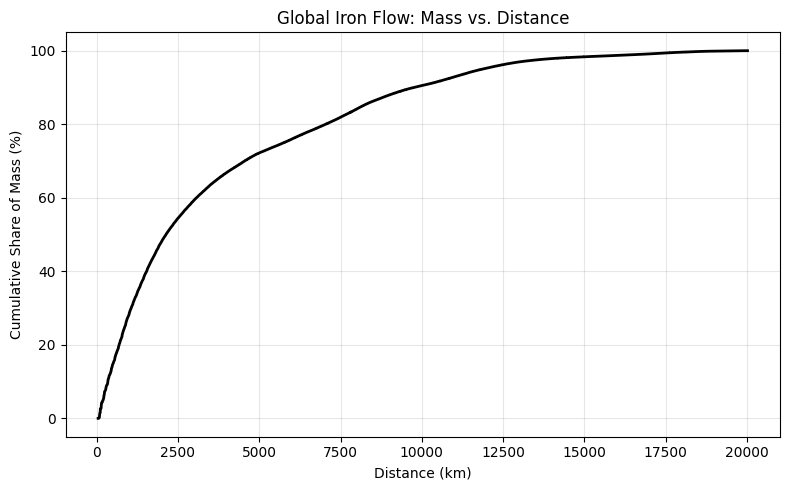

In [243]:
# Create the full flow-level DataFrame again
cdf_df = pd.DataFrame({
    "distance_km": distances,
    "flow_mass": flow_vals
})

# Sort by distance
cdf_df = cdf_df.sort_values("distance_km").reset_index(drop=True)

# Calculate cumulative sum of mass
cdf_df["cum_mass"] = cdf_df["flow_mass"].cumsum()

# Normalize to percent of total mass
total_mass = cdf_df["flow_mass"].sum()
cdf_df["mass_percent"] = 100 * cdf_df["cum_mass"] / total_mass

# Plot
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
plt.plot(cdf_df["distance_km"], cdf_df["mass_percent"], color='black', linewidth=2)
plt.xlabel("Distance (km)")
plt.ylabel("Cumulative Share of Mass (%)")
plt.title("Global Iron Flow: Mass vs. Distance")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [252]:
# 1. Create unique origin cell points
unique_origin_ids, inverse_idx = np.unique(origin_ids, return_inverse=True)
unique_origin_points = gpd.GeoDataFrame(
    geometry=[Point(origin_lon[i], origin_lat[i]) for i in unique_origin_ids],
    crs="EPSG:4326"
)

# 2. Buffer countries to avoid missing edge cases
df_country_buffered = df_country.copy()
df_country_buffered["geometry"] = df_country_buffered["geometry"].buffer(0.7)

# 3. Spatial join origin points to region polygons
unique_with_region = gpd.sjoin(
    unique_origin_points,
    df_country_buffered[["Aggregate_Region", "geometry"]],
    how="left",
    predicate="within"
)

# 4. Map region back to original flow_df based on origin_id
region_array = unique_with_region["Aggregate_Region"].values
flow_df["region"] = region_array[inverse_idx]  # Now region = region of origin
flow_df

,dest_id,flow_mass,distance_km,mass_displacement,region
0,0,8.620795e-09,9124.526290,7.866067e-05,Oceania
1,1,4.320668e-06,9153.813315,3.955059e-02,Oceania
2,2,4.903566e-04,9182.361825,4.502632e+00,Oceania
3,3,1.046805e+00,9210.165017,9.641249e+03,Oceania
4,4,1.447402e-03,9237.216207,1.336997e+01,Oceania
...,...,...,...,...,...
7956528,14004,1.271878e-10,2649.960154,3.370427e-07,Europe
7956529,14005,2.219000e-11,2673.053349,5.931504e-08,Europe
7956530,14006,7.250998e-11,2664.394804,1.931952e-07,Europe
7956531,14007,7.466306e-11,2577.327154,1.924311e-07,Europe


In [253]:
flow_df["region"].unique()

array(['Oceania', 'Latin America and Caribbean', 'Africa', 'Rest of Asia',
       'Eastern Asia', 'Northern America', 'Europe'], dtype=object)

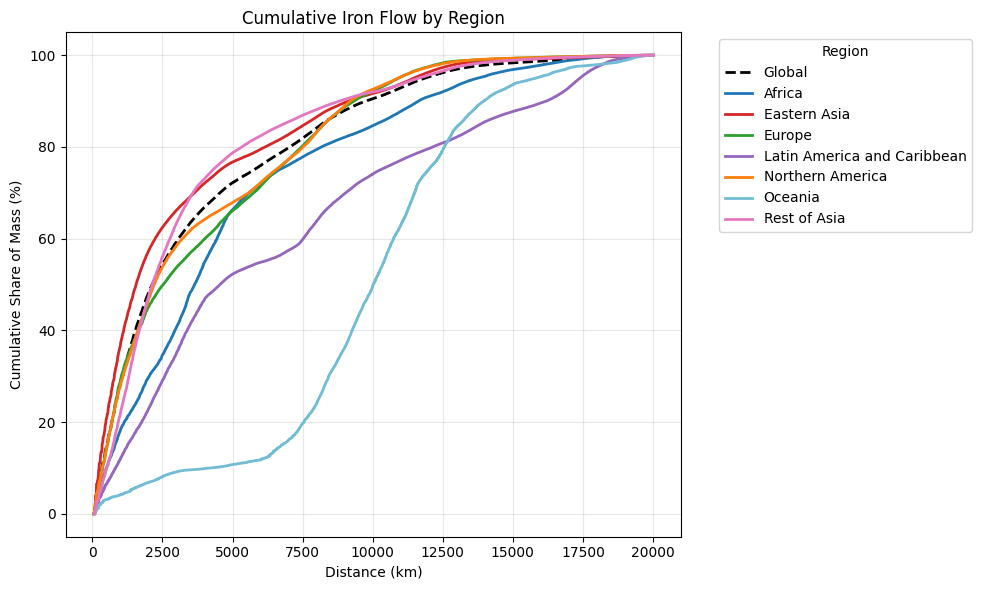

In [248]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))

# Optional: custom color palette
region_colors = {
    "Africa": "#1f77b4",                      # blue
    "Eastern Asia": "#d62728",                # red
    "Europe": "#2ca02c",                      # green
    "Latin America and Caribbean": "#9467bd", # purple
    "Northern America": "#ff7f0e",            # orange
    "Oceania": "#72bcd4",                     # lightblue
    "Rest of Asia": "#e377c2",                # pink
}

# 3. Group and plot
# Global curve (no filtering)
global_sorted = flow_df.sort_values("distance_km")
cum_mass = global_sorted["flow_mass"].cumsum()
mass_percent = 100 * cum_mass / global_sorted["flow_mass"].sum()

plt.plot(
    global_sorted["distance_km"],
    mass_percent,
    label="Global",
    color="black",
    linewidth=2,
    linestyle='--'
)

for region, group in flow_df.groupby("region"):
    if group.empty or pd.isnull(region):
        continue
    group_sorted = group.sort_values("distance_km")
    cum_mass = group_sorted["flow_mass"].cumsum()
    mass_percent = 100 * cum_mass / group_sorted["flow_mass"].sum()
    plt.plot(
        group_sorted["distance_km"], mass_percent,
        label=region,
        color=region_colors.get(region, None), linewidth=2
    )

plt.xlabel("Distance (km)")
plt.ylabel("Cumulative Share of Mass (%)")
plt.title("Cumulative Iron Flow by Region")
plt.legend(title="Region", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


In [134]:
import xarray as xr
import numpy as np
import pandas as pd
import importlib.resources as pkg_resources

# 1) Load your gravity‐model output
ds = xr.load_dataset("gravity_model_output_s2.nc")
flow   = ds["flow"].values           # shape (O, I)
olat, olon = ds["origin_lat"], ds["origin_lon"]
dlat, dlon = ds["destination_lat"], ds["destination_lon"]

# 2) build pairwise haversine distances (O × I)
def haversine(lat1, lon1, lat2, lon2):
    R = 6371.0
    φ1, φ2 = np.radians(lat1), np.radians(lat2)
    Δφ = np.radians(lat2 - lat1)
    Δλ = np.radians(lon2 - lon1)
    a = np.sin(Δφ/2)**2 + np.cos(φ1)*np.cos(φ2)*np.sin(Δλ/2)**2
    return 2*R*np.arctan2(np.sqrt(a), np.sqrt(1-a))

# vectorize: expand origin and dest into 2D grids
O, I = flow.shape
lat1 = np.repeat(olat.values[:,None], I, axis=1)
lon1 = np.repeat(olon.values[:,None], I, axis=1)
lat2 = np.repeat(dlat.values[None,:], O, axis=0)
lon2 = np.repeat(dlon.values[None,:], O, axis=0)

D = haversine(lat1, lon1, lat2, lon2)  # (O, I)

# 3) choose your “local” radius
R_km = 500.0
local_mask = (D <= R_km)

# 4) compute per‐destination‐cell self‐sufficiency
total_inflow = flow.sum(axis=0)             # (I,)
local_inflow = (flow * local_mask).sum(axis=0)
# avoid div0
ratio = np.zeros_like(total_inflow)
nz = total_inflow > 0
ratio[nz] = local_inflow[nz] / total_inflow[nz]

# 5) assign each destination‐cell to a country via ds_country fractions
ds_ct = xr.open_dataset(pkg_resources.files(ssm).joinpath("data/country_fraction.1deg.2000-2023.a.nc"))
ts = np.datetime64("2016-01-01")
da_iso3 = ds_ct.sel(time=ts).to_array(dim="ISO3")

def pick_country(lat, lon):
    return da_iso3.sel(lat=lat, lon=lon, method="nearest")\
                  .idxmax(dim="ISO3").item()

cell_countries = [
    pick_country(dlat.values[j], dlon.values[j])
    for j in range(I)
]

# 6) build DataFrame and aggregate to country
df = pd.DataFrame({
    "ISO3": cell_countries,
    "ratio": ratio,
    "inflow": total_inflow
})
# inflow‐weighted average self‐sufficiency per country
df_country = (
    df[df["inflow"]>0]
      .groupby("ISO3")
      .apply(lambda g: np.average(g["ratio"], weights=g["inflow"]))
      .reset_index(name="self_sufficiency")
)

# 7) look at top countries
df_country.sort_values("self_sufficiency", ascending=False).head(20)


/var/folders/9q/h2qmn7kd1c74_3nmyzcf2mdc0000gn/T/ipykernel_1825/913549284.py:66: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: np.average(g["ratio"], weights=g["inflow"]))


,ISO3,self_sufficiency
119,NLD,0.550286
10,BEL,0.485887
150,SWZ,0.345195
27,CHE,0.297833
95,LSO,0.261201
40,CZE,0.240003
147,SVK,0.232426
148,SVN,0.231842
133,QAT,0.231253
56,FRA,0.229482


In [135]:
df_country[df_country["ISO3"] == "CHN"]

,ISO3,self_sufficiency
29,CHN,0.216496


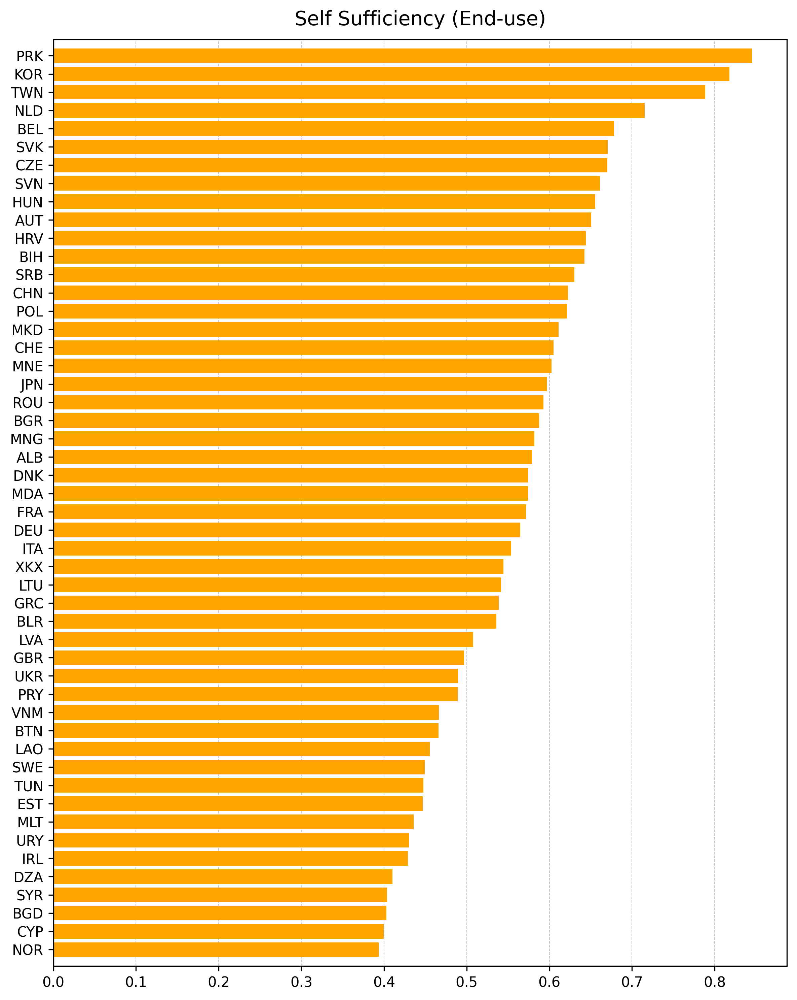

In [70]:
import matplotlib.pyplot as plt

df_sorted = df_country.sort_values('self_sufficiency', ascending=False)
df_sorted = df_sorted.head(50)	
fig, ax = plt.subplots(figsize=(8, 10), dpi=300)
ax.barh(df_sorted["ISO3"], df_sorted["self_sufficiency"], color="Orange", edgecolor='none')
ax.invert_yaxis()
ax.set_title("Self Sufficiency (End-use)", fontsize=14, pad=10)

# grid styling
ax.xaxis.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
ax.set_axisbelow(True)

# remove default margins
ax.margins(y=0.01)

fig.tight_layout()

In [136]:
import numpy as np
import xarray as xr
import pandas as pd
import importlib.resources as pkg_resources

# 1. Load your grid-cell self-sufficiency data
# (destination-level: ISO3, ratio, inflow)
df = pd.DataFrame({
    "ISO3": cell_countries,
    "ratio": ratio,
    "inflow": total_inflow,
    "dlat": dlat.values,
    "dlon": dlon.values
})
df = df[df["inflow"] > 0]

# 2. Compute per-country maximum pairwise distance between own grid cells
def haversine_1d(lat1, lon1, lat2, lon2):
    return haversine(np.array(lat1), np.array(lon1), np.array(lat2), np.array(lon2))

max_dist = {}
for iso, group in df.groupby("ISO3"):
    coords = group[["dlat","dlon"]].values
    # sample if too many
    if len(coords) > 500:
        coords = coords[np.random.choice(len(coords), 500, replace=False)]
    lats, lons = coords[:,0], coords[:,1]
    # compute pairwise haversine
    dist = haversine_1d(lats[:,None], lons[:,None], lats[None,:], lons[None,:])
    max_dist[iso] = np.nanmax(dist)

# 3. Define local radius per country (e.g., half the max internal distance)
radius_factor = 0.5
country_radius = {iso: max_dist[iso] * radius_factor for iso in max_dist}

# 4. Compute adaptive self-sufficiency per destination cell
# (reuse haversine D computed earlier)
cell_country = np.array(cell_countries)
adaptive_ratio = np.zeros_like(ratio)
for j in range(len(ratio)):
    iso = cell_country[j]
    R = country_radius.get(iso, 500.0)
    mask = D[:, j] <= R  # origins within adaptive radius
    local = flow[mask, j].sum()
    adaptive_ratio[j] = local / total_inflow[j] if total_inflow[j] > 0 else 0

# 5. Aggregate to country-level (inflow-weighted)
df["adaptive_ratio"] = adaptive_ratio
df_country = (
    df.groupby("ISO3")
      .apply(lambda g: np.average(g["adaptive_ratio"], weights=g["inflow"]))
      .reset_index(name="self_sufficiency_adaptive")
)

# 6. Compare to fixed-radius method
df_fix = (
    df.assign(fixed_ratio=df["ratio"])
      .groupby("ISO3")
      .apply(lambda g: np.average(g["fixed_ratio"], weights=g["inflow"]))
      .reset_index(name="self_sufficiency_fixed")
)

df_inflow = (
    df.groupby("ISO3")
      .agg(total_inflow=("inflow", "sum"))
      .reset_index()
)

df_compare = pd.merge(df_fix, df_country, on="ISO3")
df_compare.sort_values("self_sufficiency_adaptive", ascending=False).head(20)


/var/folders/9q/h2qmn7kd1c74_3nmyzcf2mdc0000gn/T/ipykernel_1825/4104974733.py:51: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: np.average(g["adaptive_ratio"], weights=g["inflow"]))
/var/folders/9q/h2qmn7kd1c74_3nmyzcf2mdc0000gn/T/ipykernel_1825/4104974733.py:59: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: np.average(g["fixed_ratio"], weights=g["inflow"]))


,ISO3,self_sufficiency_fixed,self_sufficiency_adaptive
29,CHN,0.216496,0.671262
135,RUS,0.044714,0.512455
26,CAN,0.119920,0.446749
83,JPN,0.095430,0.320426
56,FRA,0.229482,0.315510
166,USA,0.081575,0.305354
20,BRA,0.102419,0.248960
119,NLD,0.550286,0.195130
51,ESP,0.045229,0.191880
108,MNG,0.019880,0.190951


In [137]:
df_end = df_country.copy()
df_end = df_end.merge(df_inflow, on="ISO3", how= 'outer')
df_end = df_end.rename(columns={"self_sufficiency_adaptive": "self_sufficiency"})
df_end

,ISO3,self_sufficiency,total_inflow
0,AFG,0.003209,4.605131e+05
1,AGO,0.001407,2.943528e+05
2,ALB,0.000000,2.800998e+05
3,ARE,0.063999,6.328071e+06
4,ARG,0.133967,3.322291e+06
...,...,...,...
170,XKX,0.000000,1.817790e+05
171,YEM,0.009254,6.185178e+05
172,ZAF,0.063450,2.673505e+06
173,ZMB,0.003883,2.514837e+05


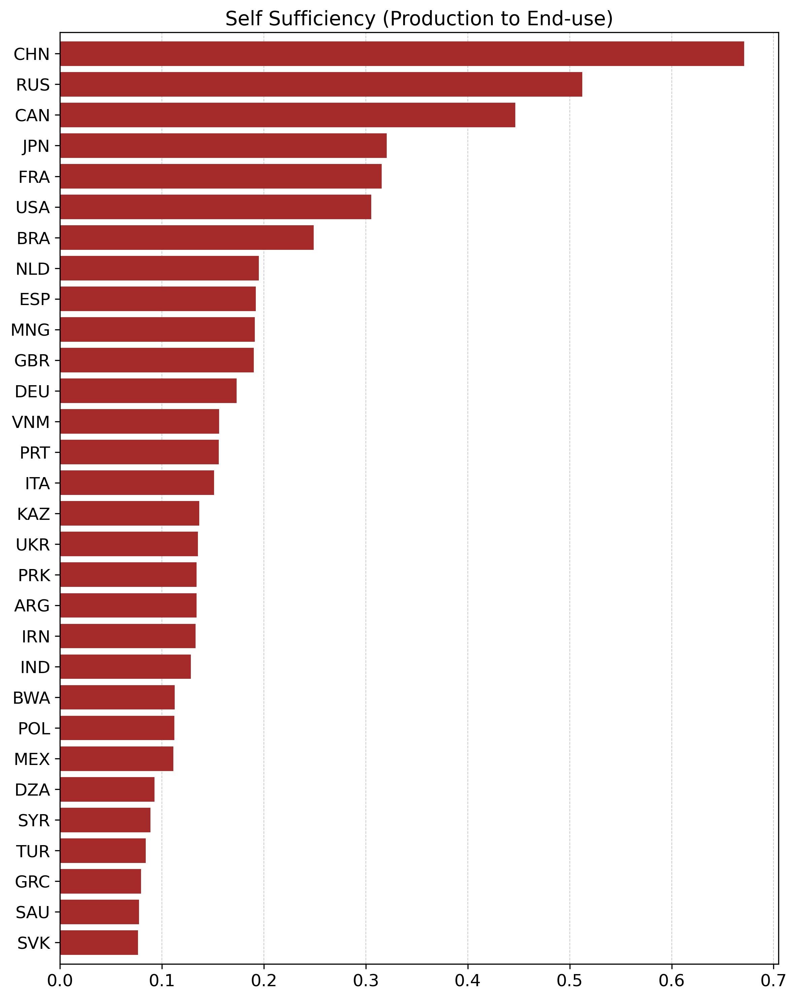

In [155]:
import matplotlib.pyplot as plt

df_sorted = df_end.sort_values('self_sufficiency', ascending=False)
df_sorted = df_sorted.head(30)	
fig, ax = plt.subplots(figsize=(8, 10), dpi=300)
ax.barh(df_sorted["ISO3"], df_sorted["self_sufficiency"], color="brown", edgecolor='none')
ax.invert_yaxis()
ax.set_title("Self Sufficiency (Production to End-use)", fontsize=14, pad=5)

# grid styling
ax.xaxis.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
ax.set_axisbelow(True)
ax.tick_params(axis='x', labelsize=12)
ax.tick_params(axis='y', labelsize=12)

# remove default margins
ax.margins(y=0.01)

fig.tight_layout()

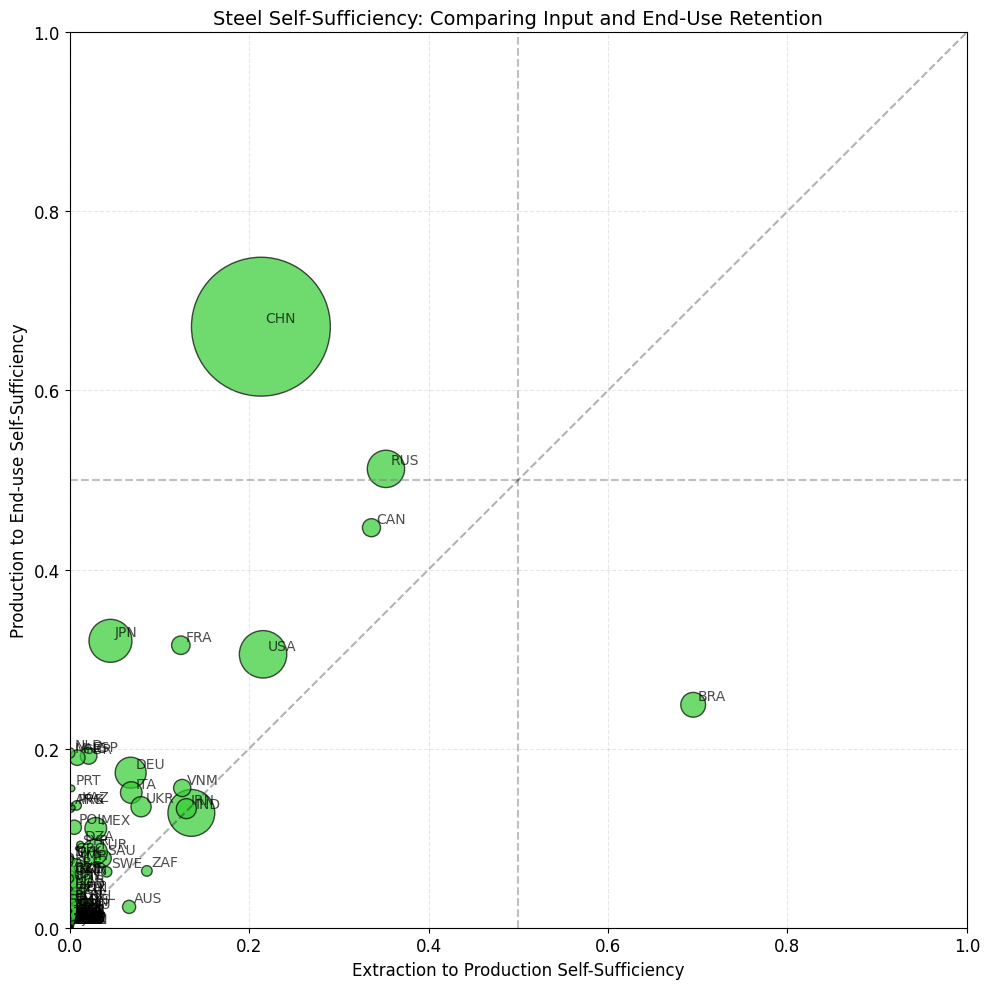

In [171]:
import matplotlib.pyplot as plt

# Merge the two datasets
df = pd.merge(df_prod, df_end, on='ISO3', suffixes=('_prod', '_end'))

# Combine inflows (or choose one if you prefer only end-use or production)
df['combined_inflow'] = df['total_inflow_prod'] + df['total_inflow_end']

# Normalize inflow to control point size
df['size'] = (df['combined_inflow'] / df['combined_inflow'].max()) * 10000  # scale factor

# Plot
fig, ax = plt.subplots(figsize=(10, 10))

# Reference lines
ax.axhline(0.5, color='gray', linestyle='--', alpha=0.5)
ax.axvline(0.5, color='gray', linestyle='--', alpha=0.5)
ax.plot([0, 1], [0, 1], 'k--', alpha=0.3)

# Scatter with size control
sc = ax.scatter(df['self_sufficiency_prod'], df['self_sufficiency_end'],
                s=df['size'], c='limegreen', alpha=0.7, edgecolors='black')

# ISO3 labels
for _, row in df.iterrows():
    ax.text(row['self_sufficiency_prod'] + 0.005, row['self_sufficiency_end'] + 0.005,
            row['ISO3'], fontsize=10, alpha=0.7)

# Aesthetics
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
ax.set_xlabel("Extraction to Production Self-Sufficiency", fontsize=12)
ax.set_ylabel("Production to End-use Self-Sufficiency", fontsize=12)
ax.set_title("Steel Self-Sufficiency: Comparing Input and End-Use Retention", fontsize=14)
ax.tick_params(axis='x', labelsize=12)
ax.tick_params(axis='y', labelsize=12)
ax.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()


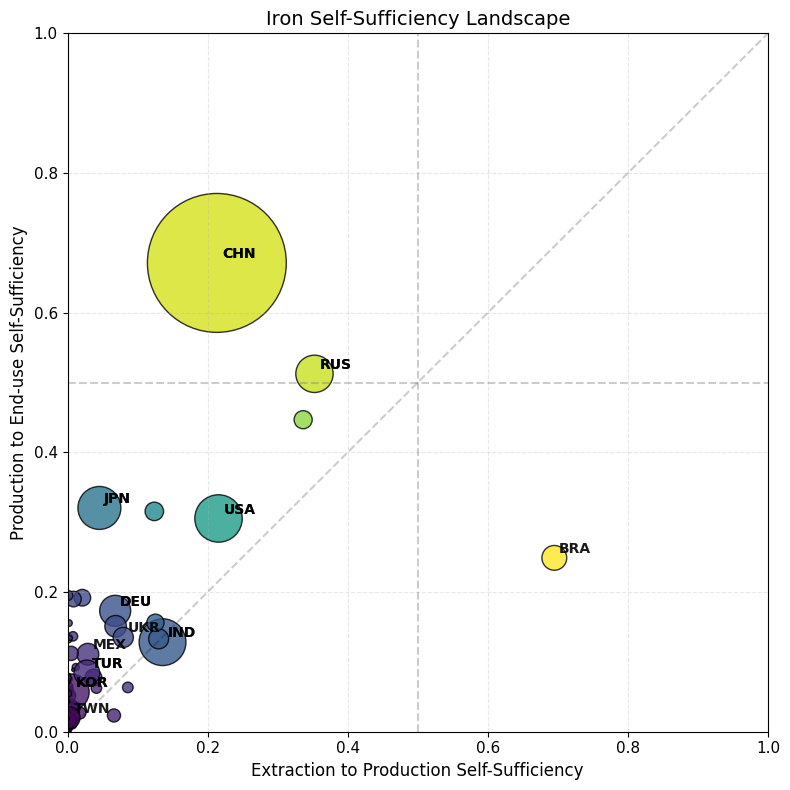

In [179]:
import matplotlib.pyplot as plt

# Merge and prep
df = pd.merge(df_prod, df_end, on='ISO3', suffixes=('_prod', '_end'))
df['combined_inflow'] = df['total_inflow_prod'] + df['total_inflow_end']
df['size'] = (df['combined_inflow'] / df['combined_inflow'].max()) * 10000
df['mean_ss'] = df[['self_sufficiency_prod', 'self_sufficiency_end']].mean(axis=1)

# Optional: Color gradient by mean self-sufficiency
cmap = plt.cm.viridis
colors = cmap(df['mean_ss'] / df['mean_ss'].max())

# Plot
fig, ax = plt.subplots(figsize=(8, 8))
ax.axhline(0.5, color='gray', linestyle='--', alpha=0.4)
ax.axvline(0.5, color='gray', linestyle='--', alpha=0.4)
ax.plot([0, 1], [0, 1], 'k--', alpha=0.2)

# Scatter with color and size
sc = ax.scatter(df['self_sufficiency_prod'], df['self_sufficiency_end'],
                s=df['size'], c=colors, alpha=0.8, edgecolors='black')

# ISO3 labels for largest flows
top_labels_1 = df.nlargest(10, 'total_inflow_prod')
top_labels_2 = df.nlargest(10, 'total_inflow_end')
top_labels = pd.concat([top_labels_1, top_labels_2])
for _, row in top_labels.iterrows():
    ax.text(row['self_sufficiency_prod'] + 0.007, row['self_sufficiency_end'] + 0.007,
            row['ISO3'], fontsize=10, weight='bold', alpha=0.9)

# Clean layout
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
ax.set_xlabel("Extraction to Production Self-Sufficiency", fontsize=12)
ax.set_ylabel("Production to End-use Self-Sufficiency", fontsize=12)
ax.set_title("Iron Self-Sufficiency Landscape", fontsize=14)
ax.tick_params(labelsize=11)
ax.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()


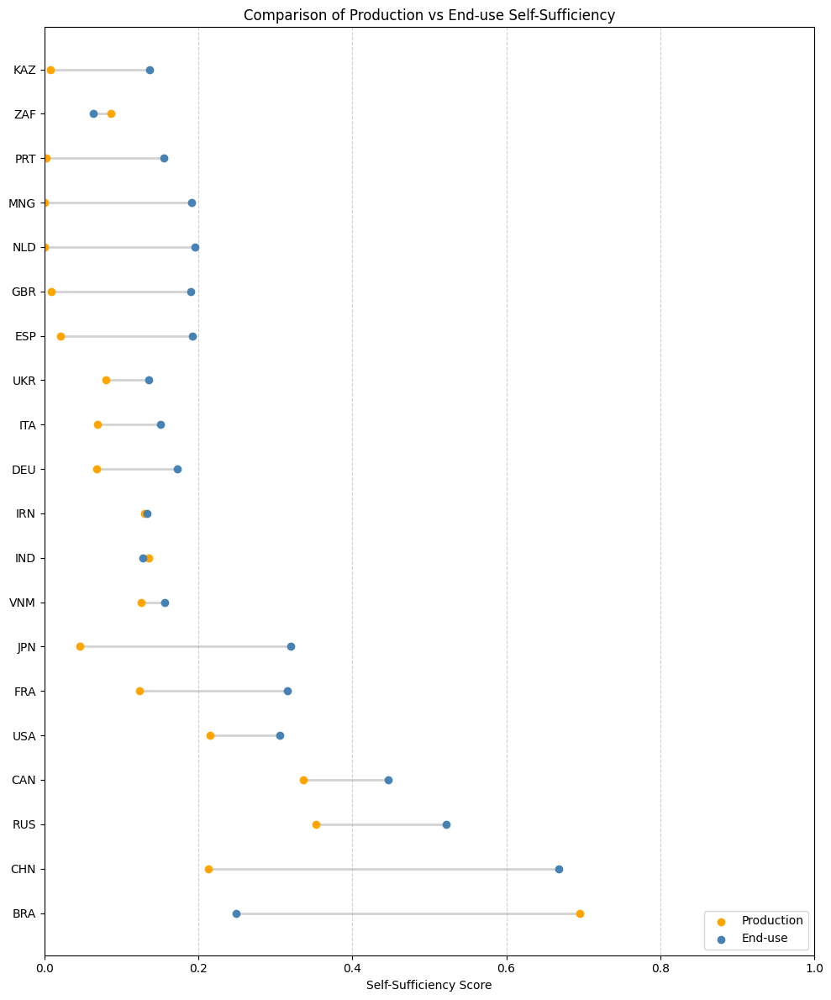

In [107]:
import matplotlib.pyplot as plt
import pandas as pd

# Merge the two datasets
df = pd.merge(df_prod, df_end, on='ISO3', suffixes=('_prod', '_end'))

# Sort by average or max for consistent layout
df['mean'] = df[['self_sufficiency_prod', 'self_sufficiency_end']].mean(axis=1)
df = df.sort_values('mean', ascending=False).head(20)  # top 30 for clarity

fig, ax = plt.subplots(figsize=(10, 12))

# Draw lines between production and end-use values
for i, row in df.iterrows():
    ax.plot([row['self_sufficiency_prod'], row['self_sufficiency_end']], [row['ISO3']] * 2,
            color='lightgray', linewidth=2, zorder=1)

# Scatter plot production (left) and end-use (right) dots
ax.scatter(df['self_sufficiency_prod'], df['ISO3'], color='orange', label='Production', zorder=2)
ax.scatter(df['self_sufficiency_end'], df['ISO3'], color='steelblue', label='End-use', zorder=3)

# Labels and aesthetics
ax.set_xlabel("Self-Sufficiency Score")
ax.set_title("Comparison of Production vs End-use Self-Sufficiency")
ax.set_xlim(0, 1)
ax.grid(True, axis='x', linestyle='--', alpha=0.6)
ax.legend(loc='lower right')
plt.tight_layout()
plt.show()


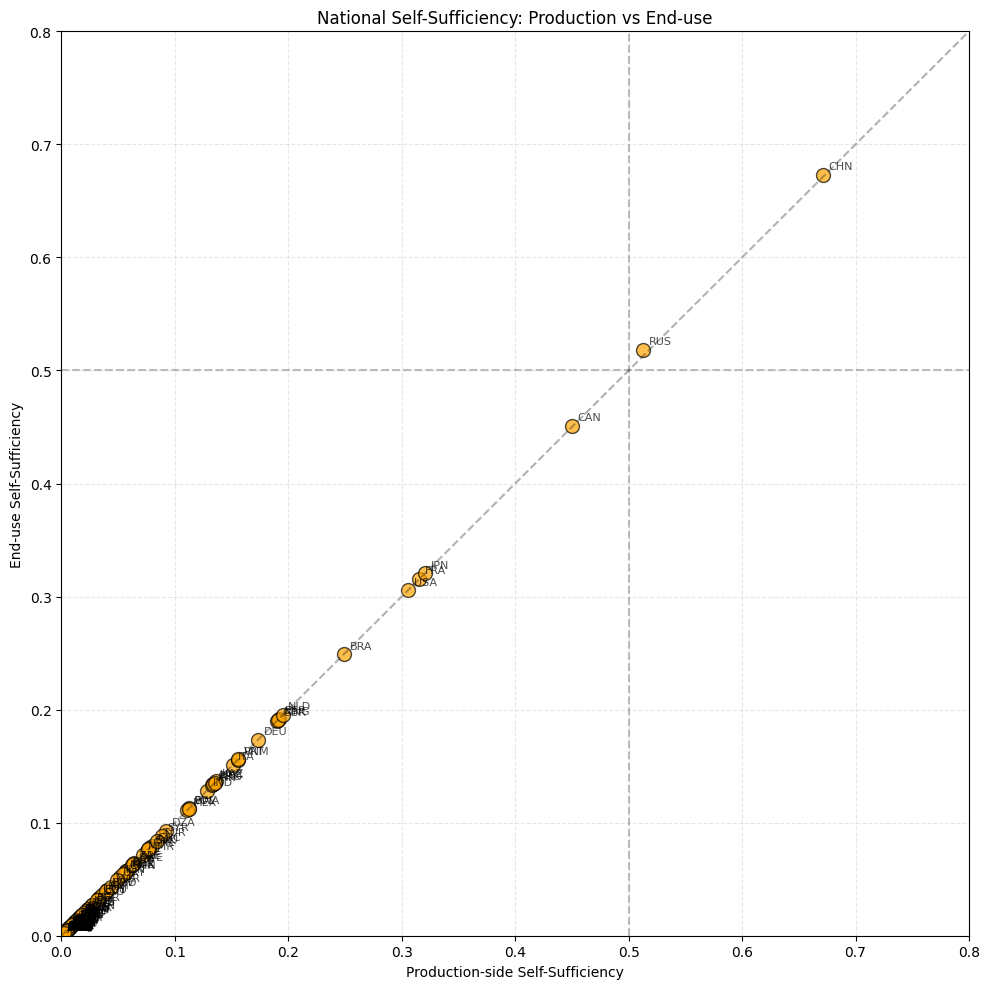

In [128]:
import matplotlib.pyplot as plt

# Merge production and end-use
df = pd.merge(df_prod, df_end, on='ISO3', suffixes=('_prod', '_end'))

fig, ax = plt.subplots(figsize=(10, 10))

# Axes and diagonal
ax.axhline(0.5, color='gray', linestyle='--', alpha=0.5)
ax.axvline(0.5, color='gray', linestyle='--', alpha=0.5)
ax.plot([0, 1], [0, 1], 'k--', alpha=0.3)  # optional: balance diagonal

# Scatter points
sc = ax.scatter(df['self_sufficiency_prod'], df['self_sufficiency_end'],
                s=100, c='orange', alpha=0.7, edgecolors='black')

# Country labels
for _, row in df.iterrows():
    ax.text(row['self_sufficiency_prod'] + 0.005, row['self_sufficiency_end'] + 0.005,
            row['ISO3'], fontsize=8, alpha=0.7)

# Aesthetics
ax.set_xlim(0, 0.8)
ax.set_ylim(0, 0.8)
ax.set_xlabel("Production-side Self-Sufficiency")
ax.set_ylabel("End-use Self-Sufficiency")
ax.set_title("National Self-Sufficiency: Production vs End-use")
ax.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()


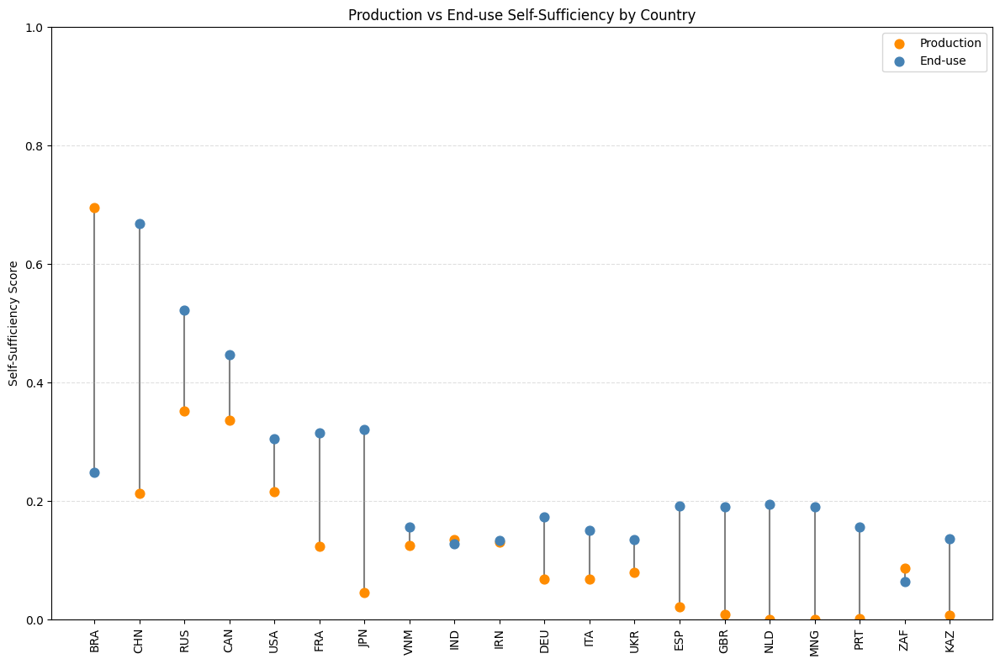

In [108]:
import matplotlib.pyplot as plt
import seaborn as sns

# Sort by mean of both scores
df['mean_score'] = df[['self_sufficiency_prod', 'self_sufficiency_end']].mean(axis=1)
df_sorted = df.sort_values('mean_score', ascending=False).head(20)  # adjust number as needed

# Set up the plot
fig, ax = plt.subplots(figsize=(12, 8))

# Plot each country as a line with two endpoints
for i, row in df_sorted.iterrows():
    x = df_sorted.index.get_loc(i)
    ax.plot([x, x],
            [row['self_sufficiency_prod'], row['self_sufficiency_end']],
            color='gray', linewidth=1.5, zorder=1)

    ax.scatter(x, row['self_sufficiency_prod'], color='darkorange', s=60, label='Production' if i == df_sorted.index[0] else "", zorder=2)
    ax.scatter(x, row['self_sufficiency_end'], color='steelblue', s=60, label='End-use' if i == df_sorted.index[0] else "", zorder=2)

# Aesthetics
ax.set_xticks(range(len(df_sorted)))
ax.set_xticklabels(df_sorted['ISO3'], rotation=90)
ax.set_ylabel("Self-Sufficiency Score")
ax.set_ylim(0, 1)
ax.set_title("Production vs End-use Self-Sufficiency by Country")
ax.legend()
ax.grid(True, axis='y', linestyle='--', alpha=0.4)

plt.tight_layout()
plt.show()


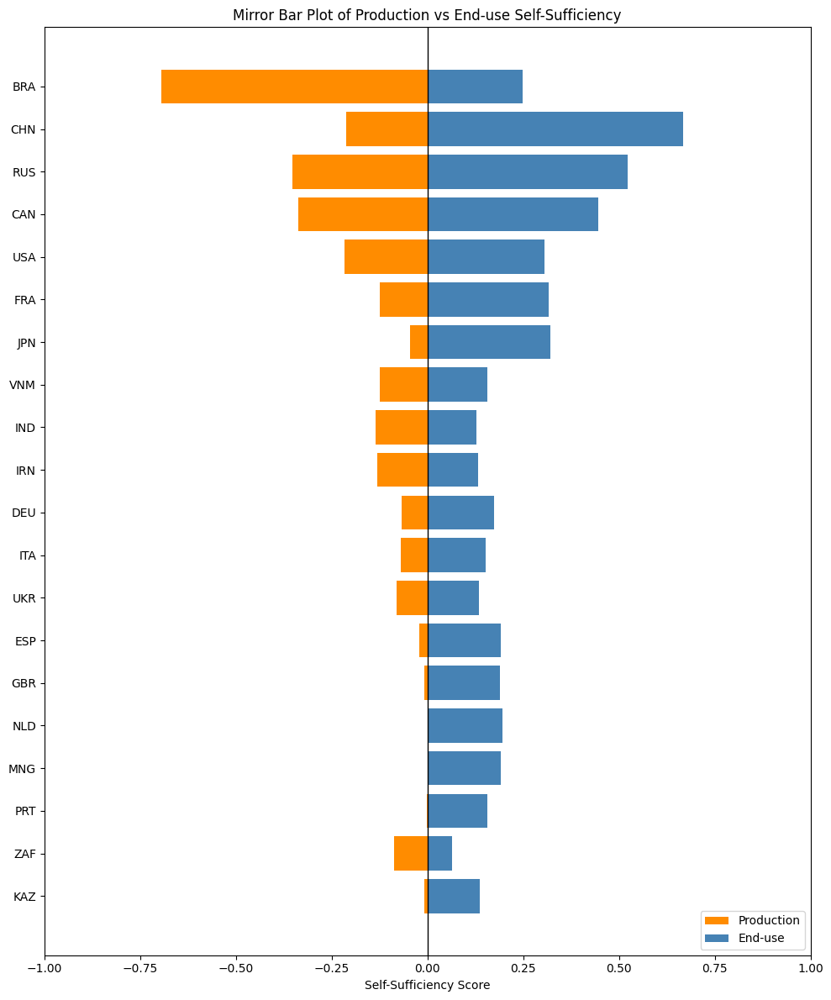

In [110]:
import matplotlib.pyplot as plt
import numpy as np

# Sort by mean and subset
df['mean'] = df[['self_sufficiency_prod', 'self_sufficiency_end']].mean(axis=1)
df_sorted = df.sort_values('mean', ascending=False).head(30)

# Plot setup
fig, ax = plt.subplots(figsize=(10, 12))
y_pos = np.arange(len(df_sorted))

# Plot mirrored bars
ax.barh(y_pos, -df_sorted['self_sufficiency_prod'], color='darkorange', label='Production')
ax.barh(y_pos, df_sorted['self_sufficiency_end'], color='steelblue', label='End-use')

# ISO3 labels
ax.set_yticks(y_pos)
ax.set_yticklabels(df_sorted['ISO3'])
ax.invert_yaxis()

# Aesthetics
ax.axvline(0, color='black', linewidth=1)
ax.set_xlabel("Self-Sufficiency Score")
ax.set_title("Mirror Bar Plot of Production vs End-use Self-Sufficiency")
ax.legend(loc='lower right')
ax.set_xlim(-1, 1)
plt.tight_layout()
plt.show()



# Mass displacement

In [196]:
import numpy as np
import xarray as xr

# Load dataset
ds = xr.load_dataset("gravity_model_output_s1.nc")
flow = ds["flow"].values  # (origin, destination)

olat = ds["origin_lat"].values
olon = ds["origin_lon"].values
dlat = ds["destination_lat"].values
dlon = ds["destination_lon"].values

# Haversine function
def haversine(lat1, lon1, lat2, lon2):
    R = 6371.0
    lat1, lat2 = np.radians(lat1), np.radians(lat2)
    dlat = np.radians(lat2 - lat1)
    dlon = np.radians(lon2 - lon1)
    a = np.sin(dlat / 2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2)**2
    return 2 * R * np.arctan2(np.sqrt(a), np.sqrt(1 - a))

# Compute pairwise distances (origin x destination)
O, I = flow.shape
lat1 = np.repeat(olat[:, None], I, axis=1)
lon1 = np.repeat(olon[:, None], I, axis=1)
lat2 = np.repeat(dlat[None, :], O, axis=0)
lon2 = np.repeat(dlon[None, :], O, axis=0)
D = haversine(lat1, lon1, lat2, lon2)  # (O, I)

# Mass displacement per origin cell
mass_disp = (flow * D).sum(axis=1)  # (origin,)

# Build xarray DataArray using 1D lat/lon indexing
da_md = xr.DataArray(
    data=mass_disp,
    coords={"origin": np.arange(O), "lat": ("origin", olat), "lon": ("origin", olon)},
    dims=["origin"],
    name="mass_displacement"
)
da_md = da_md.set_index(origin=["lat", "lon"]).unstack()
ds_md = da_md.to_dataset()
# Done
ds_md


<xarray.Dataset> Size: 362kB
Dimensions:            (lat: 135, lon: 332)
Coordinates:
  * lat                (lat) float64 1kB -55.5 -54.5 -53.5 ... 78.5 79.5 80.5
  * lon                (lon) float64 3kB -179.5 -176.5 -175.5 ... 178.5 179.5
Data variables:
    mass_displacement  (lat, lon) float64 359kB nan nan nan nan ... nan nan nan

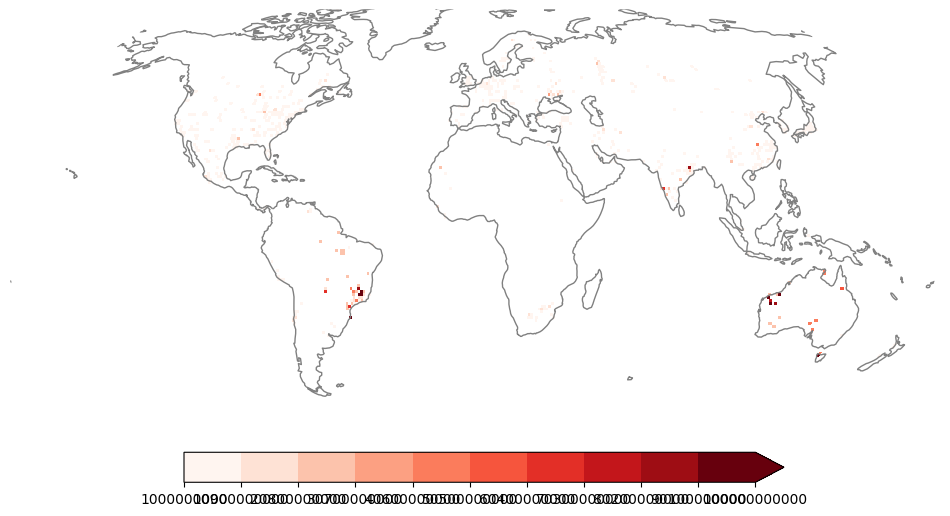

<GeoAxes: >

In [230]:
ssm.plot_map(ds_md, "mass_displacement", color="Reds", vmin=1e9, vmax=1e11, extend_max=True, out_bound=False)

In [234]:
df_md = ssm.grid_2_table(ds_md, aggregation="region_2", verbose=True)
df_md

List of variables to process: ['mass_displacement']
Global gridded stats for mass_displacement: 6727018562909.24
Global tabular stats for mass_displacement: 6727018562909.24


,region_2,mass_displacement
0,Australia and New Zealand,1.084069e+12
1,Caribbean,2.852887e+09
2,Central America,1.595739e+11
3,Central Asia,3.953115e+10
4,Eastern Africa,4.134257e+09
5,Eastern Asia,5.949665e+11
6,Eastern Europe,4.719130e+11
7,Melanesia,1.025161e+09
8,Micronesia,0.000000e+00
9,Middle Africa,9.037799e+08


In [235]:
df_md.sort_values("mass_displacement", ascending=False)

,region_2,mass_displacement
14,South America,2.252272e+12
0,Australia and New Zealand,1.084069e+12
11,Northern America,8.735947e+11
5,Eastern Asia,5.949665e+11
17,Southern Asia,5.653542e+11
6,Eastern Europe,4.719130e+11
2,Central America,1.595739e+11
21,Western Europe,1.250871e+11
16,Southern Africa,1.194495e+11
12,Northern Europe,1.185251e+11


In [238]:
region_mapping = {
    'Australia and New Zealand': 'Oceania',
    'Caribbean': 'Latin America and Caribbean',
    'Central America': 'Latin America and Caribbean',
    'Central Asia': 'Rest of Asia',
    'Eastern Africa': 'Africa',
    'Eastern Asia': 'Eastern Asia',
    'Eastern Europe': 'Europe',
    'Melanesia': 'Oceania',
    'Micronesia': 'Oceania',
    'Middle Africa': 'Africa',
    'Northern Africa': 'Africa',
    'Northern America': 'Northern America',
    'Northern Europe': 'Europe',
    'Polynesia': 'Oceania',
    'South America': 'Latin America and Caribbean',
    'South-eastern Asia': 'Rest of Asia',
    'Southern Africa': 'Africa',
    'Southern Asia': 'Rest of Asia',
    'Southern Europe': 'Europe',
    'Western Africa': 'Africa',
    'Western Asia': 'Rest of Asia',
    'Western Europe': 'Europe'
}

df_region = pd.read_csv("/Users/faisal/Documents/GitHub/SESAME/src/sesame/data/un_geoscheme.csv")
# Assuming df_ex_prod is your DataFrame
df_region['Aggregate_Region'] = df_region['region_2'].map(region_mapping)
df_region = df_region.rename(columns={"ISO-alpha3 code":"ISO3"})
df_region

,Aggregate_Region,region_2,mass_displacement
0,Africa,Eastern AfricaMiddle AfricaNorthern AfricaSout...,1.926161e+11
1,Eastern Asia,Eastern Asia,5.949665e+11
2,Europe,Eastern EuropeNorthern EuropeSouthern EuropeWe...,8.236096e+11
3,Latin America and Caribbean,CaribbeanCentral AmericaSouth America,2.414699e+12
4,Northern America,Northern America,8.735947e+11
5,Oceania,Australia and New ZealandMelanesiaMicronesiaPo...,1.085094e+12
6,Rest of Asia,Central AsiaSouth-eastern AsiaSouthern AsiaWes...,7.424385e+11


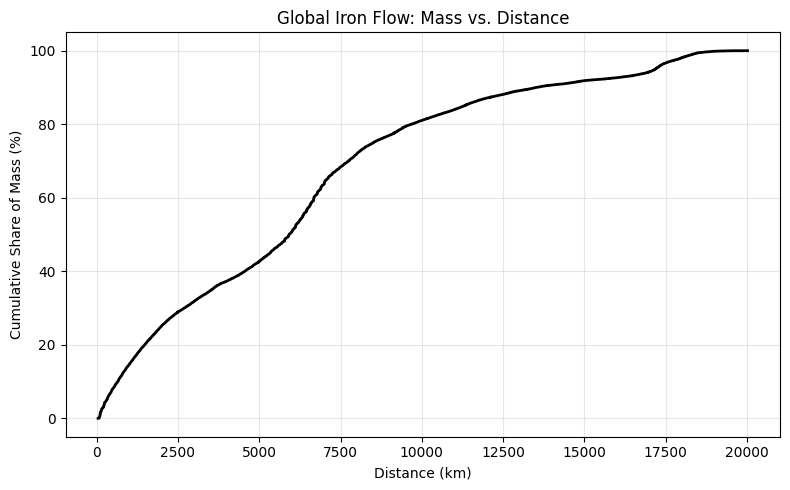

In [ ]:
# Create the full flow-level DataFrame again
cdf_df = pd.DataFrame({
    "distance_km": distances,
    "flow_mass": flow_vals
})

# Sort by distance
cdf_df = cdf_df.sort_values("distance_km").reset_index(drop=True)

# Calculate cumulative sum of mass
cdf_df["cum_mass"] = cdf_df["flow_mass"].cumsum()

# Normalize to percent of total mass
total_mass = cdf_df["flow_mass"].sum()
cdf_df["mass_percent"] = 100 * cdf_df["cum_mass"] / total_mass

# Plot
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
plt.plot(cdf_df["distance_km"], cdf_df["mass_percent"], color='black', linewidth=2)
plt.xlabel("Distance (km)")
plt.ylabel("Cumulative Share of Mass (%)")
plt.title("Global Iron Flow: Mass vs. Distance")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [ ]:
# 1. Create unique origin cell points
unique_origin_ids, inverse_idx = np.unique(origin_ids, return_inverse=True)
unique_origin_points = gpd.GeoDataFrame(
    geometry=[Point(origin_lon[i], origin_lat[i]) for i in unique_origin_ids],
    crs="EPSG:4326"
)

# 2. Buffer countries to avoid missing edge cases
df_country_buffered = df_country.copy()
df_country_buffered["geometry"] = df_country_buffered["geometry"].buffer(0.7)

# 3. Spatial join origin points to region polygons
unique_with_region = gpd.sjoin(
    unique_origin_points,
    df_country_buffered[["Aggregate_Region", "geometry"]],
    how="left",
    predicate="within"
)

# 4. Map region back to original flow_df based on origin_id
region_array = unique_with_region["Aggregate_Region"].values
flow_df["region"] = region_array[inverse_idx]  # Now region = region of origin
flow_df

,dest_id,flow_mass,distance_km,mass_displacement,region
0,0,5.998764e-10,9124.526290,5.473588e-06,Latin America and Caribbean
1,1,7.005316e-10,7939.548765,5.561905e-06,Latin America and Caribbean
2,2,4.665022e-10,2118.124574,9.881099e-07,Latin America and Caribbean
3,3,1.992944e-09,2539.294341,5.060672e-06,Latin America and Caribbean
4,4,1.279928e-10,2603.239365,3.331960e-07,Latin America and Caribbean
...,...,...,...,...,...
7965047,563,7.825328e-16,2818.372911,2.205469e-12,Northern America
7965048,564,6.106553e-15,2580.172951,1.575596e-11,Northern America
7965049,565,5.418980e-15,2514.478694,1.362591e-11,Northern America
7965050,566,1.854730e-15,2477.787310,4.595625e-12,Northern America


In [ ]:
flow_df["region"].unique()

array(['Latin America and Caribbean', 'Oceania', 'Africa', 'Rest of Asia',
       'Northern America', 'Eastern Asia', 'Europe'], dtype=object)

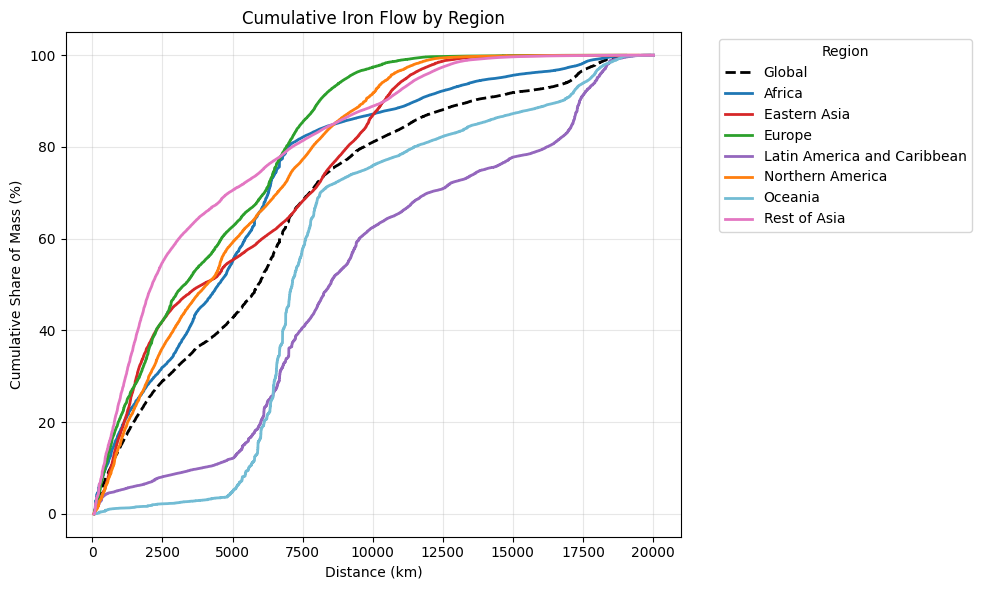

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))

# Optional: custom color palette
region_colors = {
    "Africa": "#1f77b4",                      # blue
    "Eastern Asia": "#d62728",                # red
    "Europe": "#2ca02c",                      # green
    "Latin America and Caribbean": "#9467bd", # purple
    "Northern America": "#ff7f0e",            # orange
    "Oceania": "#72bcd4",                     # lightblue
    "Rest of Asia": "#e377c2",                # pink
}

# 3. Group and plot
# Global curve (no filtering)
global_sorted = flow_df.sort_values("distance_km")
cum_mass = global_sorted["flow_mass"].cumsum()
mass_percent = 100 * cum_mass / global_sorted["flow_mass"].sum()

plt.plot(
    global_sorted["distance_km"],
    mass_percent,
    label="Global",
    color="black",
    linewidth=2,
    linestyle='--'
)

for region, group in flow_df.groupby("region"):
    if group.empty or pd.isnull(region):
        continue
    group_sorted = group.sort_values("distance_km")
    cum_mass = group_sorted["flow_mass"].cumsum()
    mass_percent = 100 * cum_mass / group_sorted["flow_mass"].sum()
    plt.plot(
        group_sorted["distance_km"], mass_percent,
        label=region,
        color=region_colors.get(region, None), linewidth=2
    )

plt.xlabel("Distance (km)")
plt.ylabel("Cumulative Share of Mass (%)")
plt.title("Cumulative Iron Flow by Region")
plt.legend(title="Region", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


# Stage 3 / Extraction to End-use

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Running Gravity Model with thresholding at 90% of possible edges...
done!
[POWER] Mean adjusted distance: 37788.59
Edges after gravity calculation: 197317926
After thresholding there are 195278668 edges containing 100.0% of total flow mass
Number of nodes after thresholding: 28095
Percent of inflow contained in remaining nodes: 100.0%
Percent of outflow contained in remaining nodes: 100.0%
Gravity Model Complete. Ensemble Generated.
Running IPF...
Initial edges in ensemble: 195278668
IPF converged in 22 iterations
IPF complete. Flow matrix generated with 195278668 edges.


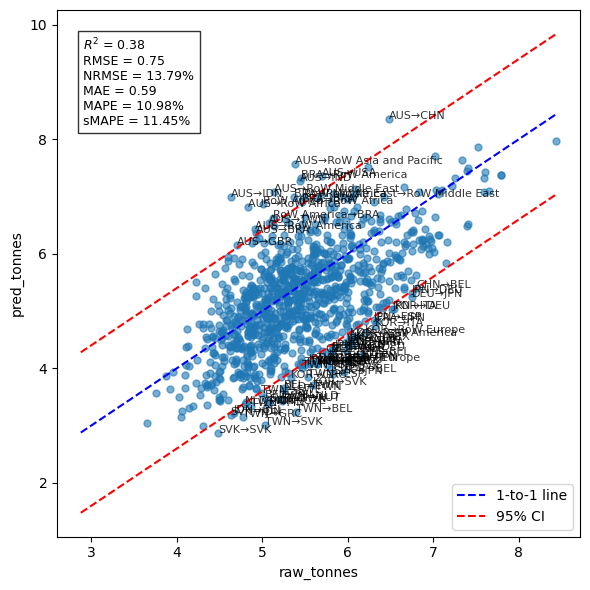

,exporter,importer,raw_tonnes,year,yearly_share,total_source_1,exp_ISO3,imp_ISO3,pred_tonnes,ISO3
0,Australia,Australia,3.959848e+04,2016,0.000025,1.585433e+09,AUS,AUS,8.651313e+05,AUS→AUS
1,Austria,Australia,6.540256e+04,2016,0.000041,1.585433e+09,AUT,AUS,8.595752e+03,AUT→AUS
2,Belgium,Australia,5.962830e+04,2016,0.000038,1.585433e+09,BEL,AUS,4.691777e+03,BEL→AUS
3,Brazil,Australia,1.375563e+05,2016,0.000087,1.585433e+09,BRA,AUS,3.059049e+06,BRA→AUS
4,Canada,Australia,9.715082e+04,2016,0.000061,1.585433e+09,CAN,AUS,1.346726e+05,CAN→AUS
...,...,...,...,...,...,...,...,...,...,...
1019,Spain,United States,1.157551e+06,2016,0.000730,1.585433e+09,ESP,USA,3.628316e+05,ESP→USA
1020,Sweden,United States,3.841868e+05,2016,0.000242,1.585433e+09,SWE,USA,8.015257e+05,SWE→USA
1021,Taiwan,United States,1.720284e+06,2016,0.001085,1.585433e+09,TWN,USA,9.419486e+04,TWN→USA
1022,United Kingdom,United States,7.595541e+05,2016,0.000479,1.585433e+09,GBR,USA,3.907332e+05,GBR→USA


In [98]:
%load_ext autoreload
%autoreload 2

from FlowNetwork import FlowNetwork
import os
import pandas as pd

verbose = True

# Initialize the flow network with NetCDF data and variable names
grid_data_path = os.path.join('data', 'L.T.iron_flows.2000-2016_v3.a.nc')
trade_csv_path = os.path.join('data', 'iron_raw_import_export.csv')
json_path = os.path.join('data', 'grouped_region.json')
bilateral_csv_path = os.path.join('data', 'iron_io_stage_2_v3.csv')
trade_tariff_path = os.path.join('data', 'tariffsPairs_88_21_vbeta1-2024-12.csv')

fn = FlowNetwork(grid_data_path, 'source_1', 'sink_2', time='2016')
# fn.gravity_model(distance='tariff', threshold_percentile=20, trade_tariff_path=trade_tariff_path, year=2016, tariff_weight_factor=2, verbose=True)
fn.gravity_model(distance='tariff', threshold_percentile=90, trade_tariff_path=trade_tariff_path, mode="power", alpha=5, year=2016, tariff_weight_factor=1, verbose=True)
fn.ipf_flows(max_iters=100, tol=1e-6, verbose=verbose)
df = fn.bilateral_flow(2016, json_path)
fn.validate_bilateral(bilateral_csv_path, year=2016, x_log=True, y_log=True, rm_outliers=False)
# fn.save_to_netcdf(filename="gravity_model_output_3.nc")

In [93]:
df_grid = df.copy()
# Group by 'grouped_region' and 'year', and take mean of 'grade'
df_grid_imp = (
    df_grid
    .groupby(['imp_ISO3', 'year'], as_index=False)['tonnes']
    .sum()
)
df_grid_imp = df_grid_imp.rename(columns={"tonnes" : "pred_imports", "imp_ISO3":"ISO3"})
df_grid_exp = (
    df_grid
    .groupby(['exp_ISO3', 'year'], as_index=False)['tonnes']
    .sum()
)
df_grid_exp = df_grid_exp.rename(columns={"tonnes" : "pred_exports", "exp_ISO3":"ISO3"})
df_grid = df_grid_exp.merge(df_grid_imp, on=["ISO3", "year"])
df_grid

,ISO3,year,pred_exports,pred_imports
0,AUS,2016,3.837583e+08,1.174966e+07
1,AUT,2016,3.824458e+06,4.672351e+06
2,BEL,2016,2.449747e+06,3.327890e+06
3,BRA,2016,2.008348e+08,2.075648e+07
4,CAN,2016,2.780883e+07,2.022726e+07
5,CHN,2016,3.022366e+08,6.372910e+08
6,CZE,2016,2.777329e+06,4.109297e+06
7,DEU,2016,2.188133e+07,3.286139e+07
8,ESP,2016,7.348903e+06,1.022679e+07
9,FIN,2016,1.536500e+06,2.909770e+06


In [94]:
df_delta = pd.read_csv('data/iron_io_stage_2_v3.csv')
# Group by 'grouped_region' and 'year', and take mean of 'grade'
df_grid_imp = (
    df_delta
    .groupby(['imp_ISO3', 'year'], as_index=False)['tonnes']
    .sum()
)
df_grid_imp = df_grid_imp.rename(columns={"tonnes" : "imports", "imp_ISO3":"ISO3"})
df_grid_exp = (
    df_delta
    .groupby(['exp_ISO3', 'year'], as_index=False)['tonnes']
    .sum()
)
df_grid_exp = df_grid_exp.rename(columns={"tonnes" : "exports", "exp_ISO3": "ISO3"})
df_delta = df_grid_exp.merge(df_grid_imp, on=["ISO3", "year"])
df_delta

,ISO3,year,exports,imports
0,AUS,2008,8.887496e+06,8.694971e+06
1,AUS,2009,6.800175e+06,7.120452e+06
2,AUS,2010,8.056549e+06,8.289156e+06
3,AUS,2011,8.188288e+06,8.533978e+06
4,AUS,2012,7.151797e+06,8.020831e+06
...,...,...,...,...
283,USA,2012,9.163261e+07,9.681763e+07
284,USA,2013,9.623425e+07,1.016688e+08
285,USA,2014,9.649540e+07,1.021158e+08
286,USA,2015,9.028777e+07,9.657108e+07


In [95]:
df_merged = df_grid.merge(df_delta, on=["ISO3", "year"])

df_merged["delta"] = (df_merged["pred_exports"] + df_merged["imports"]) - (df_merged["pred_imports"] + df_merged["exports"])

df_merged["adjusted_exports"] = df_merged["pred_exports"]
df_merged["adjusted_imports"] = df_merged["pred_imports"]

mask_neg = df_merged["delta"] < 0
df_merged.loc[mask_neg, "adjusted_imports"] = df_merged.loc[mask_neg, "pred_imports"] + df_merged.loc[mask_neg, "delta"]

mask_neg = df_merged["delta"] > 0
df_merged.loc[mask_neg, "adjusted_exports"] = df_merged.loc[mask_neg, "pred_exports"] - df_merged.loc[mask_neg, "delta"]

df_merged["delta_n"] = (df_merged["adjusted_exports"] + df_merged["imports"]) - (df_merged["adjusted_imports"] + df_merged["exports"])
df_merged

,ISO3,year,pred_exports,pred_imports,exports,imports,delta,adjusted_exports,adjusted_imports,delta_n
0,AUS,2016,3.837583e+08,1.174966e+07,7.348874e+06,8.542903e+06,3.732027e+08,1.055563e+07,1.174966e+07,1.862645e-08
1,AUT,2016,3.824458e+06,4.672351e+06,1.213772e+07,1.045740e+07,-2.528214e+06,3.824458e+06,2.144137e+06,0.000000e+00
2,BEL,2016,2.449747e+06,3.327890e+06,1.106610e+07,1.531743e+07,3.373185e+06,-9.234379e+05,3.327890e+06,0.000000e+00
3,BRA,2016,2.008348e+08,2.075648e+07,2.552835e+07,1.806988e+07,1.726199e+08,2.821494e+07,2.075648e+07,7.450581e-09
4,CAN,2016,2.780883e+07,2.022726e+07,1.802971e+07,1.799445e+07,7.546310e+06,2.026252e+07,2.022726e+07,-7.450581e-09
5,CHN,2016,3.022366e+08,6.372910e+08,6.640548e+08,6.581865e+08,-3.409226e+08,3.022366e+08,2.963684e+08,0.000000e+00
6,CZE,2016,2.777329e+06,4.109297e+06,5.950413e+06,7.277153e+06,-5.227286e+03,2.777329e+06,4.104070e+06,0.000000e+00
7,DEU,2016,2.188133e+07,3.286139e+07,6.086586e+07,5.930680e+07,-1.253912e+07,2.188133e+07,2.032227e+07,0.000000e+00
8,ESP,2016,7.348903e+06,1.022679e+07,1.720786e+07,2.109949e+07,1.013744e+06,6.335159e+06,1.022679e+07,0.000000e+00
9,FIN,2016,1.536500e+06,2.909770e+06,5.364181e+06,4.597038e+06,-2.140414e+06,1.536500e+06,7.693562e+05,0.000000e+00


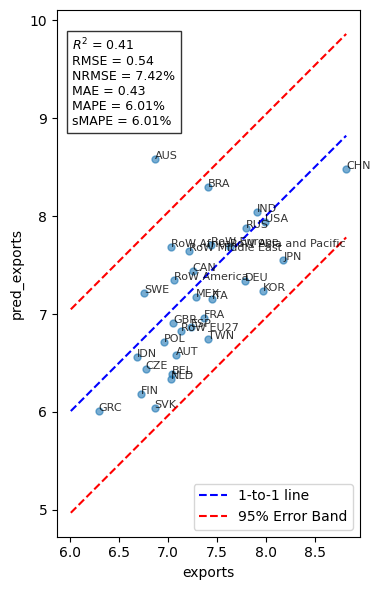

In [96]:
_limplot(
    df_merged,
    x_col='exports',
    y_col='pred_exports',
    x_log=True,
    y_log=True,
    show_delta=False,
    rm_outliers=False
)

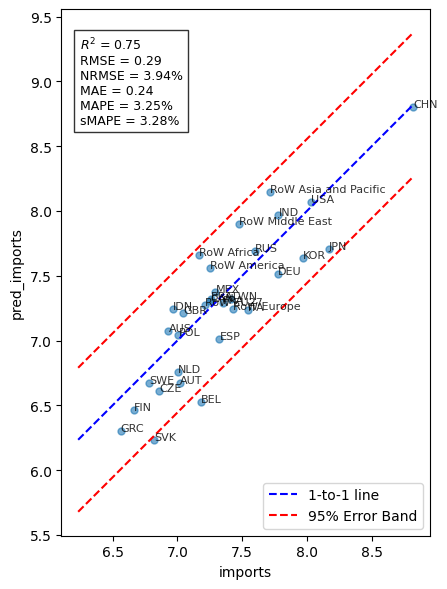

In [97]:
_limplot(
    df_merged,
    x_col='imports',
    y_col='pred_imports',
    x_log=True,
    y_log=True,
    show_delta=False,
    rm_outliers=False
)

In [ ]:
import xarray as xr

# Load flow matrix dataset
ds_flow = xr.load_dataset("gravity_model_output_2.nc")
flow = np.log10(ds_flow["flow"].values)
origin_coords = list(zip(ds_flow["origin_lat"].values, ds_flow["origin_lon"].values))
destination_coords = list(zip(ds_flow["destination_lat"].values, ds_flow["destination_lon"].values))

# Load background dataset with outflow/inflow data
ds_grid = gridded_inflow_outflow(ds_flow)
ds_grid["netflow"] = ds_grid["outflow"] - ds_grid["inflow"]
grid_ds = xr.open_dataset("/Users/faisal/Documents/GitHub/SESAME/src/sesame/data/G.land_sea_mask.1deg.nc")
ds_grid["netflow"] = (ds_grid["netflow"] * 1e6) / grid_ds["grid_area"]

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.cm as cm
import cartopy.crs as ccrs
import sesame as ssm

def plot_flow_network_with_percentage(
    flow, origin_coords, destination_coords,
    ds_bg,
    num_edges=1000,
    vmin=None, vmax=None,
    extend_max=False, extend_min=False,
    title="Flow Network",
    label=None,
    color='coolwarm',
    levels=10,
    edge_thickness=1.5,
    edge_alpha=0.5,
    edge_cmap="plasma"
):
    # Clean flow
    flow_clean = np.where(np.isfinite(flow), flow, 0)

    # Plot SESAME background (e.g., netflow)
    ax = ssm.plot_map(
        variable="netflow",
        dataset=ds_bg,
        vmin=vmin, vmax=vmax,
        extend_max=extend_max, extend_min=extend_min,
        color=color,
        levels=levels,
        title=title,
        label=label,
        show=False,
        out_bound=False,
        remove_ata=True
    )

    # Compute top N edge indices
    flat_indices = np.argpartition(flow_clean.ravel(), -num_edges)[-num_edges:]
    top_indices = flat_indices[np.argsort(flow_clean.ravel()[flat_indices])][::-1]
    out_idxs, in_idxs = np.unravel_index(top_indices, flow.shape)

    # Extract flow values and normalize for edge styling
    flow_vals = flow_clean[out_idxs, in_idxs]
    norm = mcolors.Normalize(vmin=flow_vals.min(), vmax=flow_vals.max())
    cmap = cm.get_cmap(edge_cmap)

    min_width, max_width = 0.1, 5

    for out_i, in_j, val in zip(out_idxs, in_idxs, flow_vals):
        if val > 0:
            lat1, lon1 = origin_coords[out_i]
            lat2, lon2 = destination_coords[in_j]
            color = cmap(norm(val))
            width = min_width + (max_width - min_width) * norm(val)
            ax.plot(
                [lon1, lon2], [lat1, lat2],
                color=color,
                linewidth=width,
                alpha=edge_alpha,
                transform=ccrs.Geodetic()
            )

    # Colorbar for edges
    sm = cm.ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])
    fig = plt.gcf()
    cbar = fig.colorbar(sm, ax=ax, orientation='vertical', shrink=0.6, pad=0.01, aspect=30)
    cbar.set_label("Flow Magnitude log10(tonnes Fe)", fontsize=9)
    cbar.ax.tick_params(labelsize=8)

    # Calculate share of flow visualized (using absolute values)
    flat_flow = np.abs(flow.ravel())
    sorted_flow = np.sort(flat_flow)[::-1]  # Descending
    top_1200_sum = sorted_flow[:1200].sum()
    total_sum = sorted_flow.sum()
    percent = (top_1200_sum / total_sum) * 100

    print(f"Top 1200 edges represent: {percent:.2f}% of total flow magnitude")


    plt.show()


/var/folders/9q/h2qmn7kd1c74_3nmyzcf2mdc0000gn/T/ipykernel_10039/1909065413.py:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(edge_cmap)


Top 1200 edges represent: nan% of total flow magnitude


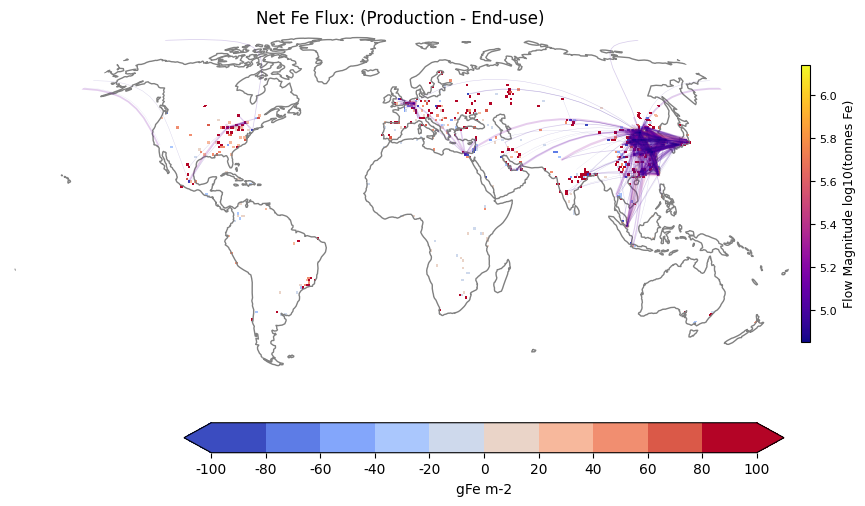

In [ ]:
plot_flow_network_with_percentage(
    ds_bg=ds_grid,
    flow=np.log10(flow),
    origin_coords=origin_coords,
    destination_coords=destination_coords,
    num_edges=1200,
    vmin=-100, vmax=100,
    title="Net Fe Flux: (Production - End-use)",
    label="gFe m-2",
    extend_min=True,
    extend_max=True,
    edge_alpha=0.2, edge_thickness=1
)


In [ ]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import numpy as np
import xarray as xr

# Load corrected NetCDF file
ds = xr.load_dataset("gravity_model_output_2.nc")

flow = ds['flow'].values  # shape (origin, destination)
origin_lat = ds['origin_lat'].values
origin_lon = ds['origin_lon'].values
destination_lat = ds['destination_lat'].values
destination_lon = ds['destination_lon'].values

# Get non-zero flows
origin_ids, dest_ids = np.nonzero(flow)
flow_vals = flow[origin_ids, dest_ids]

# Filter by flow threshold
flow_threshold = 100
valid_mask = flow_vals >= flow_threshold
origin_ids = origin_ids[valid_mask]
dest_ids = dest_ids[valid_mask]
flow_vals = flow_vals[valid_mask]

# Get coordinates of valid flows
lat1 = origin_lat[origin_ids]
lon1 = origin_lon[origin_ids]
lat2 = destination_lat[dest_ids]
lon2 = destination_lon[dest_ids]

# Vectorized Haversine
def haversine_vectorized(lat1, lon1, lat2, lon2):
    R = 6371.0
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat / 2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2.0)**2
    a = np.clip(a, 0, 1)
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
    return R * c

# Compute edge-level distances and mass displacement
distances = haversine_vectorized(lat1, lon1, lat2, lon2)
mass_disp = flow_vals * distances

# Aggregate to origin node
flow_df = pd.DataFrame({
    'origin_id': origin_ids,
    'mass_disp': mass_disp
})
node_disp = flow_df.groupby('origin_id')['mass_disp'].sum().reset_index()

# Build GeoDataFrame of origin nodes
geometry = [Point(origin_lon[i], origin_lat[i]) for i in node_disp['origin_id']]
gdf = gpd.GeoDataFrame(node_disp, geometry=geometry, crs="EPSG:4326")

# Select top 20% of nodes by mass displacement
threshold = gdf['mass_disp'].quantile(0.20)
gdf_top20 = gdf[gdf['mass_disp'] >= threshold]
gdf_top20["km_mt"] = gdf_top20["mass_disp"] * 1e-6
gdf_top20["log_km_mt"] = np.log10(gdf_top20["km_mt"])
gdf_top20

/Users/faisal/miniconda3/envs/sesame/lib/python3.13/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/Users/faisal/miniconda3/envs/sesame/lib/python3.13/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,origin_id,mass_disp,geometry,km_mt,log_km_mt
0,0,2.322677e+09,POINT (144.5 -37.5),2322.676640,3.365989
1,1,4.376428e+09,POINT (174.5 -37.5),4376.427842,3.641120
2,2,6.109160e+09,POINT (-73.5 -36.5),6109.160023,3.785982
3,3,3.787365e+09,POINT (-58.5 -34.5),3787.365176,3.578337
5,5,2.789022e+10,POINT (150.5 -34.5),27890.220738,4.445452
...,...,...,...,...,...
550,563,1.077435e+09,POINT (28.5 61.5),1077.434552,3.032391
551,564,1.242782e+10,POINT (24.5 64.5),12427.819690,4.094395
552,565,9.839173e+09,POINT (22.5 65.5),9839.172658,3.992959
553,566,3.201204e+09,POINT (24.5 65.5),3201.204135,3.505313


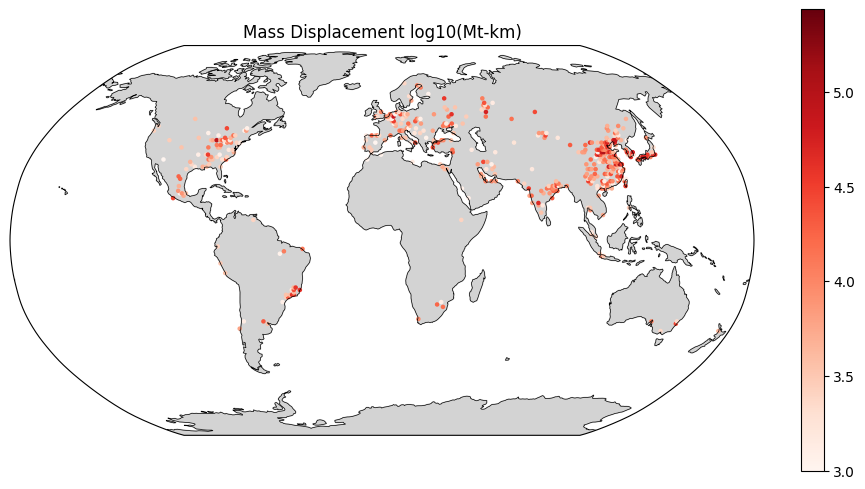

In [ ]:
import matplotlib.pyplot as plt

import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Load your shapefile
gdf_top20 = gdf_top20.to_crs(epsg=4326)  # Ensure data is in latitude and longitude

# Define the Robinson projection
projection = ccrs.Robinson()

# Create a subplot with the Robinson projection
fig, ax = plt.subplots(subplot_kw={'projection': projection}, figsize=(12, 6))

# Plotting the points
# Converting GeoDataFrame to use the `.plot` method from matplotlib for GeoDataFrames
gdf_top20.plot(column="log_km_mt", cmap="Reds", legend=True, markersize=5, ax=ax, transform=ccrs.Geodetic())

# Adding geographical features
ax.coastlines(resolution='110m', color='black', linewidth=0.5)
ax.add_feature(cfeature.LAND, color='lightgray',linewidth=1)
ax.set_global()  # Optionally set a global extent

# Set the title
ax.set_title('Mass Displacement log10(Mt-km)')

# Display the plot
plt.show()


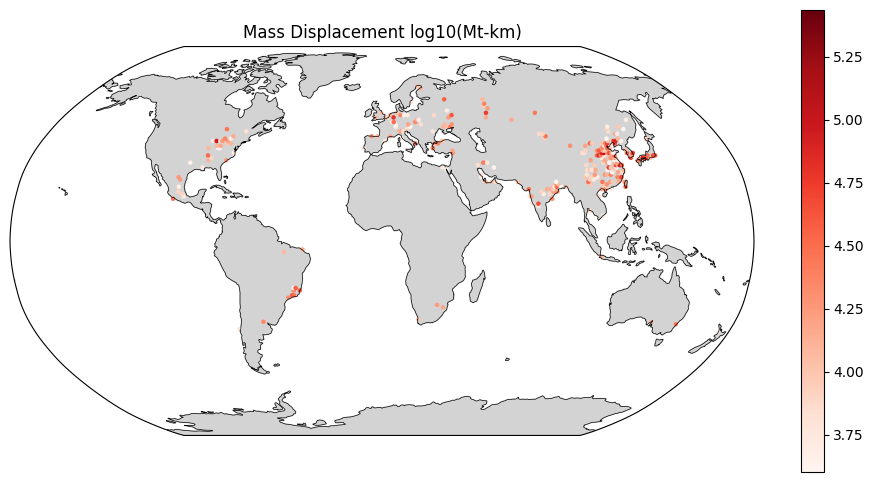

In [ ]:
import matplotlib.pyplot as plt

import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Load your shapefile
gdf_dest = gdf_top20.to_crs(epsg=4326)  # Ensure data is in latitude and longitude

# Define the Robinson projection
projection = ccrs.Robinson()

# Create a subplot with the Robinson projection
fig, ax = plt.subplots(subplot_kw={'projection': projection}, figsize=(12, 6))

# Plotting the points
# Converting GeoDataFrame to use the `.plot` method from matplotlib for GeoDataFrames
gdf_dest.plot(column="log_km_mt", cmap="Reds", legend=True, markersize=5, ax=ax, transform=ccrs.Geodetic())

# Adding geographical features
ax.coastlines(resolution='110m', color='black', linewidth=0.5)
ax.add_feature(cfeature.LAND, color='lightgray',linewidth=1)
ax.set_global()  # Optionally set a global extent

# Set the title
ax.set_title('Mass Displacement log10(Mt-km)')

# Display the plot
plt.show()


In [ ]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import numpy as np
import xarray as xr

# Load the flow dataset
ds = xr.load_dataset("gravity_model_output_2.nc")
flow = ds['flow'].values  # shape (origin, destination)

origin_lat = ds['origin_lat'].values
origin_lon = ds['origin_lon'].values
destination_lat = ds['destination_lat'].values
destination_lon = ds['destination_lon'].values

# Get all non-zero flows
origin_ids, dest_ids = np.nonzero(flow)
flow_vals = flow[origin_ids, dest_ids]

# Get coordinates of all valid flows
lat1 = origin_lat[origin_ids]
lon1 = origin_lon[origin_ids]
lat2 = destination_lat[dest_ids]
lon2 = destination_lon[dest_ids]

# Haversine distance function
def haversine_vectorized(lat1, lon1, lat2, lon2):
    R = 6371.0  # km
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat / 2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2.0)**2
    a = np.clip(a, 0, 1)
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
    return R * c

# Compute distances and mass displacement
distances = haversine_vectorized(lat1, lon1, lat2, lon2)
mass_displacement = flow_vals * distances

# Build flow-level DataFrame
flow_df = pd.DataFrame({
    "dest_id": dest_ids,
    "flow_mass": flow_vals,
    "distance_km": distances,
    "mass_displacement": mass_displacement
})

# Aggregate per destination node
agg_dest = (
    flow_df
    .groupby("dest_id")
    .agg(
        mass=("flow_mass", "sum"),
        mass_displacement=("mass_displacement", "sum")
    )
    .reset_index()
)

# Compute mean distance
agg_dest["mean_distance_km"] = agg_dest["mass_displacement"] / agg_dest["mass"]

# Build GeoDataFrame
geometry_dest = [Point(destination_lon[i], destination_lat[i]) for i in agg_dest["dest_id"]]
gdf_dest = gpd.GeoDataFrame(agg_dest, geometry=geometry_dest, crs="EPSG:4326")

# Optional: add log-scale
gdf_dest["km_mt"] = gdf_dest["mass_displacement"] * 1e-6
gdf_dest["log_km_mt"] = np.log10(gdf_dest["km_mt"])

# Final output
gdf_dest


,dest_id,mass,mass_displacement,mean_distance_km,geometry,km_mt,log_km_mt
0,0,1.747702e-05,2.408246e-01,13779.501099,POINT (-71.5 -55.5),2.408246e-07,-6.618299
1,1,8.802990e-03,1.211484e+02,13762.188113,POINT (-70.5 -55.5),1.211484e-04,-3.916682
2,2,1.003954e+00,1.379884e+04,13744.497904,POINT (-69.5 -55.5),1.379884e-02,-1.860157
3,3,2.153533e+03,2.956040e+07,13726.466884,POINT (-68.5 -55.5),2.956040e+01,1.470710
4,4,2.991706e+00,4.101071e+04,13708.132680,POINT (-67.5 -55.5),4.101071e-02,-1.387103
...,...,...,...,...,...,...,...
14035,14035,3.812507e-07,2.000465e-03,5247.111722,POINT (91.5 77.5),2.000465e-09,-8.698869
14036,14036,6.712327e-08,3.518885e-04,5242.421196,POINT (92.5 77.5),3.518885e-10,-9.453595
14037,14037,2.158978e-07,1.147673e-03,5315.814977,POINT (93.5 78.5),1.147673e-09,-8.940182
14038,14038,2.121794e-07,1.146516e-03,5403.523457,POINT (90.5 79.5),1.146516e-09,-8.940620


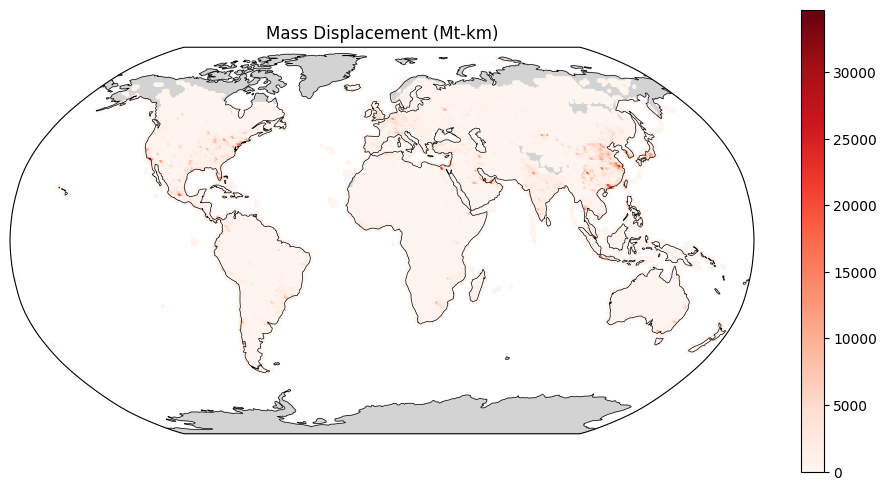

In [ ]:
import matplotlib.pyplot as plt

import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Load your shapefile
gdf_dest = gdf_dest.to_crs(epsg=4326)  # Ensure data is in latitude and longitude

# Define the Robinson projection
projection = ccrs.Robinson()

# Create a subplot with the Robinson projection
fig, ax = plt.subplots(subplot_kw={'projection': projection}, figsize=(12, 6))

# Plotting the points
# Converting GeoDataFrame to use the `.plot` method from matplotlib for GeoDataFrames
gdf_dest.plot(column="km_mt", cmap="Reds", legend=True, markersize=5, ax=ax, transform=ccrs.Geodetic())

# Adding geographical features
ax.coastlines(resolution='110m', color='black', linewidth=0.5)
ax.add_feature(cfeature.LAND, color='lightgray',linewidth=1)
ax.set_global()  # Optionally set a global extent

# Set the title
ax.set_title('Mass Displacement (Mt-km)')

# Display the plot
plt.show()


In [ ]:
country_gdf = gpd.read_file("/Users/faisal/Documents/GitHub/SESAME/src/sesame/data/CShapes_v2_converted_2023.shp")
country_gdf

,cntry_name,area,capname,caplong,caplat,gwcode,gwsdate,gwsyear,gwsmonth,gwsday,...,gwemonth,gweday,Shape_Leng,Shape_Area,ISO_A3,NAME_EN,ISO3,start_d,end_d,geometry
0,Afghanistan,641908.3,Kabul,69.18333,34.51667,700,1919-05-01,1919,5,1,...,12,31,50.7724438402,62.5672779274,nan,nan,AFG,1919-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((72.73387 37.13538, 72.75888 37.18068..."
1,Albania,28656.479,Tirane,19.81889,41.3275,339,1920-02-11,1920,2,11,...,12,31,9.60344542465,3.07370455193,nan,nan,ALB,1920-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((19.75433 42.64111, 19.76479 42.58787..."
2,Algeria,2317487.5,Algiers,3.050556,36.76305,615,1962-07-05,1962,7,5,...,12,31,70.5242220342,213.513311992,nan,nan,DZA,1962-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((8.63222 36.88195, 8.63805 36.83111, ..."
3,American Samoa,0.0,nan,0.0,0.0,0,2019-01-01,1950,1,1,...,1,1,1.07370505154,0.0151014394369,ASM,American Samoa,ASM,1950-01-01 00:00:00,2024-01-01 00:00:00,"MULTIPOLYGON (((-168.16157 -14.53289, -168.173..."
4,Andorra,0.0,nan,0.0,0.0,0,2019-01-01,1950,1,1,...,1,1,1.05795317667,0.0495607344854,AND,Andorra,AND,1950-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((1.47862 42.641, 1.48653 42.65042, 1...."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
241,Western Sahara,269071.7,El Aaiun,-13.200006,27.14998,609,1958-10-10,1958,10,10,...,11,13,28.7360378465,24.0016076004,nan,nan,ESH,1958-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((-17.07028 20.92083, -17.07555 20.899..."
242,Yemen (Arab Republic of Yemen),453630.66,Sana'a,44.18333,15.28333,678,2000-06-12,2000,6,12,...,12,31,34.0166451987,38.2880671975,nan,nan,YEM,2000-01-01 00:00:00,2024-01-01 00:00:00,"MULTIPOLYGON (((52.38853 12.15097, 52.34138 12..."
243,Zambia,751926.8,Lusaka,28.28333,-15.41667,551,1964-01-22,1964,1,22,...,12,31,49.1213092363,62.8145883465,nan,nan,ZMB,1964-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((32.94055 -9.40933, 32.9436 -9.45584,..."
244,Zimbabwe (Rhodesia),389856.06,Harare,31.04472,-17.81778,552,1965-11-11,1965,11,11,...,12,31,26.2389597272,33.4624061942,nan,nan,ZWE,1965-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((30.41634 -15.63579, 30.42236 -16.005..."


In [ ]:
region_mapping = {
    'Australia and New Zealand': 'Oceania',
    'Caribbean': 'Latin America and Caribbean',
    'Central America': 'Latin America and Caribbean',
    'Central Asia': 'Rest of Asia',
    'Eastern Africa': 'Africa',
    'Eastern Asia': 'Eastern Asia',
    'Eastern Europe': 'Europe',
    'Melanesia': 'Oceania',
    'Micronesia': 'Oceania',
    'Middle Africa': 'Africa',
    'Northern Africa': 'Africa',
    'Northern America': 'Northern America',
    'Northern Europe': 'Europe',
    'Polynesia': 'Oceania',
    'South America': 'Latin America and Caribbean',
    'South-eastern Asia': 'Rest of Asia',
    'Southern Africa': 'Africa',
    'Southern Asia': 'Rest of Asia',
    'Southern Europe': 'Europe',
    'Western Africa': 'Africa',
    'Western Asia': 'Rest of Asia',
    'Western Europe': 'Europe'
}

df_region = pd.read_csv("/Users/faisal/Documents/GitHub/SESAME/src/sesame/data/un_geoscheme.csv")
# Assuming df_ex_prod is your DataFrame
df_region['Aggregate_Region'] = df_region['region_2'].map(region_mapping)
df_region = df_region.rename(columns={"ISO-alpha3 code":"ISO3"})
df_region

,region_0,region_1,region_2,region_3,M49 code,ISO3,Aggregate_Region
0,Africa,Northern Africa,Northern Africa,Algeria,12.0,DZA,Africa
1,Africa,Northern Africa,Northern Africa,Egypt,818.0,EGY,Africa
2,Africa,Northern Africa,Northern Africa,Libya,434.0,LBY,Africa
3,Africa,Northern Africa,Northern Africa,Morocco,504.0,MAR,Africa
4,Africa,Northern Africa,Northern Africa,Sudan,729.0,SDN,Africa
...,...,...,...,...,...,...,...
245,Oceania,Oceania,Polynesia,Samoa,882.0,WSM,Oceania
246,Oceania,Oceania,Polynesia,Tokelau,772.0,TKL,Oceania
247,Oceania,Oceania,Polynesia,Tonga,776.0,TON,Oceania
248,Oceania,Oceania,Polynesia,Tuvalu,798.0,TUV,Oceania


In [ ]:
df_country = country_gdf.merge(df_region[["ISO3", "Aggregate_Region"]], on=["ISO3"])
df_country

,cntry_name,area,capname,caplong,caplat,gwcode,gwsdate,gwsyear,gwsmonth,gwsday,...,gweday,Shape_Leng,Shape_Area,ISO_A3,NAME_EN,ISO3,start_d,end_d,geometry,Aggregate_Region
0,Afghanistan,641908.3,Kabul,69.18333,34.51667,700,1919-05-01,1919,5,1,...,31,50.7724438402,62.5672779274,nan,nan,AFG,1919-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((72.73387 37.13538, 72.75888 37.18068...",Rest of Asia
1,Albania,28656.479,Tirane,19.81889,41.3275,339,1920-02-11,1920,2,11,...,31,9.60344542465,3.07370455193,nan,nan,ALB,1920-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((19.75433 42.64111, 19.76479 42.58787...",Europe
2,Algeria,2317487.5,Algiers,3.050556,36.76305,615,1962-07-05,1962,7,5,...,31,70.5242220342,213.513311992,nan,nan,DZA,1962-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((8.63222 36.88195, 8.63805 36.83111, ...",Africa
3,American Samoa,0.0,nan,0.0,0.0,0,2019-01-01,1950,1,1,...,1,1.07370505154,0.0151014394369,ASM,American Samoa,ASM,1950-01-01 00:00:00,2024-01-01 00:00:00,"MULTIPOLYGON (((-168.16157 -14.53289, -168.173...",Oceania
4,Andorra,0.0,nan,0.0,0.0,0,2019-01-01,1950,1,1,...,1,1.05795317667,0.0495607344854,AND,Andorra,AND,1950-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((1.47862 42.641, 1.48653 42.65042, 1....",Europe
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
241,Western Sahara,269071.7,El Aaiun,-13.200006,27.14998,609,1958-10-10,1958,10,10,...,13,28.7360378465,24.0016076004,nan,nan,ESH,1958-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((-17.07028 20.92083, -17.07555 20.899...",Africa
242,Yemen (Arab Republic of Yemen),453630.66,Sana'a,44.18333,15.28333,678,2000-06-12,2000,6,12,...,31,34.0166451987,38.2880671975,nan,nan,YEM,2000-01-01 00:00:00,2024-01-01 00:00:00,"MULTIPOLYGON (((52.38853 12.15097, 52.34138 12...",Rest of Asia
243,Zambia,751926.8,Lusaka,28.28333,-15.41667,551,1964-01-22,1964,1,22,...,31,49.1213092363,62.8145883465,nan,nan,ZMB,1964-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((32.94055 -9.40933, 32.9436 -9.45584,...",Africa
244,Zimbabwe (Rhodesia),389856.06,Harare,31.04472,-17.81778,552,1965-11-11,1965,11,11,...,31,26.2389597272,33.4624061942,nan,nan,ZWE,1965-01-01 00:00:00,2024-01-01 00:00:00,"POLYGON ((30.41634 -15.63579, 30.42236 -16.005...",Africa


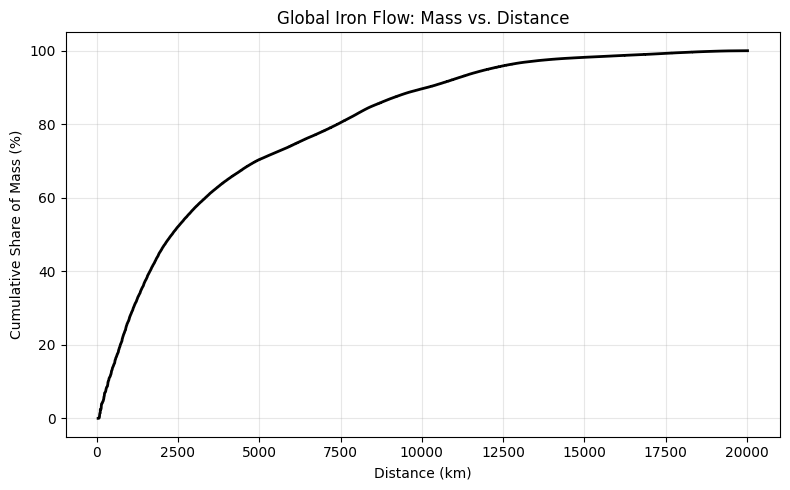

In [ ]:
# Create the full flow-level DataFrame again
cdf_df = pd.DataFrame({
    "distance_km": distances,
    "flow_mass": flow_vals
})

# Sort by distance
cdf_df = cdf_df.sort_values("distance_km").reset_index(drop=True)

# Calculate cumulative sum of mass
cdf_df["cum_mass"] = cdf_df["flow_mass"].cumsum()

# Normalize to percent of total mass
total_mass = cdf_df["flow_mass"].sum()
cdf_df["mass_percent"] = 100 * cdf_df["cum_mass"] / total_mass

# Plot
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
plt.plot(cdf_df["distance_km"], cdf_df["mass_percent"], color='black', linewidth=2)
plt.xlabel("Distance (km)")
plt.ylabel("Cumulative Share of Mass (%)")
plt.title("Global Iron Flow: Mass vs. Distance")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [ ]:
# 1. Create unique origin cell points
unique_origin_ids, inverse_idx = np.unique(origin_ids, return_inverse=True)
unique_origin_points = gpd.GeoDataFrame(
    geometry=[Point(origin_lon[i], origin_lat[i]) for i in unique_origin_ids],
    crs="EPSG:4326"
)

# 2. Buffer countries to avoid missing edge cases
df_country_buffered = df_country.copy()
df_country_buffered["geometry"] = df_country_buffered["geometry"].buffer(0.7)

# 3. Spatial join origin points to region polygons
unique_with_region = gpd.sjoin(
    unique_origin_points,
    df_country_buffered[["Aggregate_Region", "geometry"]],
    how="left",
    predicate="within"
)

# 4. Map region back to original flow_df based on origin_id
region_array = unique_with_region["Aggregate_Region"].values
flow_df["region"] = region_array[inverse_idx]  # Now region = region of origin
flow_df

,dest_id,flow_mass,distance_km,mass_displacement,region
0,0,1.325590e-08,9124.526290,1.209538e-04,Oceania
1,1,6.647131e-06,9153.813315,6.084660e-02,Oceania
2,2,7.547565e-04,9182.361825,6.930447e+00,Oceania
3,3,1.611987e+00,9210.165017,1.484667e+04,Oceania
4,4,2.229845e-03,9237.216207,2.059756e+01,Oceania
...,...,...,...,...,...
7974136,14035,2.445355e-10,2649.960154,6.480095e-07,Europe
7974137,14036,4.264300e-11,2673.053349,1.139870e-07,Europe
7974138,14037,1.395308e-10,2664.394804,3.717650e-07,Europe
7974139,14038,1.440990e-10,2577.327154,3.713903e-07,Europe


In [ ]:
flow_df["region"].unique()

array(['Oceania', 'Latin America and Caribbean', 'Africa', 'Rest of Asia',
       'Eastern Asia', 'Northern America', 'Europe'], dtype=object)

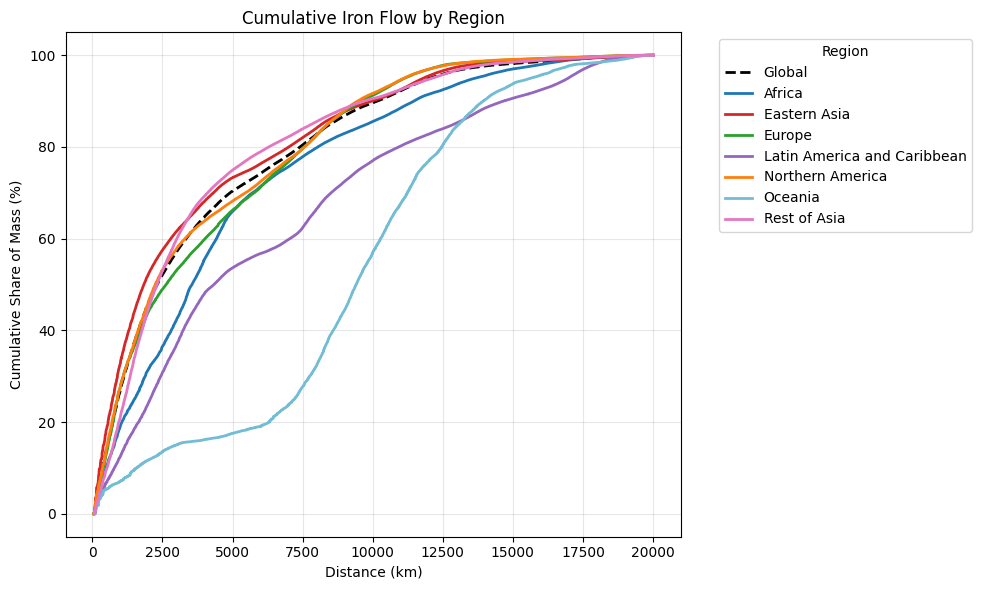

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))

# Optional: custom color palette
region_colors = {
    "Africa": "#1f77b4",                      # blue
    "Eastern Asia": "#d62728",                # red
    "Europe": "#2ca02c",                      # green
    "Latin America and Caribbean": "#9467bd", # purple
    "Northern America": "#ff7f0e",            # orange
    "Oceania": "#72bcd4",                     # lightblue
    "Rest of Asia": "#e377c2",                # pink
}

# 3. Group and plot
# Global curve (no filtering)
global_sorted = flow_df.sort_values("distance_km")
cum_mass = global_sorted["flow_mass"].cumsum()
mass_percent = 100 * cum_mass / global_sorted["flow_mass"].sum()

plt.plot(
    global_sorted["distance_km"],
    mass_percent,
    label="Global",
    color="black",
    linewidth=2,
    linestyle='--'
)

for region, group in flow_df.groupby("region"):
    if group.empty or pd.isnull(region):
        continue
    group_sorted = group.sort_values("distance_km")
    cum_mass = group_sorted["flow_mass"].cumsum()
    mass_percent = 100 * cum_mass / group_sorted["flow_mass"].sum()
    plt.plot(
        group_sorted["distance_km"], mass_percent,
        label=region,
        color=region_colors.get(region, None), linewidth=2
    )

plt.xlabel("Distance (km)")
plt.ylabel("Cumulative Share of Mass (%)")
plt.title("Cumulative Iron Flow by Region")
plt.legend(title="Region", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()
